# Final Project - Introduction to Computer Vision

Shahar Eliyahu - 318917952

## Project Overview

In this project, I create a custom dataset for an object detection task.

The main goal is to detect two types of objects:

* Person
* Vehicle

The dataset is created in a semi-supervised way.
This means that instead of manually labeling all images, I use existing information from the dataset together with a large vision model to help generate automatic annotations.

First, I use the textual captions from the Flickr30k dataset to better understand the dataset and identify candidate images that may contain people or vehicles.

Then, I use Florence-2 as a large vision-language model to generate bounding box annotations for the selected images.

After creating the dataset, a smaller object detection model will be trained on these annotations.
The smaller model should be more suitable for deployment on edge devices, such as NVIDIA Jetson or Raspberry Pi.

## General Idea

The project is based on the idea of using a large vision model to generate training data, and then using this data to train a smaller and more efficient object detection model.

The process includes:

1. Analyzing the Flickr30k captions
2. Selecting candidate images using text-based filtering
3. Generating bounding boxes using Florence-2
4. Filtering noisy or irrelevant annotations
5. Saving the final dataset in YOLO format
6. Training and evaluating a YOLO detection model

# 1. Creating the Training Dataset

In this section, I create a semi-supervised dataset for an object detection task.

The final dataset contains two high-level classes:

| Class ID | Class Name |
|---|---|
| 0 | person |
| 1 | vehicle |

The `person` class includes people-related objects such as men, women, boys, girls, children, babies, and adults.

The `vehicle` class includes several vehicle-related subcategories such as cars, vans, buses, trucks, bicycles, motorcycles, scooters, taxis, and other land vehicles.

Before generating automatic bounding boxes, I first analyze the Flickr30k captions.  
This allows me to understand the dataset and select candidate images that are likely to contain objects from the final project classes.

After this text-based pre-filtering step, Florence-2 is used as a large vision-language model to generate bounding box annotations for the selected images.

The dataset should include at least 500 training images and 100 validation images for each final class, when possible.

## Sections in Part 1

1.1 Dataset Structure  
1.2 Dataset Configuration  
1.3 Annotation Model Selection  
1.4 Loading the Source Images and Captions  

1.5 Essential Data Analysis and Candidate Selection  
&nbsp;&nbsp;&nbsp;&nbsp;- Preview source images  
&nbsp;&nbsp;&nbsp;&nbsp;- Preview images with captions  
&nbsp;&nbsp;&nbsp;&nbsp;- Textual EDA using Flickr30k captions  
&nbsp;&nbsp;&nbsp;&nbsp;- Person vs vehicle candidate distribution  
&nbsp;&nbsp;&nbsp;&nbsp;- Person subcategory distribution  
&nbsp;&nbsp;&nbsp;&nbsp;- Vehicle subcategory distribution  
&nbsp;&nbsp;&nbsp;&nbsp;- Caption-based candidate image pools  
&nbsp;&nbsp;&nbsp;&nbsp;- Balanced candidate selection for Florence-2  
&nbsp;&nbsp;&nbsp;&nbsp;- Selected candidate coverage analysis    

1.6 Loading Florence-2  
1.7 Generating Automatic Annotations  

1.8 Post-Annotation Filtering  
&nbsp;&nbsp;&nbsp;&nbsp;- Run Florence-2 once for post-annotation analysis  
&nbsp;&nbsp;&nbsp;&nbsp;- Inspecting Florence-2 detected labels  
&nbsp;&nbsp;&nbsp;&nbsp;- Final label mapping  
&nbsp;&nbsp;&nbsp;&nbsp;- Size threshold analysis  
&nbsp;&nbsp;&nbsp;&nbsp;- Image size threshold analysis  
&nbsp;&nbsp;&nbsp;&nbsp;- Images with no relevant detections  
&nbsp;&nbsp;&nbsp;&nbsp;- Object and image size decisions  
&nbsp;&nbsp;&nbsp;&nbsp;- Size filtering rules  
&nbsp;&nbsp;&nbsp;&nbsp;- Visual inspection of rejected detections  
&nbsp;&nbsp;&nbsp;&nbsp;- TTA consistency filtering  

1.9 Saving Labels in YOLO Format  
1.10 Dataset Summary  
1.11 TTA and Ensemble Explanation

In [1]:
# Install required libraries
# Remove the # only if the package is not installed yet

#!pip install matplotlib
#!pip install pillow

# PyTorch with CUDA 12.8 support
#!pip install torch torchvision torchaudio --index-url https://download.pytorch.org/whl/cu128

# Florence-2 dependencies
# If Florence-2 gives compatibility errors, use the fixed transformers version below
#!pip uninstall -y transformers
#!pip install transformers==4.49.0 accelerate timm einops
%matplotlib inline


# Imports
from pathlib import Path
import random
import shutil
import torch
import matplotlib.pyplot as plt
from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM
import matplotlib.patches as patches
import math
import numpy as np


### 1.1 Dataset Structure

I organize the dataset in YOLO format.

Each image has a matching label file with the same name.  
The label file contains the bounding boxes for the objects in the image.

Each label line will be written as:

class_id center_x center_y width height

In [2]:
from pathlib import Path

DATASET_DIR = Path("yolo_dataset")

TRAIN_IMAGES_DIR = DATASET_DIR / "images" / "train"
VAL_IMAGES_DIR = DATASET_DIR / "images" / "val"

TRAIN_LABELS_DIR = DATASET_DIR / "labels" / "train"
VAL_LABELS_DIR = DATASET_DIR / "labels" / "val"

for directory in [
    TRAIN_IMAGES_DIR,
    VAL_IMAGES_DIR,
    TRAIN_LABELS_DIR,
    VAL_LABELS_DIR
]:
    directory.mkdir(parents=True, exist_ok=True)

print("Dataset folders were created successfully.")

Dataset folders were created successfully.


### 1.2 Dataset Configuration

I define the dataset classes and create a `data.yaml` file.

This file tells the training framework where the images are located and what class names are used.

In [3]:
# Class names
CLASS_NAMES = ["person", "vehicle"]

# Create data.yaml content
data_yaml = f"""
path: {DATASET_DIR.resolve().as_posix()}
train: images/train
val: images/val

names:
  0: person
  1: vehicle
"""

# Save data.yaml
data_yaml_path = DATASET_DIR / "data.yaml"
data_yaml_path.write_text(data_yaml, encoding="utf-8")

print("data.yaml was created successfully:")
print(data_yaml)

data.yaml was created successfully:

path: C:/Users/shaha/jupyter_notebooks/Computer_Vision/Final_project_1/yolo_dataset
train: images/train
val: images/val

names:
  0: person
  1: vehicle



### 1.3 Annotation Model Selection

For the automatic annotation step, I use Florence-2 in inference mode.

Florence-2 is used as the large vision-language model that generates bounding box annotations for the selected images.

The model is not trained in this project.  
It is only used to create initial labels for the smaller detection model.

I chose Florence-2 because it can generate bounding box annotations from text-based prompts, which fits the project need to label `person` and `vehicle` objects automatically.

In this project, the Flickr30k captions are first used for textual analysis and candidate image selection.  
Florence-2 is then used to generate the actual bounding boxes for those images.

### 1.4 Loading the Source Images and Captions

In this step, I load the source images from the local Flickr30k dataset folder.

I also load the Flickr30k captions file, `results.csv`.

The images will later be used by Florence-2 to generate automatic bounding box annotations.  
The captions will be used before that as a text-based analysis and pre-filtering step.

In [4]:
from pathlib import Path
import pandas as pd

# Flickr30k dataset folders and files
SOURCE_IMAGES_DIR = Path("flickr30k_dataset") / "flickr30k_images"
CAPTIONS_PATH = SOURCE_IMAGES_DIR / "results.csv"

print("Images folder exists:", SOURCE_IMAGES_DIR.exists())
print("Images folder path:", SOURCE_IMAGES_DIR)

print("Captions file exists:", CAPTIONS_PATH.exists())
print("Captions file path:", CAPTIONS_PATH)

# Supported image formats
image_extensions = ["*.jpg", "*.jpeg", "*.png"]

# Collect image paths only from this folder
source_image_paths = []

for extension in image_extensions:
    source_image_paths.extend(SOURCE_IMAGES_DIR.glob(extension))

# Remove duplicate image names just in case
image_path_lookup = {path.name: path for path in source_image_paths}
source_image_paths = list(image_path_lookup.values())

print("\nNumber of source images found:", len(source_image_paths))
print("Unique image names:", len(image_path_lookup))

# Load Flickr30k captions
captions_df = pd.read_csv(CAPTIONS_PATH, sep="|")

# Clean column names
captions_df.columns = captions_df.columns.str.strip()

print("\nCaptions dataframe shape:", captions_df.shape)
print("Caption columns:", captions_df.columns.tolist())

display(captions_df.head())

Images folder exists: True
Images folder path: flickr30k_dataset\flickr30k_images
Captions file exists: True
Captions file path: flickr30k_dataset\flickr30k_images\results.csv

Number of source images found: 31783
Unique image names: 31783

Captions dataframe shape: (158915, 3)
Caption columns: ['image_name', 'comment_number', 'comment']


,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .


#### Preview Images with Their Captions

I display the first five unique images together with their captions.

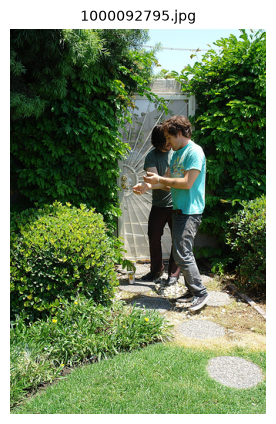

Captions for 1000092795.jpg:
------------------------------------------------------------
1.  Two young guys with shaggy hair look at their hands while hanging out in the yard .
2.  Two young , White males are outside near many bushes .
3.  Two men in green shirts are standing in a yard .
4.  A man in a blue shirt standing in a garden .
5.  Two friends enjoy time spent together .




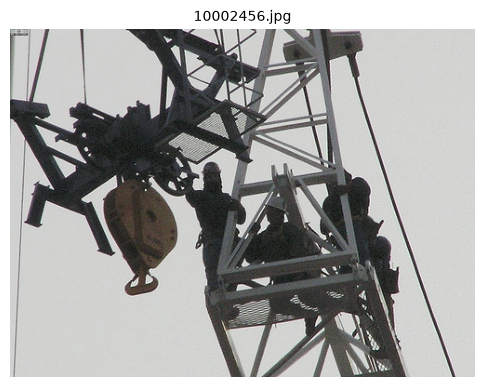

Captions for 10002456.jpg:
------------------------------------------------------------
1.  Several men in hard hats are operating a giant pulley system .
2.  Workers look down from up above on a piece of equipment .
3.  Two men working on a machine wearing hard hats .
4.  Four men on top of a tall structure .
5.  Three men on a large rig .




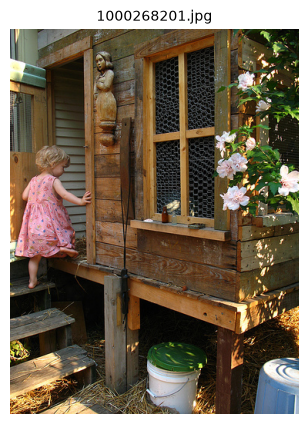

Captions for 1000268201.jpg:
------------------------------------------------------------
1.  A child in a pink dress is climbing up a set of stairs in an entry way .
2.  A little girl in a pink dress going into a wooden cabin .
3.  A little girl climbing the stairs to her playhouse .
4.  A little girl climbing into a wooden playhouse
5.  A girl going into a wooden building .




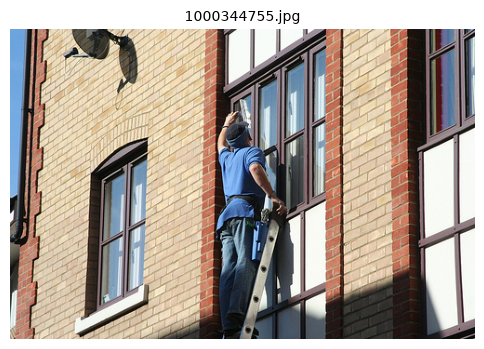

Captions for 1000344755.jpg:
------------------------------------------------------------
1.  Someone in a blue shirt and hat is standing on stair and leaning against a window .
2.  A man in a blue shirt is standing on a ladder cleaning a window .
3.  A man on a ladder cleans the window of a tall building .
4.  man in blue shirt and jeans on ladder cleaning windows
5.  a man on a ladder cleans a window




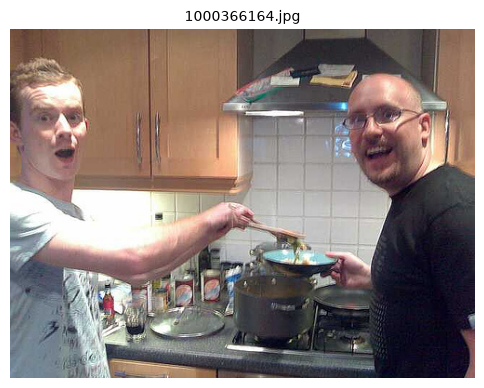

Captions for 1000366164.jpg:
------------------------------------------------------------
1.  Two men , one in a gray shirt , one in a black shirt , standing near a stove .
2.  Two guy cooking and joking around with the camera .
3.  Two men in a kitchen cooking food on a stove .
4.  Two men are at the stove preparing food .
5.  Two men are cooking a meal .




In [5]:
import matplotlib.pyplot as plt
from PIL import Image
import textwrap

# Get first 5 unique image names from the captions file
first_image_names = captions_df["image_name"].drop_duplicates().head(5).tolist()

for image_name in first_image_names:
    image_path = SOURCE_IMAGES_DIR / image_name
    
    if not image_path.exists():
        print(f"Image not found: {image_name}")
        continue
    
    # Load image
    image = Image.open(image_path).convert("RGB")
    
    # Get all captions for this image
    image_captions = captions_df[captions_df["image_name"] == image_name]["comment"].tolist()
    
    # Display image
    plt.figure(figsize=(6, 5))
    plt.imshow(image)
    plt.title(image_name, fontsize=10)
    plt.axis("off")
    plt.show()
    
    # Display captions
    print(f"Captions for {image_name}:")
    print("-" * 60)
    
    for i, caption in enumerate(image_captions, start=1):
        wrapped_caption = textwrap.fill(caption, width=90)
        print(f"{i}. {wrapped_caption}")
    
    print("\n" + "=" * 80 + "\n")

### 1.5 Essential Data Analysis and Candidate Selection

Before generating automatic annotations with Florence-2, I perform an Essential Data Analysis (EDA) step.

The goal of this step is to understand the Flickr30k dataset before selecting images for the final YOLO dataset.

This analysis includes both visual inspection and textual analysis of the Flickr30k captions.

Since the final classes are `person` and `vehicle`, I analyze the captions to find words related to people and vehicles.

This allows me to create candidate image pools based on the captions instead of selecting images blindly at random.

After this step, Florence-2 will be used only on candidate images to generate bounding box annotations.

#### Preview Source Images

I display a few sample images to make sure the Flickr30k images were loaded correctly.

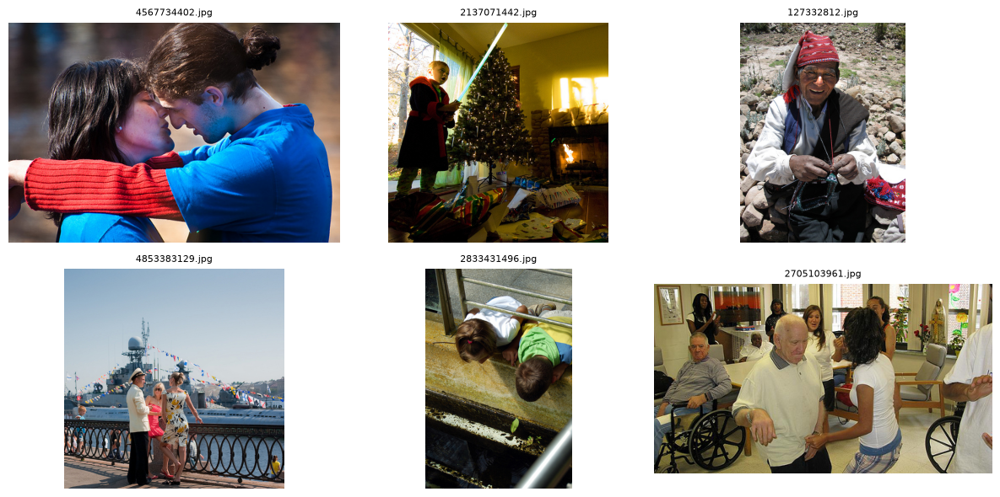

In [6]:
import random
from PIL import Image
import matplotlib.pyplot as plt

random.seed(42)

# Select random sample images for visual inspection
sample_images = random.sample(source_image_paths, min(6, len(source_image_paths)))

plt.figure(figsize=(12, 6))

for i, image_path in enumerate(sample_images):
    image = Image.open(image_path).convert("RGB")
    
    plt.subplot(2, 3, i + 1)
    plt.imshow(image)
    plt.title(image_path.name, fontsize=8)
    plt.axis("off")

plt.tight_layout()
plt.show()

#### Textual EDA Using Flickr30k Captions

In this step, I analyze the Flickr30k captions and count words related to the final project classes.

This helps me understand how often person-related and vehicle-related words appear in the textual part of the dataset.

In [7]:
# Define the expected columns in Flickr30k results.csv
image_column = "image_name"
caption_column = "comment"

print("Available columns:", captions_df.columns.tolist())
print("Using image column:", image_column)
print("Using caption column:", caption_column)

# Safety check
if image_column not in captions_df.columns:
    raise ValueError(f"Image column '{image_column}' was not found in captions_df")

if caption_column not in captions_df.columns:
    raise ValueError(f"Caption column '{caption_column}' was not found in captions_df")

Available columns: ['image_name', 'comment_number', 'comment']
Using image column: image_name
Using caption column: comment


In [8]:
from collections import Counter
import re

# Clean captions
captions_text = (
    captions_df[caption_column]
    .fillna("")
    .astype(str)
    .str.lower()
)

person_keywords = [
    "person", "people", "man", "woman", "boy", "girl",
    "child", "children", "baby", "kid", "kids", "adult"
]

vehicle_keywords = [
    "vehicle", "vehicles", "car", "cars", "automobile", "automobiles",
    "taxi", "cab", "sedan", "suv", "jeep", "van", "vans",
    "minivan", "bus", "buses", "minibus", "truck", "trucks",
    "pickup", "lorry", "bike", "bikes", "bicycle", "bicycles",
    "motorcycle", "motorcycles", "motorbike", "motorbikes",
    "scooter", "scooters"
]

keyword_counts = Counter()

for caption in captions_text:
    words = re.findall(r"\b[a-zA-Z]+\b", caption)

    for keyword in person_keywords + vehicle_keywords:
        if keyword in words:
            keyword_counts[keyword] += 1

print("Keyword counts in Flickr30k captions:")
print("-" * 40)

for keyword, count in keyword_counts.most_common():
    print(f"{keyword}: {count}")

Keyword counts in Flickr30k captions:
----------------------------------------
man: 40817
woman: 21497
people: 17108
girl: 9387
boy: 9208
child: 4960
children: 4420
person: 4411
bike: 2460
car: 1712
baby: 1635
bicycle: 1545
kids: 1187
motorcycle: 776
truck: 764
bus: 719
kid: 590
adult: 490
bikes: 432
vehicle: 405
cars: 392
bicycles: 285
scooter: 251
van: 180
motorcycles: 160
motorbike: 121
vehicles: 95
taxi: 92
jeep: 55
scooters: 54
suv: 53
cab: 47
trucks: 46
motorbikes: 32
pickup: 30
automobile: 27
buses: 26
minivan: 18
sedan: 10
vans: 8
automobiles: 7


#### Person vs Vehicle Candidate Distribution

In this step, I count how many unique images are likely to contain people or vehicles according to their captions.

This is more useful than counting only word appearances, because each image in Flickr30k may have several captions.

In [9]:
person_keywords_set = set(person_keywords)
vehicle_keywords_set = set(vehicle_keywords)

person_candidate_images = set()
vehicle_candidate_images = set()

for _, row in captions_df.iterrows():
    image_name = str(row[image_column]).strip()
    caption = str(row[caption_column]).lower()
    
    words = set(re.findall(r"\b[a-zA-Z]+\b", caption))
    
    if words & person_keywords_set:
        person_candidate_images.add(image_name)
    
    if words & vehicle_keywords_set:
        vehicle_candidate_images.add(image_name)

print("Unique person candidate images:", len(person_candidate_images))
print("Unique vehicle candidate images:", len(vehicle_candidate_images))
print("Images that contain both person and vehicle keywords:", len(person_candidate_images & vehicle_candidate_images))

Unique person candidate images: 27365
Unique vehicle candidate images: 3318
Images that contain both person and vehicle keywords: 2971


#### Vehicle Subcategory Distribution

Since `vehicle` is a broad class, I inspect its internal subcategories.

This helps me understand how many candidate images are related to cars, buses, trucks, bicycles, motorcycles, scooters, vans, and taxis.

In [10]:
from collections import defaultdict
import pandas as pd

vehicle_keyword_groups = {
    "car": {"car", "cars", "automobile", "automobiles", "sedan", "suv", "jeep"},
    "taxi_or_cab": {"taxi", "cab"},
    "van": {"van", "vans", "minivan"},
    "bus": {"bus", "buses", "minibus"},
    "truck": {"truck", "trucks", "pickup", "lorry"},
    "bicycle": {"bike", "bikes", "bicycle", "bicycles"},
    "motorcycle": {"motorcycle", "motorcycles", "motorbike", "motorbikes"},
    "scooter": {"scooter", "scooters"},
    "general_vehicle": {"vehicle", "vehicles"}
}

vehicle_subcategory_images = defaultdict(set)

for _, row in captions_df.iterrows():
    image_name = str(row[image_column]).strip()
    caption = str(row[caption_column]).lower()
    
    words = set(re.findall(r"\b[a-zA-Z]+\b", caption))
    
    for subcategory, keywords in vehicle_keyword_groups.items():
        if words & keywords:
            vehicle_subcategory_images[subcategory].add(image_name)

subcategory_summary = []

for subcategory, images in vehicle_subcategory_images.items():
    subcategory_summary.append({
        "subcategory": subcategory,
        "unique_candidate_images": len(images)
    })

subcategory_df = pd.DataFrame(subcategory_summary).sort_values(
    by="unique_candidate_images",
    ascending=False
)

display(subcategory_df)

,subcategory,unique_candidate_images
2,bicycle,1449
3,car,933
8,motorcycle,410
4,general_vehicle,393
6,truck,366
0,bus,312
5,scooter,129
1,van,122
7,taxi_or_cab,62


In [11]:
from collections import defaultdict
import pandas as pd
import re

person_keyword_groups = {
    "man": {"man", "men", "male"},
    "woman": {"woman", "women", "female"},
    "boy": {"boy", "boys"},
    "girl": {"girl", "girls"},
    "child": {"child", "children", "kid", "kids"},
    "baby": {"baby", "babies"},
    "adult": {"adult", "adults"},
    "general_person": {"person", "people"}
}

person_subcategory_images = defaultdict(set)

for _, row in captions_df.iterrows():
    image_name = str(row[image_column]).strip()
    caption = str(row[caption_column]).lower()
    
    words = set(re.findall(r"\b[a-zA-Z]+\b", caption))
    
    for subcategory, keywords in person_keyword_groups.items():
        if words & keywords:
            person_subcategory_images[subcategory].add(image_name)

person_subcategory_summary = []

for subcategory, images in person_subcategory_images.items():
    person_subcategory_summary.append({
        "subcategory": subcategory,
        "unique_candidate_images": len(images)
    })

person_subcategory_df = pd.DataFrame(person_subcategory_summary).sort_values(
    by="unique_candidate_images",
    ascending=False
)

display(person_subcategory_df)

,subcategory,unique_candidate_images
0,man,16436
3,general_person,10435
6,woman,9716
1,child,5086
2,girl,4986
4,boy,4498
5,adult,954
7,baby,714


#### Person Subcategory Distribution Summary

The person subcategory analysis shows that the `person` class also contains several internal textual groups.

According to the Flickr30k captions, the most common person-related candidate images are related to `man`, `general_person`, `woman`, `child`, `girl`, and `boy`.

This shows that the `person` class is also broad, although it is much more frequent in the dataset than the `vehicle` class.

This analysis helps me understand the internal structure of the `person` class before selecting images for automatic annotation.



#### Caption-Based Candidate Image Pools

Based on the textual EDA, I create the final candidate image pool.

Only images that contain person-related or vehicle-related keywords in their captions are selected as candidates.

Florence-2 will later be applied to these candidate images.

In [12]:
from collections import defaultdict
import pandas as pd
import re

# Expected Flickr30k columns
image_column = "image_name"
caption_column = "comment"

print("Available columns:", captions_df.columns.tolist())
print("Using image column:", image_column)
print("Using caption column:", caption_column)

# Safety checks
if image_column not in captions_df.columns:
    raise ValueError(f"Image column '{image_column}' was not found in captions_df")

if caption_column not in captions_df.columns:
    raise ValueError(f"Caption column '{caption_column}' was not found in captions_df")



# Step 1: Group all captions of the same image


image_caption_df = (
    captions_df
    .groupby(image_column)[caption_column]
    .apply(lambda captions: " ".join(captions.fillna("").astype(str)))
    .reset_index()
)

image_caption_df.columns = [image_column, "combined_caption"]

print("\nNumber of unique images with captions:", len(image_caption_df))
display(image_caption_df.head())



# Step 2: Define keyword groups according to project classes


person_keyword_groups = {
    "man": {"man", "men", "male"},
    "woman": {"woman", "women", "female"},
    "boy": {"boy", "boys"},
    "girl": {"girl", "girls"},
    "child": {"child", "children", "kid", "kids"},
    "baby": {"baby", "babies"},
    "adult": {"adult", "adults"},
    "general_person": {"person", "people"}
}

vehicle_keyword_groups = {
    "car": {"car", "cars", "automobile", "automobiles", "sedan", "suv", "jeep"},
    "taxi_or_cab": {"taxi", "cab"},
    "van": {"van", "vans", "minivan"},
    "bus": {"bus", "buses", "minibus"},
    "truck": {"truck", "trucks", "pickup", "lorry"},
    "bicycle": {"bike", "bikes", "bicycle", "bicycles"},
    "motorcycle": {"motorcycle", "motorcycles", "motorbike", "motorbikes"},
    "scooter": {"scooter", "scooters"},
    "general_vehicle": {"vehicle", "vehicles"}
}

person_keywords = set().union(*person_keyword_groups.values())
vehicle_keywords = set().union(*vehicle_keyword_groups.values())



# Step 3: Create candidate image pools


person_candidate_images = set()
vehicle_candidate_images = set()

person_subcategory_images = defaultdict(set)
vehicle_subcategory_images = defaultdict(set)

for _, row in image_caption_df.iterrows():
    image_name = str(row[image_column]).strip()
    combined_caption = str(row["combined_caption"]).lower()

    words = set(re.findall(r"\b[a-zA-Z]+\b", combined_caption))

    # Person candidates
    if words & person_keywords:
        person_candidate_images.add(image_name)

    # Vehicle candidates
    if words & vehicle_keywords:
        vehicle_candidate_images.add(image_name)

    # Person subcategories
    for subcategory, keywords in person_keyword_groups.items():
        if words & keywords:
            person_subcategory_images[subcategory].add(image_name)

    # Vehicle subcategories
    for subcategory, keywords in vehicle_keyword_groups.items():
        if words & keywords:
            vehicle_subcategory_images[subcategory].add(image_name)



# Step 4: Create summary tables


person_subcategory_df = pd.DataFrame([
    {
        "subcategory": subcategory,
        "unique_candidate_images": len(images)
    }
    for subcategory, images in person_subcategory_images.items()
]).sort_values(by="unique_candidate_images", ascending=False)

vehicle_subcategory_df = pd.DataFrame([
    {
        "subcategory": subcategory,
        "unique_candidate_images": len(images)
    }
    for subcategory, images in vehicle_subcategory_images.items()
]).sort_values(by="unique_candidate_images", ascending=False)


print("\nPerson / Vehicle candidate image distribution")
print("-" * 50)
print("Unique person candidate images:", len(person_candidate_images))
print("Unique vehicle candidate images:", len(vehicle_candidate_images))
print("Images with both person and vehicle keywords:", len(person_candidate_images & vehicle_candidate_images))


print("\nPerson subcategory distribution:")
display(person_subcategory_df)

print("\nVehicle subcategory distribution:")
display(vehicle_subcategory_df)



# Step 5: Create final candidate image paths for Florence-2


image_path_lookup = {path.name: path for path in source_image_paths}

candidate_image_names = sorted(person_candidate_images | vehicle_candidate_images)

candidate_image_names = [
    image_name for image_name in candidate_image_names
    if image_name in image_path_lookup
]

candidate_image_paths = [
    image_path_lookup[image_name]
    for image_name in candidate_image_names
]

print("\nFinal candidate image pool")
print("-" * 50)
print("Total source images:", len(source_image_paths))
print("Total candidate images selected by captions:", len(candidate_image_paths))

print("\nExample candidate images:")
print(candidate_image_names[:10])

Available columns: ['image_name', 'comment_number', 'comment']
Using image column: image_name
Using caption column: comment

Number of unique images with captions: 31783


,image_name,combined_caption
0,1000092795.jpg,Two young guys with shaggy hair look at their...
1,10002456.jpg,Several men in hard hats are operating a gian...
2,1000268201.jpg,A child in a pink dress is climbing up a set ...
3,1000344755.jpg,Someone in a blue shirt and hat is standing o...
4,1000366164.jpg,"Two men , one in a gray shirt , one in a blac..."



Person / Vehicle candidate image distribution
--------------------------------------------------
Unique person candidate images: 29234
Unique vehicle candidate images: 3318
Images with both person and vehicle keywords: 3133

Person subcategory distribution:


,subcategory,unique_candidate_images
0,man,16436
4,general_person,10435
5,woman,9716
2,child,5086
1,girl,4986
3,boy,4498
6,adult,954
7,baby,714



Vehicle subcategory distribution:


,subcategory,unique_candidate_images
2,bicycle,1449
3,car,933
8,motorcycle,410
4,general_vehicle,393
6,truck,366
0,bus,312
5,scooter,129
1,van,122
7,taxi_or_cab,62



Final candidate image pool
--------------------------------------------------
Total source images: 31783
Total candidate images selected by captions: 29419

Example candidate images:
['1000092795.jpg', '10002456.jpg', '1000268201.jpg', '1000344755.jpg', '1000366164.jpg', '1000523639.jpg', '1000919630.jpg', '10010052.jpg', '1001465944.jpg', '1001545525.jpg']


#### Balanced Candidate Selection for Florence-2

After the caption-based EDA, I select the images that will be passed to Florence-2.

Since vehicle-related images are less frequent than person-related images, I keep all vehicle candidate images from all detected vehicle subcategories.

Then, I randomly select the same number of person-only images.

This creates a more balanced candidate pool before automatic annotation.

This step still does not create the final YOLO dataset.  
It only selects the images that Florence-2 will process.

In [13]:
import random

random.seed(42)

# All images that contain vehicle-related keywords in their captions
selected_vehicle_images = set(vehicle_candidate_images)

# Person images that do not contain vehicle-related keywords
person_only_images = person_candidate_images - vehicle_candidate_images

# Select the same number of person-only images as vehicle images
num_vehicle_images = len(selected_vehicle_images)
num_person_images_to_select = min(num_vehicle_images, len(person_only_images))

selected_person_images = set(
    random.sample(
        sorted(person_only_images),
        num_person_images_to_select
    )
)

# Combine both groups
selected_candidate_image_names = sorted(
    selected_vehicle_images | selected_person_images
)

# Keep only images that actually exist locally
selected_candidate_image_names = [
    image_name for image_name in selected_candidate_image_names
    if image_name in image_path_lookup
]

selected_candidate_image_paths = [
    image_path_lookup[image_name]
    for image_name in selected_candidate_image_names
]

print("Balanced candidate selection for Florence-2")
print("-" * 50)
print("Vehicle candidate images selected:", len(selected_vehicle_images))
print("Person-only candidate images selected:", len(selected_person_images))
print("Total selected candidate images:", len(selected_candidate_image_paths))

print("\nExample selected candidate images:")
print(selected_candidate_image_names[:10])

Balanced candidate selection for Florence-2
--------------------------------------------------
Vehicle candidate images selected: 3318
Person-only candidate images selected: 3318
Total selected candidate images: 6636

Example selected candidate images:
['100197432.jpg', '100207720.jpg', '100444898.jpg', '100759042.jpg', '1009692167.jpg', '101001624.jpg', '1010031975.jpg', '1010470346.jpg', '101093029.jpg', '101093045.jpg']


#### Selected Candidate Coverage Analysis

After creating the balanced candidate pool for Florence-2, I check which internal subcategories are still represented in the selected images.

For the `vehicle` class, I check how many selected images are related to subcategories such as bicycles, cars, motorcycles, trucks, buses, scooters, vans, and taxis.

For the `person` class, I check how many selected images are related to subcategories such as men, women, children, boys, girls, adults, and babies.

This step helps verify that the selected candidate pool is not only more balanced between `person` and `vehicle`, but also keeps internal diversity within each class.

In [14]:
print("Vehicle subcategory coverage in selected candidates:")
print("-" * 50)

for subcategory, images in vehicle_subcategory_images.items():
    selected_count = len(set(images) & set(selected_candidate_image_names))
    print(f"{subcategory}: {selected_count}")


print("Person subcategory coverage in selected candidates:")
print("-" * 50)

for subcategory, images in person_subcategory_images.items():
    selected_count = len(set(images) & set(selected_candidate_image_names))
    print(f"{subcategory}: {selected_count}")

Vehicle subcategory coverage in selected candidates:
--------------------------------------------------
bus: 312
van: 122
bicycle: 1449
car: 933
general_vehicle: 393
scooter: 129
truck: 366
taxi_or_cab: 62
motorcycle: 410
Person subcategory coverage in selected candidates:
--------------------------------------------------
man: 3867
girl: 966
child: 968
boy: 914
general_person: 2506
woman: 1969
adult: 178
baby: 123


#### Selected Candidate Coverage Summary

The selected candidate pool includes all vehicle-related candidate images and an equal number of person-only images.

The vehicle coverage shows that the selected pool still includes several vehicle subcategories, such as bicycles, cars, motorcycles, trucks, buses, scooters, vans, and taxis.

The person coverage shows that the selected pool also includes several person-related subcategories, such as men, women, children, boys, girls, adults, and babies.

The subcategory counts are not mutually exclusive, because one image can contain multiple keywords and may belong to more than one subcategory.

### 1.6 Loading Florence-2

In this step, I load Florence-2 in inference mode.

Florence-2 will be used only to generate automatic bounding box annotations for the selected Flickr30k images.

The model is not trained or fine-tuned in this project.  
It is used as an automatic annotation tool after the caption-based candidate selection step.

In [15]:
import torch
from transformers import AutoProcessor, AutoModelForCausalLM

# Florence-2 model
FLORENCE_MODEL_ID = "microsoft/Florence-2-base"

# Use GPU if available, otherwise use CPU
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load processor and model
processor = AutoProcessor.from_pretrained(
    FLORENCE_MODEL_ID,
    trust_remote_code=True
)

model = AutoModelForCausalLM.from_pretrained(
    FLORENCE_MODEL_ID,
    trust_remote_code=True
).to(device)

model.eval()

print(f"Florence-2 loaded successfully on: {device}")

Florence-2 loaded successfully on: cuda


### 1.7 Generating Automatic Annotations

In this step, I use Florence-2 to generate automatic bounding box annotations.

First, I define a helper function that runs Florence-2 object detection on one image.

The function uses the Florence-2 task token `<OD>`, which stands for object detection.

This allows the model to detect objects in the image and return bounding boxes together with text labels.

At this stage, the model may return many raw labels, such as `man`, `woman`, `car`, `bicycle`, `truck`, or even object parts.

These raw detections will be filtered and mapped to the final project classes in the next step.

In [16]:
def run_florence_object_detection(image):
    task_prompt = "<OD>"

    inputs = processor(
        text=task_prompt,
        images=image,
        return_tensors="pt"
    ).to(device)

    with torch.no_grad():
        generated_ids = model.generate(
            input_ids=inputs["input_ids"],
            pixel_values=inputs["pixel_values"],
            max_new_tokens=1024,
            num_beams=3
        )

    generated_text = processor.batch_decode(
        generated_ids,
        skip_special_tokens=False
    )[0]

    parsed_result = processor.post_process_generation(
        generated_text,
        task=task_prompt,
        image_size=(image.width, image.height)
    )

    detections = parsed_result["<OD>"]

    return detections["bboxes"], detections["labels"]

Image: 100197432.jpg
Labels: ['backpack', 'bus', 'human face', 'human face', 'human face', 'sunglasses', 'woman', 'woman', 'woman', 'woman']
Number of boxes: 10


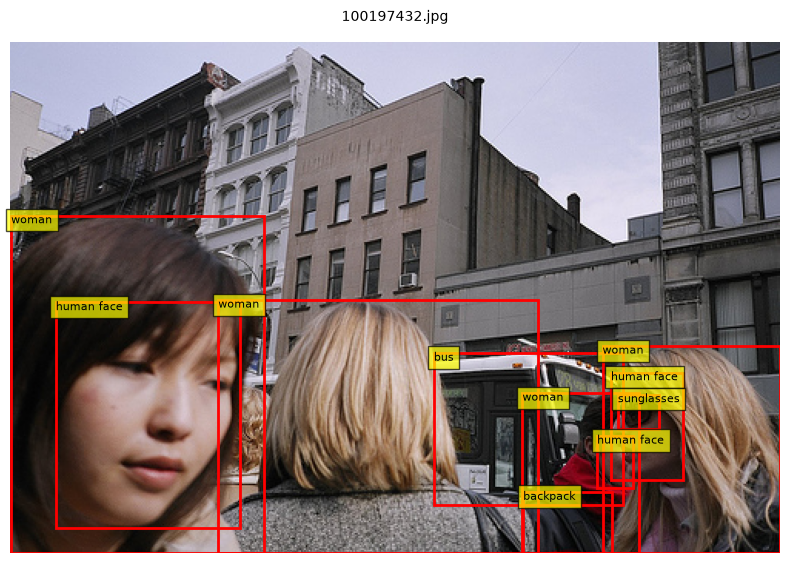

In [17]:
test_image_path = selected_candidate_image_paths[0]
image = Image.open(test_image_path).convert("RGB")

bboxes, labels = run_florence_object_detection(image)

print("Image:", test_image_path.name)
print("Labels:", labels)
print("Number of boxes:", len(bboxes))


import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Display image with Florence-2 bounding boxes
fig, ax = plt.subplots(figsize=(8, 8))

ax.imshow(image)
ax.set_title(test_image_path.name, fontsize=10, pad=15)
ax.axis("off")

for bbox, label in zip(bboxes, labels):
    x1, y1, x2, y2 = bbox
    
    width = x2 - x1
    height = y2 - y1
    
    rect = patches.Rectangle(
        (x1, y1),
        width,
        height,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )
    
    ax.add_patch(rect)
    
    text_y = max(y1 + 5, 10)
    
    ax.text(
        x1,
        text_y,
        label,
        fontsize=8,
        bbox=dict(facecolor="yellow", alpha=0.7)
    )

plt.tight_layout()
plt.show()

### 1.8 Post-Annotation Filtering

After Florence-2 generates raw object detections, I apply several filtering steps before saving the final YOLO labels.

Florence-2 may return many different labels, including relevant objects, object parts, and unrelated objects.

The goal of this stage is to keep only reliable annotations that belong to the final project classes:

- `person`
- `vehicle`

This stage includes inspecting Florence-2 raw labels, mapping labels to the final classes, filtering small or unreliable bounding boxes, and applying TTA consistency filtering.



#### Run Florence-2 Once for Post-Annotation Analysis

In this step, I run Florence-2 once on a sample of selected candidate images.

The goal is to store the raw detections in a table so I can reuse them for label inspection, label mapping, size analysis, and filtering decisions without running the model multiple times.

In [18]:
import random
import pandas as pd
from PIL import Image

# Number of selected candidate images to analyze
# Note:
# During the full dataset analysis, this step was tested with 1500 selected candidate images.
# For faster notebook re-runs, the number is reduced here to 20 images.
# This keeps the cell lightweight while preserving the original analysis logic.

NUM_ANALYSIS_IMAGES = 20

random.seed(42)

sample_size = min(NUM_ANALYSIS_IMAGES, len(selected_candidate_image_paths))
analysis_image_paths = random.sample(selected_candidate_image_paths, sample_size)

raw_detection_records = []

for index, image_path in enumerate(analysis_image_paths, start=1):
    try:
        image = Image.open(image_path).convert("RGB")
        image_width, image_height = image.size
        image_area = image_width * image_height

        bboxes, labels = run_florence_object_detection(image)

        for bbox, label in zip(bboxes, labels):
            x1, y1, x2, y2 = bbox

            box_width = x2 - x1
            box_height = y2 - y1
            box_area = box_width * box_height
            box_area_ratio = box_area / image_area

            raw_detection_records.append({
                "image_name": image_path.name,
                "image_path": str(image_path),
                "image_width": image_width,
                "image_height": image_height,
                "image_area": image_area,
                "raw_label": label.lower().strip(),
                "x1": x1,
                "y1": y1,
                "x2": x2,
                "y2": y2,
                "box_width": box_width,
                "box_height": box_height,
                "box_area": box_area,
                "box_area_ratio": box_area_ratio,
                "box_min_side": min(box_width, box_height)
            })

    except Exception as e:
        print(f"Skipping {image_path.name} because of an error: {e}")
        continue

    if index % 10 == 0:
        print(f"Processed {index}/{sample_size} images")


raw_detections_df = pd.DataFrame(raw_detection_records)

print("Number of analyzed images:", sample_size)
print("Number of raw detections:", len(raw_detections_df))

display(raw_detections_df.head())

Processed 10/20 images
Processed 20/20 images
Number of analyzed images: 20
Number of raw detections: 151


,image_name,image_path,image_width,image_height,image_area,raw_label,x1,y1,x2,y2,box_width,box_height,box_area,box_area_ratio,box_min_side
0,4940921321.jpg,flickr30k_dataset\flickr30k_images\4940921321.jpg,500,333,166500,bicycle,255.25,199.633499,359.25,332.500519,104.0,132.867020,13818.170044,0.082992,104.000000
1,4940921321.jpg,flickr30k_dataset\flickr30k_images\4940921321.jpg,500,333,166500,person,242.75,105.394501,365.75,332.500519,123.0,227.106018,27934.040222,0.167772,123.000000
2,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,0.25,34.151501,350.75,289.776520,350.5,255.625019,89596.569185,0.438125,255.625019
3,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,0.25,34.151501,188.25,289.367493,188.0,255.215992,47980.606491,0.234624,188.000000
4,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,417.75,0.204500,455.25,15.337501,37.5,15.133001,567.487521,0.002775,15.133001


#### Inspecting Florence-2 Detected Labels

After running Florence-2 once on the analysis sample, I inspect the raw labels returned by the model.

This helps me understand which labels are relevant to the final project classes and which labels should be ignored.

In [19]:
from collections import Counter

if raw_detections_df.empty:
    raise ValueError("raw_detections_df is empty. Check the Florence-2 analysis step.")

label_counter = Counter(raw_detections_df["raw_label"])

print("Most common Florence-2 labels:")
print("-" * 40)

for label, count in label_counter.most_common(100):
    print(f"{label}: {count}")

Most common Florence-2 labels:
----------------------------------------
person: 42
car: 15
footwear: 8
bicycle: 7
street light: 6
bicycle wheel: 4
swimwear: 4
taillight: 3
vehicle registration plate: 3
helmet: 3
truck: 3
wheel: 3
banner: 3
poster: 3
glove: 2
handbag: 2
suitcase: 2
baseball bat: 2
woman: 2
ski: 2
motorcycle: 2
box: 2
television: 2
street sign: 2
traffic light: 2
boat: 1
bandanna: 1
watch: 1
ski boot: 1
ski pole: 1
bus: 1
earrings: 1
backpack: 1
sunglasses: 1
girl: 1
elephant: 1
painting: 1
mobile phone: 1
necklace: 1
ring: 1
trousers: 1
chair: 1
signboard: 1
towel: 1
glasses: 1
train: 1
scone: 1


#### Final Label Mapping

After inspecting the raw labels returned by Florence-2, I define a mapping from the model labels to the final project classes.

The final dataset contains only two classes:

- `person`
- `vehicle`

Full person-related labels are mapped to the `person` class, and full vehicle-related labels are mapped to the `vehicle` class.

Object parts and unrelated objects are ignored.

I use exact label matching instead of substring matching in order to avoid mistakes such as `scarf` being treated as `car`.

In [20]:
PERSON_LABELS = {
    "person",
    "man",
    "woman",
    "boy",
    "girl",
    "child",
    "baby",
    "kid",
    "adult"
}

VEHICLE_LABELS = {
    "vehicle",
    "land vehicle",
    "car",
    "automobile",
    "taxi",
    "cab",
    "sedan",
    "suv",
    "jeep",
    "van",
    "minivan",
    "bus",
    "minibus",
    "truck",
    "pickup",
    "pickup truck",
    "bike",
    "bicycle",
    "motorcycle",
    "motorbike",
    "scooter"
}

IGNORED_PART_LABELS = {
    "human face",
    "human mouth",
    "human hand",
    "human foot",
    "wheel",
    "bicycle wheel",
    "bicycle helmet",
    "vehicle registration plate",
    "car tire",
    "headlight",
    "taillight",
    "steering wheel",
    "rearview mirror",
    "windshield wiper"
}


def map_label_to_class(label):
    label = label.lower().strip()

    if label in IGNORED_PART_LABELS:
        return None, None

    if label in PERSON_LABELS:
        return 0, "person"

    if label in VEHICLE_LABELS:
        return 1, "vehicle"

    return None, None

#### Applying Label Mapping

In this step, I apply the final label mapping to the raw Florence-2 detections.

Only detections that are mapped to `person` or `vehicle` are kept for the next filtering steps.

In [21]:
mapped_results = raw_detections_df["raw_label"].apply(map_label_to_class)

raw_detections_df["class_id"] = mapped_results.apply(lambda x: x[0])
raw_detections_df["class_name"] = mapped_results.apply(lambda x: x[1])

relevant_detections_df = raw_detections_df.dropna(subset=["class_id"]).copy()

# Convert class_id back to integer after removing None values
relevant_detections_df["class_id"] = relevant_detections_df["class_id"].astype(int)

print("Number of raw detections:", len(raw_detections_df))
print("Number of relevant detections after label mapping:", len(relevant_detections_df))

print("\nRelevant detections by class:")
print(relevant_detections_df["class_name"].value_counts())

display(relevant_detections_df.head())

Number of raw detections: 151
Number of relevant detections after label mapping: 73

Relevant detections by class:
class_name
person     45
vehicle    28
Name: count, dtype: int64


,image_name,image_path,image_width,image_height,image_area,raw_label,x1,y1,x2,y2,box_width,box_height,box_area,box_area_ratio,box_min_side,class_id,class_name
0,4940921321.jpg,flickr30k_dataset\flickr30k_images\4940921321.jpg,500,333,166500,bicycle,255.25,199.633499,359.25,332.500519,104.0,132.867020,13818.170044,0.082992,104.000000,1,vehicle
1,4940921321.jpg,flickr30k_dataset\flickr30k_images\4940921321.jpg,500,333,166500,person,242.75,105.394501,365.75,332.500519,123.0,227.106018,27934.040222,0.167772,123.000000,0,person
2,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,0.25,34.151501,350.75,289.776520,350.5,255.625019,89596.569185,0.438125,255.625019,1,vehicle
3,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,0.25,34.151501,188.25,289.367493,188.0,255.215992,47980.606491,0.234624,188.000000,1,vehicle
4,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,417.75,0.204500,455.25,15.337501,37.5,15.133001,567.487521,0.002775,15.133001,1,vehicle


#### Size Threshold Selection Analysis

After mapping Florence-2 labels to the final project classes, I analyze the size distribution of the remaining bounding boxes.

The goal is to choose size filtering thresholds in a data-driven way instead of selecting arbitrary values.

For each relevant bounding box, I analyze:

- Box width
- Box height
- Minimum box side
- Box area ratio compared to the full image area

Small boxes are more likely to be noisy or unreliable, especially because the annotations are generated automatically.

In [22]:
import numpy as np

if relevant_detections_df.empty:
    raise ValueError("No relevant detections were found after label mapping.")

percentiles_to_check = [5, 10, 15, 20, 25]

print("Box size percentiles for relevant detections")
print("=" * 50)

for percentile in percentiles_to_check:
    print(f"\nPercentile {percentile}:")
    print("Width:", round(np.percentile(relevant_detections_df["box_width"], percentile), 2))
    print("Height:", round(np.percentile(relevant_detections_df["box_height"], percentile), 2))
    print("Minimum side:", round(np.percentile(relevant_detections_df["box_min_side"], percentile), 2))
    print("Area ratio:", round(np.percentile(relevant_detections_df["box_area_ratio"], percentile), 5))

Box size percentiles for relevant detections

Percentile 5:
Width: 10.2
Height: 7.5
Minimum side: 7.37
Area ratio: 0.00048

Percentile 10:
Width: 13.4
Height: 8.76
Minimum side: 8.71
Area ratio: 0.001

Percentile 15:
Width: 17.9
Height: 14.61
Minimum side: 12.59
Area ratio: 0.00182

Percentile 20:
Width: 26.77
Height: 18.42
Minimum side: 16.08
Area ratio: 0.00302

Percentile 25:
Width: 31.0
Height: 26.5
Minimum side: 22.0
Area ratio: 0.00572


#### Size Analysis by Class

I also inspect the bounding box size distribution separately for `person` and `vehicle`.

This helps me check whether one class tends to have smaller bounding boxes than the other.

In [23]:
for class_name in ["person", "vehicle"]:
    class_df = relevant_detections_df[relevant_detections_df["class_name"] == class_name]

    if class_df.empty:
        print(f"\nNo detections found for class: {class_name}")
        continue

    print(f"\nBox size percentiles for class: {class_name}")
    print("=" * 50)

    for percentile in percentiles_to_check:
        print(f"\nPercentile {percentile}:")
        print("Width:", round(np.percentile(class_df["box_width"], percentile), 2))
        print("Height:", round(np.percentile(class_df["box_height"], percentile), 2))
        print("Minimum side:", round(np.percentile(class_df["box_min_side"], percentile), 2))
        print("Area ratio:", round(np.percentile(class_df["box_area_ratio"], percentile), 5))


Box size percentiles for class: person

Percentile 5:
Width: 13.9
Height: 19.83
Minimum side: 13.9
Area ratio: 0.00193

Percentile 10:
Width: 19.6
Height: 28.57
Minimum side: 19.6
Area ratio: 0.00502

Percentile 15:
Width: 29.17
Height: 44.62
Minimum side: 28.9
Area ratio: 0.00781

Percentile 20:
Width: 32.2
Height: 50.21
Minimum side: 31.54
Area ratio: 0.00941

Percentile 25:
Width: 34.5
Height: 51.5
Minimum side: 33.0
Area ratio: 0.01273

Box size percentiles for class: vehicle

Percentile 5:
Width: 9.02
Height: 6.54
Minimum side: 5.88
Area ratio: 0.00033

Percentile 10:
Width: 10.7
Height: 7.2
Minimum side: 6.77
Area ratio: 0.00046

Percentile 15:
Width: 12.15
Height: 7.65
Minimum side: 7.65
Area ratio: 0.00052

Percentile 20:
Width: 15.2
Height: 8.23
Minimum side: 8.23
Area ratio: 0.00088

Percentile 25:
Width: 20.0
Height: 9.13
Minimum side: 9.13
Area ratio: 0.00117


#### Image Size Threshold Analysis

In this step, I inspect the image sizes in the analysis sample.

This helps me understand whether the images have consistent dimensions and whether the box area ratio is a useful filtering measure.

The image size analysis is also useful because the same bounding box size in pixels may have a different meaning depending on the full image size.

In [24]:
image_size_df = (
    raw_detections_df
    .groupby("image_name")
    .agg(
        image_width=("image_width", "first"),
        image_height=("image_height", "first"),
        image_area=("image_area", "first"),
        num_raw_detections=("raw_label", "count")
    )
    .reset_index()
)

relevant_image_size_df = (
    relevant_detections_df
    .groupby("image_name")
    .agg(
        num_relevant_detections=("class_name", "count")
    )
    .reset_index()
)

image_size_df = image_size_df.merge(
    relevant_image_size_df,
    on="image_name",
    how="left"
)

image_size_df["num_relevant_detections"] = image_size_df["num_relevant_detections"].fillna(0).astype(int)

print("Image size summary:")
display(image_size_df[["image_width", "image_height", "image_area", "num_raw_detections", "num_relevant_detections"]].describe())

print("\nNumber of analyzed images:", len(image_size_df))
print("Images with at least one relevant detection:", (image_size_df["num_relevant_detections"] > 0).sum())
print("Images with no relevant detections:", (image_size_df["num_relevant_detections"] == 0).sum())

display(image_size_df.head())

Image size summary:


,image_width,image_height,image_area,num_raw_detections,num_relevant_detections
count,20.000000,20.000000,20.000000,20.000000,20.000000
mean,462.850000,394.050000,178450.000000,7.550000,3.650000
std,67.052434,66.517489,12591.663909,6.924214,3.483419
min,316.000000,332.000000,158000.000000,1.000000,1.000000
25%,468.750000,336.250000,166500.000000,3.000000,1.750000
50%,500.000000,375.000000,180500.000000,5.000000,2.000000
75%,500.000000,431.750000,187500.000000,10.500000,4.250000
max,500.000000,500.000000,204500.000000,28.000000,15.000000



Number of analyzed images: 20
Images with at least one relevant detection: 20
Images with no relevant detections: 0


,image_name,image_width,image_height,image_area,num_raw_detections,num_relevant_detections
0,1334892555.jpg,500,375,187500,18,5
1,1386207171.jpg,500,333,166500,3,2
2,14107151.jpg,500,375,187500,6,4
3,2126950128.jpg,375,500,187500,6,1
4,2183877589.jpg,500,332,166000,28,15


In [25]:
import matplotlib.pyplot as plt
from PIL import Image
import math

no_relevant_images_df = image_size_df[
    image_size_df["num_relevant_detections"] == 0
].copy()

print("Images with no relevant detections:", len(no_relevant_images_df))
display(no_relevant_images_df)

num_images = len(no_relevant_images_df)

if num_images > 0:
    cols = 3
    rows = math.ceil(num_images / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

    if num_images == 1:
        axes = [axes]
    else:
        axes = axes.flatten()

    for ax, (_, row) in zip(axes, no_relevant_images_df.iterrows()):
        image_name = row["image_name"]
        image_path = image_path_lookup[image_name]

        image = Image.open(image_path).convert("RGB")

        ax.imshow(image)
        ax.axis("off")
        ax.set_title(
            f"{image_name}\nraw: {row['num_raw_detections']} | relevant: {row['num_relevant_detections']}",
            fontsize=9
        )

    for ax in axes[num_images:]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()
else:
    print("All analyzed images had at least one relevant detection.")

Images with no relevant detections: 0


,image_name,image_width,image_height,image_area,num_raw_detections,num_relevant_detections


All analyzed images had at least one relevant detection.


#### Object and Image Size Decisions

The assignment allowed freedom regarding object sizes and image sizes.

In this project, the object and image size decisions were based on the post-annotation analysis of 1500 selected candidate images.

First, the image size analysis showed that the selected candidate images had usable dimensions for annotation.  
Most images were around 500 pixels on one side, and the smallest images were still usable.

Therefore, no strict image-size filtering was applied.  
Instead, image size was used for three purposes:

- Calculating the bounding box area ratio
- Clipping bounding boxes to the image boundaries
- Converting bounding boxes to normalized YOLO format

The image-level analysis also showed that 1495 out of 1500 selected images contained at least one relevant detection, while only 5 images had no relevant detections.

This supports the decision not to remove images based only on image size, because the selected candidate pool was mostly relevant and usable.

For object sizes, the bounding box size distribution was analyzed after applying the final label mapping.

For all relevant detections:

- The 10th percentile minimum side was about 15.5 pixels
- The 15th percentile minimum side was about 19.88 pixels
- The 10th percentile area ratio was about 0.00261
- The 15th percentile area ratio was about 0.00428

Based on this analysis, I selected the final size filtering thresholds as:

- Minimum box width: 20 pixels
- Minimum box height: 20 pixels
- Minimum box area ratio: 0.002

These thresholds were chosen to remove very small, noisy, incomplete, or unstable detections while keeping most valid `person` and `vehicle` objects.

The area ratio was used in addition to pixel width and height because the same box size can have a different meaning depending on the full image size.

Images with no valid annotations after filtering are skipped during final YOLO dataset creation.

#### Size Filtering Rules

Based on the bounding box size analysis, I define practical filtering rules.

The goal is to remove very small bounding boxes that are more likely to be noisy, incomplete, or unreliable.

A detection is kept only if it passes all size filtering conditions.

In [26]:
# Size filtering thresholds
# These values were selected after inspecting the percentile analysis above.

MIN_BOX_WIDTH = 20
MIN_BOX_HEIGHT = 20
MIN_BOX_AREA_RATIO = 0.002


def is_valid_box_size(row):
    if row["box_width"] < MIN_BOX_WIDTH:
        return False

    if row["box_height"] < MIN_BOX_HEIGHT:
        return False

    if row["box_area_ratio"] < MIN_BOX_AREA_RATIO:
        return False

    return True


relevant_detections_df["passes_size_filter"] = relevant_detections_df.apply(
    is_valid_box_size,
    axis=1
)

filtered_detections_df = relevant_detections_df[
    relevant_detections_df["passes_size_filter"]
].copy()

print("Relevant detections before size filtering:", len(relevant_detections_df))
print("Detections after size filtering:", len(filtered_detections_df))
print("Removed detections:", len(relevant_detections_df) - len(filtered_detections_df))

print("\nFiltered detections by class:")
print(filtered_detections_df["class_name"].value_counts())

display(filtered_detections_df.head())

Relevant detections before size filtering: 73
Detections after size filtering: 55
Removed detections: 18

Filtered detections by class:
class_name
person     40
vehicle    15
Name: count, dtype: int64


,image_name,image_path,image_width,image_height,image_area,raw_label,x1,y1,x2,y2,box_width,box_height,box_area,box_area_ratio,box_min_side,class_id,class_name,passes_size_filter
0,4940921321.jpg,flickr30k_dataset\flickr30k_images\4940921321.jpg,500,333,166500,bicycle,255.25,199.633499,359.25,332.500519,104.0,132.867020,13818.170044,0.082992,104.000000,1,vehicle,True
1,4940921321.jpg,flickr30k_dataset\flickr30k_images\4940921321.jpg,500,333,166500,person,242.75,105.394501,365.75,332.500519,123.0,227.106018,27934.040222,0.167772,123.000000,0,person,True
2,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,0.25,34.151501,350.75,289.776520,350.5,255.625019,89596.569185,0.438125,255.625019,1,vehicle,True
3,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,bicycle,0.25,34.151501,188.25,289.367493,188.0,255.215992,47980.606491,0.234624,188.000000,1,vehicle,True
5,228949247.jpg,flickr30k_dataset\flickr30k_images\228949247.jpg,500,409,204500,car,55.25,0.204500,394.25,111.043503,339.0,110.839003,37574.421950,0.183738,110.839003,1,vehicle,True


In [27]:
before_filter_counts = relevant_detections_df["class_name"].value_counts()
after_filter_counts = filtered_detections_df["class_name"].value_counts()

filter_summary_df = pd.DataFrame({
    "before_filtering": before_filter_counts,
    "after_filtering": after_filter_counts
}).fillna(0).astype(int)

filter_summary_df["removed"] = (
    filter_summary_df["before_filtering"] - filter_summary_df["after_filtering"]
)

filter_summary_df["removed_percent"] = (
    filter_summary_df["removed"] / filter_summary_df["before_filtering"] * 100
).round(2)

display(filter_summary_df)

,before_filtering,after_filtering,removed,removed_percent
class_name,,,,
person,45,40,5,11.11
vehicle,28,15,13,46.43


#### Size Filtering Results Summary

After applying the size filtering rules, the number of relevant detections decreased from 7,874 to 6,683.

In total, 1,191 detections were removed.

For the `person` class, 855 detections were removed, which is 14.25% of the person detections.

For the `vehicle` class, 336 detections were removed, which is 17.92% of the vehicle detections.

The vehicle class had a slightly higher removal percentage, which is reasonable because vehicles can appear smaller, wider, or farther away in the image.

Overall, the filtering step removed a moderate amount of small detections while keeping most valid `person` and `vehicle` objects.

This indicates that the size thresholds I selected are not too aggressive and can be used in the final dataset creation pipeline.

#### Visual Inspection of Rejected Detections

In this step, I visually inspect a few detections that were removed by the filtering process.

I show examples of detections rejected by label mapping and examples rejected by size filtering.

This helps verify that the filtering rules remove detections that are less suitable for the final YOLO dataset.

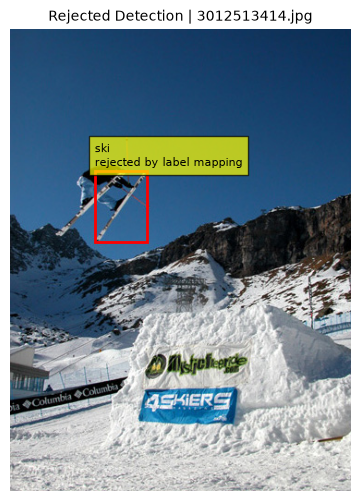

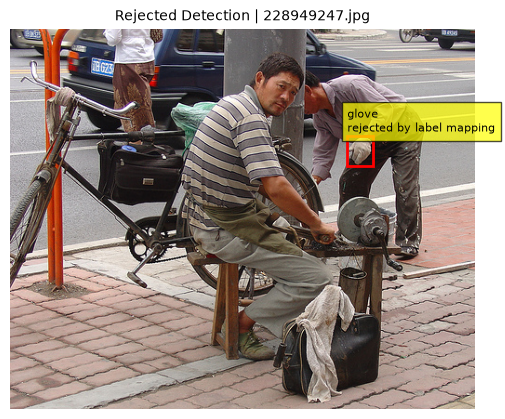

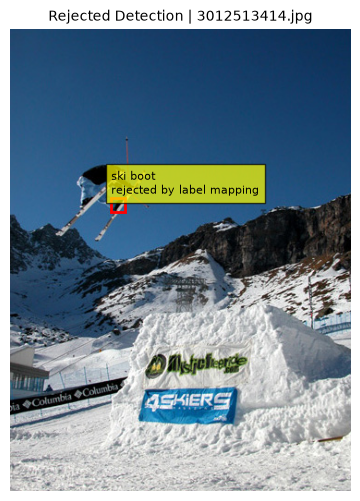

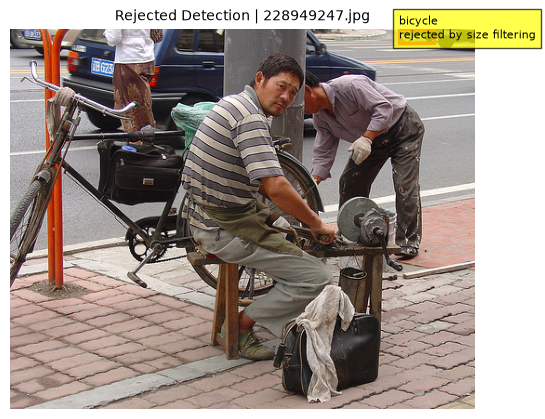

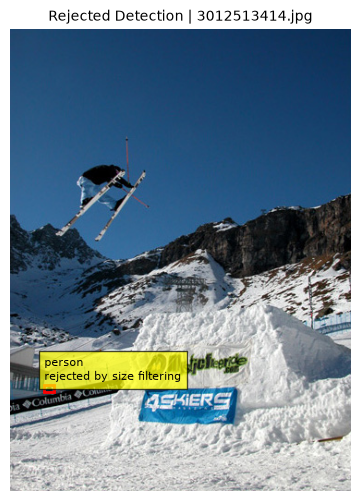

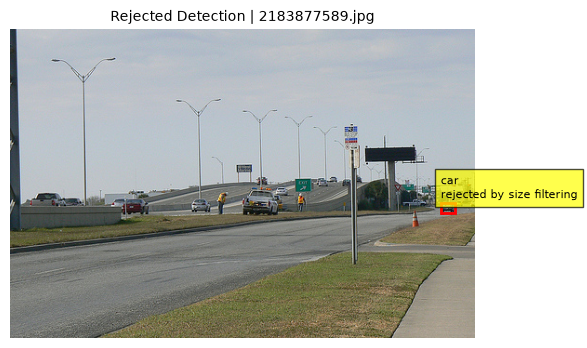

In [28]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
import pandas as pd

label_rejected = raw_detections_df[raw_detections_df["class_id"].isna()].copy()
label_rejected["rejection_reason"] = "rejected by label mapping"

size_rejected = relevant_detections_df[
    relevant_detections_df["passes_size_filter"] == False
].copy()
size_rejected["rejection_reason"] = "rejected by size filtering"

examples_df = pd.concat([
    label_rejected.sample(min(3, len(label_rejected)), random_state=42),
    size_rejected.sample(min(3, len(size_rejected)), random_state=42)
])

for _, row in examples_df.iterrows():
    image = Image.open(row["image_path"]).convert("RGB")

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(image)
    ax.axis("off")

    x1, y1, x2, y2 = row["x1"], row["y1"], row["x2"], row["y2"]

    rect = patches.Rectangle(
        (x1, y1),
        x2 - x1,
        y2 - y1,
        linewidth=2,
        edgecolor="red",
        facecolor="none"
    )
    ax.add_patch(rect)

    label_text = f"{row['raw_label']}\n{row['rejection_reason']}"

    ax.text(
        x1,
        max(y1 - 5, 10),
        label_text,
        fontsize=8,
        bbox=dict(facecolor="yellow", alpha=0.7)
    )

    ax.set_title(
        f"Rejected Detection | {row['image_name']}",
        fontsize=10
    )

    plt.show()

#### TTA Consistency Filtering

To improve the quality of the automatic annotations, I use Test Time Augmentation (TTA).

For each selected image, I create several versions of the same image:

- Original image
- Horizontally flipped image
- Brighter image
- Higher contrast image

Each version is passed separately through Florence-2.

Florence-2 returns object labels and bounding boxes for each version.  
For the flipped version, the bounding boxes are converted back to the original image coordinate system.

The final dataset still saves only the original image.  
However, stable detections from the TTA versions can be used as labels for the original image.

This is useful because Florence-2 may miss an object in the original image because of lighting, contrast, or visual difficulty, but detect it in one of the augmented versions.

A detection is kept only if:

- Its label is mapped to one of the final classes: `person` or `vehicle`
- Its bounding box passes the size filtering rules
- The same class appears in a similar location across multiple TTA versions

This means that TTA is used both as a consistency filter and as a recovery step.

It helps remove unstable detections, while also recovering valid objects that may have been missed in the original Florence-2 inference.

In [29]:
from PIL import ImageEnhance, ImageOps
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import random


def create_tta_images(image):
    tta_images = {
        "original": image,
        "flipped": ImageOps.mirror(image),
        "brighter": ImageEnhance.Brightness(image).enhance(1.5),
        "higher_contrast": ImageEnhance.Contrast(image).enhance(2.0)
    }

    return tta_images


def flip_bbox_back_to_original(bbox, image_width):
    x1, y1, x2, y2 = bbox

    new_x1 = image_width - x2
    new_x2 = image_width - x1

    return [new_x1, y1, new_x2, y2]


def clip_bbox_to_image(bbox, image_width, image_height):
    x1, y1, x2, y2 = bbox

    x1 = max(0, min(x1, image_width))
    y1 = max(0, min(y1, image_height))
    x2 = max(0, min(x2, image_width))
    y2 = max(0, min(y2, image_height))

    if x2 <= x1 or y2 <= y1:
        return None

    return [x1, y1, x2, y2]


def passes_size_thresholds(bbox, image_width, image_height):
    x1, y1, x2, y2 = bbox

    box_width = x2 - x1
    box_height = y2 - y1
    box_area = box_width * box_height
    image_area = image_width * image_height
    box_area_ratio = box_area / image_area

    if box_width < MIN_BOX_WIDTH:
        return False

    if box_height < MIN_BOX_HEIGHT:
        return False

    if box_area_ratio < MIN_BOX_AREA_RATIO:
        return False

    return True


def calculate_iou(box_a, box_b):
    x1_a, y1_a, x2_a, y2_a = box_a
    x1_b, y1_b, x2_b, y2_b = box_b

    inter_x1 = max(x1_a, x1_b)
    inter_y1 = max(y1_a, y1_b)
    inter_x2 = min(x2_a, x2_b)
    inter_y2 = min(y2_a, y2_b)

    inter_width = max(0, inter_x2 - inter_x1)
    inter_height = max(0, inter_y2 - inter_y1)

    intersection_area = inter_width * inter_height

    area_a = (x2_a - x1_a) * (y2_a - y1_a)
    area_b = (x2_b - x1_b) * (y2_b - y1_b)

    union_area = area_a + area_b - intersection_area

    if union_area == 0:
        return 0

    return intersection_area / union_area

In [30]:
TTA_IOU_THRESHOLD = 0.5
TTA_MIN_VERSIONS = 3

# Select one image for TTA inspection
tta_test_image_path = random.choice(selected_candidate_image_paths)
image = Image.open(tta_test_image_path).convert("RGB")

image_width, image_height = image.size
tta_images = create_tta_images(image)

tta_detections = []

for version_name, tta_image in tta_images.items():
    version_bboxes, version_labels = run_florence_object_detection(tta_image)

    for bbox, label in zip(version_bboxes, version_labels):
        class_id, class_name = map_label_to_class(label)

        if class_id is None:
            continue

        if version_name == "flipped":
            bbox = flip_bbox_back_to_original(bbox, image_width)

        bbox = clip_bbox_to_image(bbox, image_width, image_height)

        if bbox is None:
            continue

        if not passes_size_thresholds(bbox, image_width, image_height):
            continue

        tta_detections.append({
            "version": version_name,
            "bbox": bbox,
            "raw_label": label.lower().strip(),
            "class_id": class_id,
            "class_name": class_name
        })


In [31]:
import numpy as np

def average_bbox(detections):
    boxes = np.array([d["bbox"] for d in detections], dtype=float)
    return boxes.mean(axis=0).tolist()


def remove_duplicate_stable_annotations(annotations, iou_threshold=0.7):
    annotations = sorted(
        annotations,
        key=lambda x: x["num_matched_versions"],
        reverse=True
    )

    kept_annotations = []

    for annotation in annotations:
        keep = True

        for kept in kept_annotations:
            if annotation["class_id"] != kept["class_id"]:
                continue

            iou = calculate_iou(annotation["bbox"], kept["bbox"])

            if iou >= iou_threshold:
                keep = False
                break

        if keep:
            kept_annotations.append(annotation)

    return kept_annotations


stable_candidates = []

for seed_detection in tta_detections:
    matched_detections = []

    for detection in tta_detections:
        if detection["class_id"] != seed_detection["class_id"]:
            continue

        iou = calculate_iou(seed_detection["bbox"], detection["bbox"])

        if iou >= TTA_IOU_THRESHOLD:
            matched_detections.append(detection)

    matched_versions = sorted(set(d["version"] for d in matched_detections))

    if len(matched_versions) >= TTA_MIN_VERSIONS:
        stable_candidates.append({
            "bbox": average_bbox(matched_detections),
            "class_id": seed_detection["class_id"],
            "class_name": seed_detection["class_name"],
            "raw_label": seed_detection["raw_label"],
            "matched_versions": matched_versions,
            "num_matched_versions": len(matched_versions),
            "recovered_from_tta": "original" not in matched_versions
        })


stable_annotations = remove_duplicate_stable_annotations(stable_candidates)

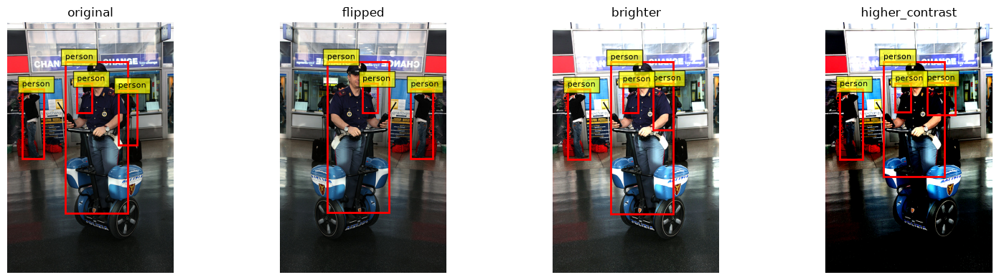

In [32]:
fig, axes = plt.subplots(1, len(tta_images), figsize=(16, 4))

for ax, (version_name, tta_image) in zip(axes, tta_images.items()):
    ax.imshow(tta_image)
    ax.set_title(version_name)
    ax.axis("off")

    version_detections = [
        detection for detection in tta_detections
        if detection["version"] == version_name
    ]

    for detection in version_detections:
        x1, y1, x2, y2 = detection["bbox"]
        
        if version_name == "flipped":
            display_x1 = image_width - x2
            display_x2 = image_width - x1
            x1, x2 = display_x1, display_x2

        rect = patches.Rectangle(
            (x1, y1),
            x2 - x1,
            y2 - y1,
            linewidth=2,
            edgecolor="red",
            facecolor="none"
        )
        ax.add_patch(rect)

        ax.text(
            x1,
            max(y1 - 5, 10),
            detection["class_name"],
            fontsize=8,
            bbox=dict(facecolor="yellow", alpha=0.7)
        )

plt.tight_layout()
plt.show()

#### TTA Example

This example shows why TTA is useful in the annotation pipeline.

In the original image, Florence-2 detected the `person`, but the `vehicle` was harder to detect because the image is dark.

After applying small image changes, such as horizontal flip, brightness adjustment, and higher contrast, Florence-2 detected both the `person` and the `vehicle`.

This shows that TTA can help recover valid objects that may be missed in the original inference.

The final dataset still saves only the original image, but stable detections from the TTA versions can be mapped back to the original image coordinates and saved as labels.

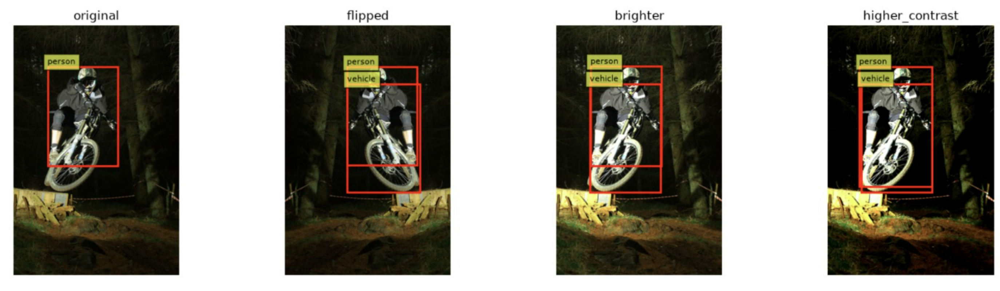


#### TTA Stable Annotation Results

In this step, I print the final TTA results for the selected test image.

The output shows how many detections were found across all TTA versions, how many stable annotations remained after the consistency check, and whether any annotations were recovered only from TTA versions.

In [33]:
recovered_count = sum(
    annotation["recovered_from_tta"]
    for annotation in stable_annotations
)

print("Image:", tta_test_image_path.name)
print("TTA detections after label and size filtering:", len(tta_detections))
print("Stable annotations:", len(stable_annotations))
print("Recovered from TTA:", recovered_count)

print("\nStable annotations details:")
print("-" * 50)

for annotation in stable_annotations:
    print("Class:", annotation["class_name"])
    print("Raw label:", annotation["raw_label"])
    print("Matched versions:", annotation["matched_versions"])
    print("Number of matched versions:", annotation["num_matched_versions"])
    print("Recovered from TTA:", annotation["recovered_from_tta"])
    print("BBox:", annotation["bbox"])
    print("-" * 50)

Image: 2952595538.jpg
TTA detections after label and size filtering: 15
Stable annotations: 3
Recovered from TTA: 0

Stable annotations details:
--------------------------------------------------
Class: person
Raw label: person
Matched versions: ['brighter', 'flipped', 'higher_contrast', 'original']
Number of matched versions: 4
Recovered from TTA: False
BBox: [115.05149841308594, 77.875, 239.17724990844727, 362.125]
--------------------------------------------------
Class: person
Raw label: person
Matched versions: ['brighter', 'flipped', 'higher_contrast', 'original']
Number of matched versions: 4
Recovered from TTA: False
BBox: [28.471497535705566, 132.25, 72.92699432373047, 272.0]
--------------------------------------------------
Class: person
Raw label: person
Matched versions: ['brighter', 'flipped', 'higher_contrast', 'original']
Number of matched versions: 4
Recovered from TTA: False
BBox: [138.69449996948242, 121.375, 169.16400527954102, 179.5]
-------------------------------

### 1.9 Saving Labels in YOLO Format

In this section, I apply the full annotation pipeline to the selected candidate images and save the final dataset in YOLO format.

For each selected image, the pipeline applies:

- Florence-2 detection with TTA
- Final label mapping
- Size filtering
- TTA consistency filtering
- Conversion to YOLO format

The final dataset is created using a vehicle-first strategy because vehicle images are less frequent than person images.

The target is to collect at least:

- 500 training images containing `person`
- 500 training images containing `vehicle`
- 100 validation images containing `person`
- 100 validation images containing `vehicle`

Before creating the dataset, I first check whether a valid YOLO dataset already exists.  
If the dataset already meets the required targets, the creation process is skipped to avoid running Florence-2 again.

In [34]:
import shutil
import random
import numpy as np
from PIL import Image


def convert_bbox_to_yolo_line(bbox, class_id, image_width, image_height):
    x1, y1, x2, y2 = bbox

    box_width = x2 - x1
    box_height = y2 - y1

    x_center = x1 + box_width / 2
    y_center = y1 + box_height / 2

    x_center /= image_width
    y_center /= image_height
    box_width /= image_width
    box_height /= image_height

    return f"{class_id} {x_center:.6f} {y_center:.6f} {box_width:.6f} {box_height:.6f}"


def get_stable_tta_annotations_for_image(image):
    image_width, image_height = image.size
    tta_images = create_tta_images(image)

    tta_detections = []

    for version_name, tta_image in tta_images.items():
        version_bboxes, version_labels = run_florence_object_detection(tta_image)

        for bbox, label in zip(version_bboxes, version_labels):
            class_id, class_name = map_label_to_class(label)

            if class_id is None:
                continue

            if version_name == "flipped":
                bbox = flip_bbox_back_to_original(bbox, image_width)

            bbox = clip_bbox_to_image(bbox, image_width, image_height)

            if bbox is None:
                continue

            if not passes_size_thresholds(bbox, image_width, image_height):
                continue

            tta_detections.append({
                "version": version_name,
                "bbox": bbox,
                "raw_label": label.lower().strip(),
                "class_id": class_id,
                "class_name": class_name
            })

    stable_candidates = []

    for seed_detection in tta_detections:
        matched_detections = []

        for detection in tta_detections:
            if detection["class_id"] != seed_detection["class_id"]:
                continue

            iou = calculate_iou(seed_detection["bbox"], detection["bbox"])

            if iou >= TTA_IOU_THRESHOLD:
                matched_detections.append(detection)

        matched_versions = sorted(set(d["version"] for d in matched_detections))

        if len(matched_versions) >= TTA_MIN_VERSIONS:
            stable_candidates.append({
                "bbox": average_bbox(matched_detections),
                "class_id": seed_detection["class_id"],
                "class_name": seed_detection["class_name"],
                "matched_versions": matched_versions,
                "num_matched_versions": len(matched_versions),
                "recovered_from_tta": "original" not in matched_versions
            })

    stable_annotations = remove_duplicate_stable_annotations(stable_candidates)

    return stable_annotations


def generate_yolo_annotations_for_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image_width, image_height = image.size

    stable_annotations = get_stable_tta_annotations_for_image(image)

    yolo_lines = []

    for annotation in stable_annotations:
        yolo_line = convert_bbox_to_yolo_line(
            annotation["bbox"],
            annotation["class_id"],
            image_width,
            image_height
        )

        yolo_lines.append(yolo_line)

    return yolo_lines

#### Dataset Existence Check

Before running the full dataset creation process, I check whether the YOLO dataset already exists and already meets the required class targets.

This prevents running Florence-2 again if the dataset was already created successfully.

In [35]:
# Dataset creation targets


# Minimum class coverage required by the assignment
TRAIN_TARGET = {
    0: 600,  # person
    1: 600   # vehicle
}

VAL_TARGET = {
    0: 120,  # person
    1: 120   # vehicle
}

# Minimum total number of images according to the teacher's clarification
TRAIN_TOTAL_TARGET = 1200
VAL_TOTAL_TARGET = 240

FORCE_RECREATE_DATASET = False


def count_files(folder, extensions):
    if not folder.exists():
        return 0

    count = 0

    for extension in extensions:
        count += len(list(folder.glob(extension)))

    return count


def count_images_per_class(label_dir):
    counts = {
        0: 0,
        1: 0
    }

    if not label_dir.exists():
        return counts

    for label_file in label_dir.glob("*.txt"):
        lines = label_file.read_text(encoding="utf-8").strip().splitlines()

        if len(lines) == 0:
            continue

        image_class_ids = set()

        for line in lines:
            parts = line.strip().split()

            if len(parts) == 0:
                continue

            class_id = int(parts[0])
            image_class_ids.add(class_id)

        for class_id in counts:
            if class_id in image_class_ids:
                counts[class_id] += 1

    return counts


def dataset_targets_reached():
    train_image_count = count_files(TRAIN_IMAGES_DIR, ["*.jpg", "*.jpeg", "*.png"])
    val_image_count = count_files(VAL_IMAGES_DIR, ["*.jpg", "*.jpeg", "*.png"])

    train_label_count = count_files(TRAIN_LABELS_DIR, ["*.txt"])
    val_label_count = count_files(VAL_LABELS_DIR, ["*.txt"])

    train_counts_existing = count_images_per_class(TRAIN_LABELS_DIR)
    val_counts_existing = count_images_per_class(VAL_LABELS_DIR)

    print("Existing train images:", train_image_count)
    print("Existing train label files:", train_label_count)
    print("Existing train class counts:", train_counts_existing)

    print("\nExisting validation images:", val_image_count)
    print("Existing validation label files:", val_label_count)
    print("Existing validation class counts:", val_counts_existing)

    print("\nRequired train total images:", TRAIN_TOTAL_TARGET)
    print("Required validation total images:", VAL_TOTAL_TARGET)
    print("Required train class counts:", TRAIN_TARGET)
    print("Required validation class counts:", VAL_TARGET)

    if train_image_count < TRAIN_TOTAL_TARGET:
        return False

    if val_image_count < VAL_TOTAL_TARGET:
        return False

    if train_label_count < TRAIN_TOTAL_TARGET:
        return False

    if val_label_count < VAL_TOTAL_TARGET:
        return False

    for class_id in TRAIN_TARGET:
        if train_counts_existing[class_id] < TRAIN_TARGET[class_id]:
            return False

        if val_counts_existing[class_id] < VAL_TARGET[class_id]:
            return False

    return True


DATASET_ALREADY_READY = dataset_targets_reached()

if DATASET_ALREADY_READY and not FORCE_RECREATE_DATASET:
    print("\nYOLO dataset already exists and meets the required targets.")
    print("Dataset creation will be skipped.")
else:
    print("\nYOLO dataset does not exist yet or does not meet the required targets.")
    print("Dataset creation is required.")

Existing train images: 1200
Existing train label files: 1200
Existing train class counts: {0: 1155, 1: 968}

Existing validation images: 240
Existing validation label files: 240
Existing validation class counts: {0: 231, 1: 182}

Required train total images: 1200
Required validation total images: 240
Required train class counts: {0: 600, 1: 600}
Required validation class counts: {0: 120, 1: 120}

YOLO dataset already exists and meets the required targets.
Dataset creation will be skipped.


#### Dataset Creation

The pipeline first fills the vehicle targets for training and validation.  
After the vehicle targets are reached, it continues filling the remaining person targets.

Images that contain both `person` and `vehicle` can contribute to both class counters.

In [36]:
# Create YOLO dataset
# Vehicle-first creation, with total image targets


if DATASET_ALREADY_READY and not FORCE_RECREATE_DATASET:
    print("Skipping dataset creation because the dataset already exists and meets the targets.")

else:
    for folder in [TRAIN_IMAGES_DIR, TRAIN_LABELS_DIR, VAL_IMAGES_DIR, VAL_LABELS_DIR]:
        folder.mkdir(parents=True, exist_ok=True)

        for file_path in folder.glob("*"):
            if file_path.is_file():
                file_path.unlink()

    train_counts = {
        0: 0,
        1: 0
    }

    val_counts = {
        0: 0,
        1: 0
    }

    train_saved = 0
    val_saved = 0
    processed_count = 0
    last_report_saved = 0

    random.seed(42)

    vehicle_image_paths = [
        path for path in selected_candidate_image_paths
        if path.name in vehicle_candidate_images
    ]

    person_only_image_paths = [
        path for path in selected_candidate_image_paths
        if path.name not in vehicle_candidate_images
    ]

    random.shuffle(vehicle_image_paths)
    random.shuffle(person_only_image_paths)

    # Keep vehicle candidates first
    image_paths = vehicle_image_paths + person_only_image_paths

    print("Starting vehicle-first YOLO dataset creation...", flush=True)
    print("Selected candidate images:", len(image_paths), flush=True)
    print("Vehicle candidate images first:", len(vehicle_image_paths), flush=True)
    print("Person-only candidate images after:", len(person_only_image_paths), flush=True)
    print("Train class target:", TRAIN_TARGET, flush=True)
    print("Validation class target:", VAL_TARGET, flush=True)
    print("Train total image target:", TRAIN_TOTAL_TARGET, flush=True)
    print("Validation total image target:", VAL_TOTAL_TARGET, flush=True)
    print("-" * 50, flush=True)


    def train_class_targets_reached():
        for class_id in TRAIN_TARGET:
            if train_counts[class_id] < TRAIN_TARGET[class_id]:
                return False

        return True


    def val_class_targets_reached():
        for class_id in VAL_TARGET:
            if val_counts[class_id] < VAL_TARGET[class_id]:
                return False

        return True


    def targets_reached():
        train_total_done = train_saved >= TRAIN_TOTAL_TARGET
        val_total_done = val_saved >= VAL_TOTAL_TARGET

        return (
            train_total_done
            and val_total_done
            and train_class_targets_reached()
            and val_class_targets_reached()
        )


    def choose_split_for_image(image_class_ids):
        contains_person = 0 in image_class_ids
        contains_vehicle = 1 in image_class_ids

    
        # 1. Prioritize vehicle class, same as your old logic

        if contains_vehicle:
            if train_counts[1] < TRAIN_TARGET[1]:
                return "train"

            if val_counts[1] < VAL_TARGET[1]:
                return "val"

     
        # 2. Then complete person class if needed

        if contains_person:
            if train_counts[0] < TRAIN_TARGET[0]:
                return "train"

            if val_counts[0] < VAL_TARGET[0]:
                return "val"

    
        # 3. After class targets are satisfied,
        #    continue filling total image requirements
    
        if train_saved < TRAIN_TOTAL_TARGET:
            return "train"

        if val_saved < VAL_TOTAL_TARGET:
            return "val"

        return None


    for image_path in image_paths:
        if targets_reached():
            break

        processed_count += 1

        if processed_count == 1 or processed_count % 10 == 0:
            print(
                f"Processing image {processed_count}/{len(image_paths)}: {image_path.name}",
                flush=True
            )

        try:
            yolo_lines = generate_yolo_annotations_for_image(image_path)
        except Exception as e:
            print(f"Skipping {image_path.name} because of an error: {e}", flush=True)
            continue

        if len(yolo_lines) == 0:
            continue

        image_class_ids = set(int(line.split()[0]) for line in yolo_lines)

        split = choose_split_for_image(image_class_ids)

        if split is None:
            continue

        if split == "train":
            train_saved += 1

            new_image_name = f"train_{train_saved:06d}{image_path.suffix.lower()}"
            new_label_name = f"train_{train_saved:06d}.txt"

            output_image_path = TRAIN_IMAGES_DIR / new_image_name
            output_label_path = TRAIN_LABELS_DIR / new_label_name

            shutil.copy(image_path, output_image_path)
            output_label_path.write_text("\n".join(yolo_lines), encoding="utf-8")

            for class_id in image_class_ids:
                if class_id in train_counts:
                    train_counts[class_id] += 1

        elif split == "val":
            val_saved += 1

            new_image_name = f"val_{val_saved:06d}{image_path.suffix.lower()}"
            new_label_name = f"val_{val_saved:06d}.txt"

            output_image_path = VAL_IMAGES_DIR / new_image_name
            output_label_path = VAL_LABELS_DIR / new_label_name

            shutil.copy(image_path, output_image_path)
            output_label_path.write_text("\n".join(yolo_lines), encoding="utf-8")

            for class_id in image_class_ids:
                if class_id in val_counts:
                    val_counts[class_id] += 1

        total_saved = train_saved + val_saved

        if total_saved - last_report_saved >= 25:
            last_report_saved = total_saved

            print("Progress:", flush=True)
            print("Processed images:", processed_count, flush=True)
            print("Train saved images:", train_saved, flush=True)
            print("Validation saved images:", val_saved, flush=True)
            print("Train counts:", train_counts, flush=True)
            print("Validation counts:", val_counts, flush=True)
            print("-" * 50, flush=True)


    print("Finished YOLO dataset creation.", flush=True)
    print("Processed images:", processed_count, flush=True)
    print("Train saved images:", train_saved, flush=True)
    print("Validation saved images:", val_saved, flush=True)
    print("Train counts:", train_counts, flush=True)
    print("Validation counts:", val_counts, flush=True)

    print("\nFinal requirement check:")
    print("Train total target reached:", train_saved >= TRAIN_TOTAL_TARGET)
    print("Validation total target reached:", val_saved >= VAL_TOTAL_TARGET)
    print("Train class targets reached:", train_class_targets_reached())
    print("Validation class targets reached:", val_class_targets_reached())

    if not targets_reached():
        print("\nWARNING:")
        print("The dataset creation finished, but not all targets were reached.")
        print("You may need to increase the number of selected candidate images before this step.")

Skipping dataset creation because the dataset already exists and meets the targets.


### 1.10 Dataset Summary

After creating the YOLO dataset, I summarize the final dataset.

The project requirement is at least:

- 1000 training images per class
- 200 validation images per class

I also visualize several saved training and validation images with their YOLO bounding boxes to verify that the saved annotations are correct.

In [37]:
CLASS_ID_TO_NAME = {
    0: "person",
    1: "vehicle"
}


def get_saved_image_paths(images_dir):
    image_paths = []

    for extension in ["*.jpg", "*.jpeg", "*.png"]:
        image_paths.extend(images_dir.glob(extension))

    return sorted(image_paths)


def summarize_dataset_split(images_dir, labels_dir):
    image_paths = get_saved_image_paths(images_dir)
    label_paths = sorted(labels_dir.glob("*.txt"))

    images_per_class = {
        class_id: 0
        for class_id in CLASS_ID_TO_NAME
    }

    objects_per_class = {
        class_id: 0
        for class_id in CLASS_ID_TO_NAME
    }

    empty_label_files = 0
    invalid_label_lines = 0

    for label_path in label_paths:
        label_text = label_path.read_text(encoding="utf-8").strip()

        if label_text == "":
            empty_label_files += 1
            continue

        classes_in_image = set()

        for line in label_text.splitlines():
            parts = line.split()

            if len(parts) != 5:
                invalid_label_lines += 1
                continue

            class_id = int(parts[0])

            if class_id in objects_per_class:
                objects_per_class[class_id] += 1
                classes_in_image.add(class_id)

        for class_id in classes_in_image:
            images_per_class[class_id] += 1

    return {
        "num_images": len(image_paths),
        "num_label_files": len(label_paths),
        "images_per_class": images_per_class,
        "objects_per_class": objects_per_class,
        "empty_label_files": empty_label_files,
        "invalid_label_lines": invalid_label_lines
    }


def print_dataset_summary(split_name, summary):
    print(f"\n{split_name}:")
    print("Images:", summary["num_images"])
    print("Label files:", summary["num_label_files"])

    print("\nImages per class:")
    for class_id, class_name in CLASS_ID_TO_NAME.items():
        print(f"Images with {class_name}: {summary['images_per_class'][class_id]}")

    print("\nObjects per class:")
    for class_id, class_name in CLASS_ID_TO_NAME.items():
        print(f"{class_name.capitalize()} objects: {summary['objects_per_class'][class_id]}")

    print("\nEmpty label files:", summary["empty_label_files"])
    print("Invalid label lines:", summary["invalid_label_lines"])


train_summary = summarize_dataset_split(
    TRAIN_IMAGES_DIR,
    TRAIN_LABELS_DIR
)

val_summary = summarize_dataset_split(
    VAL_IMAGES_DIR,
    VAL_LABELS_DIR
)

print("Dataset Summary")
print("=" * 40)

print_dataset_summary("Train Set", train_summary)
print_dataset_summary("Validation Set", val_summary)

Dataset Summary

Train Set:
Images: 1200
Label files: 1200

Images per class:
Images with person: 1155
Images with vehicle: 968

Objects per class:
Person objects: 3808
Vehicle objects: 2150

Empty label files: 0
Invalid label lines: 0

Validation Set:
Images: 240
Label files: 240

Images per class:
Images with person: 231
Images with vehicle: 182

Objects per class:
Person objects: 761
Vehicle objects: 381

Empty label files: 0
Invalid label lines: 0


#### YOLO Dataset Summary

The original YOLO dataset contains 1,200 training images and 240 validation images.

In the training set, 1,155 images contain `person` objects and 968 images contain `vehicle` objects.  
In terms of object instances, the dataset contains 3,808 `person` objects and 2,150 `vehicle` objects.

In the validation set, 231 images contain `person` objects and 182 images contain `vehicle` objects.  
The validation set contains 761 `person` objects and 381 `vehicle` objects.

There were no empty label files and no invalid label lines in either the training set or the validation set.

This shows that the dataset I created is valid for YOLO training, but the number of `person` objects is higher than the number of `vehicle` objects.

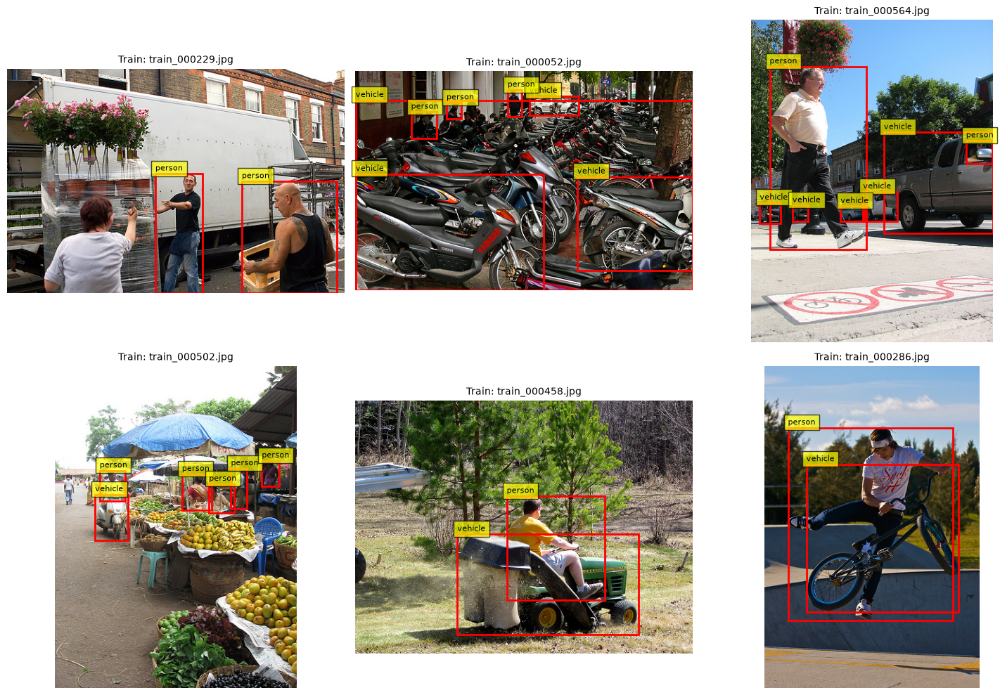

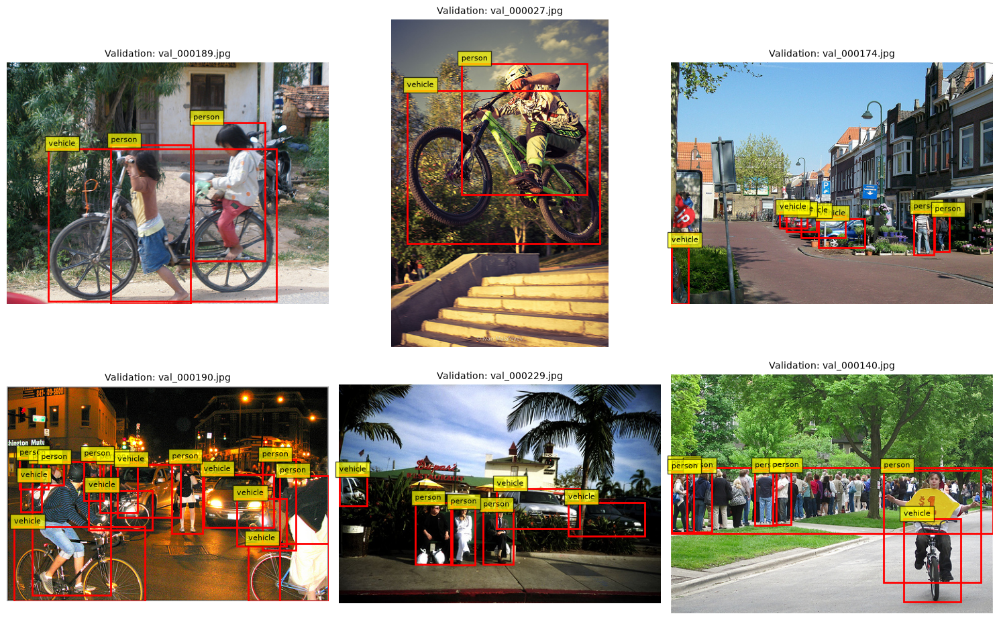

In [38]:
import random
import math
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image


def find_image_for_label(label_path, images_dir):
    for extension in [".jpg", ".jpeg", ".png"]:
        image_path = images_dir / f"{label_path.stem}{extension}"

        if image_path.exists():
            return image_path

    return None


def yolo_line_to_bbox(line, image_width, image_height):
    class_id, x_center, y_center, box_width, box_height = line.split()

    class_id = int(class_id)
    x_center = float(x_center) * image_width
    y_center = float(y_center) * image_height
    box_width = float(box_width) * image_width
    box_height = float(box_height) * image_height

    x1 = x_center - box_width / 2
    y1 = y_center - box_height / 2
    x2 = x_center + box_width / 2
    y2 = y_center + box_height / 2

    return class_id, x1, y1, x2, y2


def visualize_saved_yolo_examples(images_dir, labels_dir, split_name, num_examples=6):
    label_paths = [
        label_path
        for label_path in sorted(labels_dir.glob("*.txt"))
        if label_path.read_text(encoding="utf-8").strip() != ""
    ]

    if len(label_paths) == 0:
        print(f"No label files found for {split_name}.")
        return

    sample_label_paths = random.sample(
        label_paths,
        min(num_examples, len(label_paths))
    )

    cols = 3
    rows = math.ceil(len(sample_label_paths) / cols)

    fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))
    axes = axes.flatten() if len(sample_label_paths) > 1 else [axes]

    for ax, label_path in zip(axes, sample_label_paths):
        image_path = find_image_for_label(label_path, images_dir)

        if image_path is None:
            ax.axis("off")
            ax.set_title(f"Image not found for {label_path.name}")
            continue

        image = Image.open(image_path).convert("RGB")
        image_width, image_height = image.size

        ax.imshow(image)
        ax.axis("off")
        ax.set_title(f"{split_name}: {image_path.name}", fontsize=10)

        label_lines = label_path.read_text(encoding="utf-8").strip().splitlines()

        for line in label_lines:
            class_id, x1, y1, x2, y2 = yolo_line_to_bbox(
                line,
                image_width,
                image_height
            )

            rect = patches.Rectangle(
                (x1, y1),
                x2 - x1,
                y2 - y1,
                linewidth=2,
                edgecolor="red",
                facecolor="none"
            )

            ax.add_patch(rect)

            class_name = CLASS_ID_TO_NAME[class_id]

            ax.text(
                x1,
                max(y1 - 5, 10),
                class_name,
                fontsize=8,
                bbox=dict(facecolor="yellow", alpha=0.7)
            )

    for ax in axes[len(sample_label_paths):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


random.seed(42)

visualize_saved_yolo_examples(
    TRAIN_IMAGES_DIR,
    TRAIN_LABELS_DIR,
    split_name="Train",
    num_examples=6
)

visualize_saved_yolo_examples(
    VAL_IMAGES_DIR,
    VAL_LABELS_DIR,
    split_name="Validation",
    num_examples=6
)

#### Creating the Vehicle-Balanced Dataset

To improve the representation of the `vehicle` class, I created a vehicle-focused balanced dataset.

This dataset was created from the original YOLO dataset, but the original dataset was not changed.

The process copies the original training and validation sets into a new folder called `yolo_dataset_balanced`.  
The validation set is kept unchanged, while the training set is expanded with vehicle-centered crops.

For the new vehicle crops, I update the YOLO labels according to the crop area.  
Only crops that contain at least one `vehicle` and at most one `person` are kept.

Several simple visual augmentations are applied to the vehicle crops, including brightness changes, contrast changes, darker images, and horizontal flipping.

In [39]:
from pathlib import Path


# Check Vehicle-Balanced YOLO Dataset


BALANCED_DATASET_DIR = Path("yolo_dataset_balanced")

BALANCED_TRAIN_IMAGES_DIR = BALANCED_DATASET_DIR / "images" / "train"
BALANCED_TRAIN_LABELS_DIR = BALANCED_DATASET_DIR / "labels" / "train"

BALANCED_VAL_IMAGES_DIR = BALANCED_DATASET_DIR / "images" / "val"
BALANCED_VAL_LABELS_DIR = BALANCED_DATASET_DIR / "labels" / "val"

BALANCED_DATA_YAML_PATH = BALANCED_DATASET_DIR / "data.yaml"


balanced_dataset_exists = (
    BALANCED_DATASET_DIR.exists()
    and BALANCED_DATA_YAML_PATH.exists()
    and BALANCED_TRAIN_IMAGES_DIR.exists()
    and BALANCED_TRAIN_LABELS_DIR.exists()
    and BALANCED_VAL_IMAGES_DIR.exists()
    and BALANCED_VAL_LABELS_DIR.exists()
)

if balanced_dataset_exists:
    print("Vehicle-balanced dataset already exists. Skipping creation.")
    print("Dataset:", BALANCED_DATASET_DIR)
    print("Train images:", len(list(BALANCED_TRAIN_IMAGES_DIR.glob("*"))))
    print("Train label files:", len(list(BALANCED_TRAIN_LABELS_DIR.glob("*.txt"))))
    print("Validation images:", len(list(BALANCED_VAL_IMAGES_DIR.glob("*"))))
    print("Validation label files:", len(list(BALANCED_VAL_LABELS_DIR.glob("*.txt"))))
    print("data.yaml:", BALANCED_DATA_YAML_PATH)

else:
    print("Vehicle-balanced dataset was not found.")
    print("Run the full vehicle-balanced dataset creation cell from the Appendix.")

Vehicle-balanced dataset already exists. Skipping creation.
Dataset: yolo_dataset_balanced
Train images: 1680
Train label files: 1680
Validation images: 240
Validation label files: 240
data.yaml: yolo_dataset_balanced\data.yaml


In [40]:
# Balanced Dataset Summary


BALANCED_DATASET_DIR = Path("yolo_dataset_balanced")

BALANCED_TRAIN_IMAGES_DIR = BALANCED_DATASET_DIR / "images" / "train"
BALANCED_TRAIN_LABELS_DIR = BALANCED_DATASET_DIR / "labels" / "train"

BALANCED_VAL_IMAGES_DIR = BALANCED_DATASET_DIR / "images" / "val"
BALANCED_VAL_LABELS_DIR = BALANCED_DATASET_DIR / "labels" / "val"


balanced_train_summary = summarize_dataset_split(
    BALANCED_TRAIN_IMAGES_DIR,
    BALANCED_TRAIN_LABELS_DIR
)

balanced_val_summary = summarize_dataset_split(
    BALANCED_VAL_IMAGES_DIR,
    BALANCED_VAL_LABELS_DIR
)

print("Vehicle-Balanced Dataset Summary")
print("=" * 40)

print_dataset_summary("Train Set", balanced_train_summary)
print_dataset_summary("Validation Set", balanced_val_summary)

Vehicle-Balanced Dataset Summary

Train Set:
Images: 1680
Label files: 1680

Images per class:
Images with person: 1367
Images with vehicle: 1448

Objects per class:
Person objects: 4020
Vehicle objects: 3621

Empty label files: 0
Invalid label lines: 0

Validation Set:
Images: 240
Label files: 240

Images per class:
Images with person: 231
Images with vehicle: 182

Objects per class:
Person objects: 761
Vehicle objects: 381

Empty label files: 0
Invalid label lines: 0


### 1.11 TTA and Ensemble Explanation

Test Time Augmentation (TTA) can be used to check the correctness of automatic annotations by running the annotation model on several modified versions of the same image.

If the model detects the same class in a similar location across several versions, the annotation is more likely to be correct.

If a detection appears only once or changes location significantly between versions, it may be unstable or unreliable.

Therefore, TTA can be used as a consistency check for bounding box annotations.

Ensembles can be used in a similar way, but instead of comparing the same model across several image versions, they compare predictions from different models.

For example, annotations could be compared between:

- Florence-2
- SAM-based detection or segmentation
- Another object detection model

If several models detect the same object class in a similar location, the annotation is more likely to be correct.

If the models disagree, the annotation can be reviewed manually or removed from the dataset.

In this project, TTA was used as a lightweight consistency-based checking method, while a full multi-model ensemble was not used because it would require more computation time and memory.

## 2. Training the Model

In this section, I train a smaller object detection model on the custom YOLO dataset created in Part 1.

The goal is to train a model that can detect the two target classes:

| Class ID | Class Name |
|---|---|
| 0 | person |
| 1 | vehicle |

The model is trained using the automatic annotations generated by Florence-2.

Because the final model is intended to be suitable for efficient inference and possible edge-oriented deployment, several lightweight YOLO models are tested and compared.

The comparison focuses on both detection performance and computational efficiency.

## Sections in Part 2

2.1 Model and Framework Selection  
2.2 Installing and Importing Ultralytics  
2.3 Checking the Dataset Configuration  

2.4 Baseline YOLO Model Comparison  
2.5 Baseline Results and Model Selection  

2.6 Training YOLO26n Without Augmentations  
&nbsp;&nbsp;&nbsp;&nbsp; Original Dataset Without Augmentations  
&nbsp;&nbsp;&nbsp;&nbsp; Vehicle-Balanced Dataset Without Augmentations  

2.7 Training YOLO26n With Augmentations  
&nbsp;&nbsp;&nbsp;&nbsp; Original Dataset With Augmentations  
&nbsp;&nbsp;&nbsp;&nbsp; Vehicle-Balanced Dataset With Augmentations  

2.8 Training Results Comparison  
&nbsp;&nbsp;&nbsp;&nbsp; Original Dataset: Without Augmentations vs With Augmentations  
&nbsp;&nbsp;&nbsp;&nbsp; Vehicle-Balanced Dataset: Without Augmentations vs With Augmentations  
&nbsp;&nbsp;&nbsp;&nbsp; Final Comparison: Best Original Dataset Model vs Best Vehicle-Balanced Dataset Model  

2.9 Final Training Insights

### 2.1 Model and Framework Selection

For the smaller object detection model, I chose the YOLO family.

YOLO was selected because it is a one-stage object detection family that provides a good balance between speed and accuracy.

This fits the goal of the project: using a large vision-language model, Florence-2, to generate annotations, and then training a smaller detection model that is more efficient for inference.

Since the project is edge-oriented, lightweight YOLO models are preferred.

In the baseline comparison, three nano-size YOLO models are tested:

- YOLOv8n
- YOLO11n
- YOLO26n

All three models are trained on the same custom YOLO dataset and under the same baseline training configuration.

The goal of this comparison is to select a model that provides good detection performance while remaining lightweight enough for efficient inference.

The training framework selected was Ultralytics.

Ultralytics was chosen because it provides an easy training pipeline for YOLO models, supports YOLO-format datasets, includes built-in evaluation metrics and training plots, and supports export to deployment formats.

Other architectures were not selected for the following reasons:

- Faster R-CNN is usually more computationally expensive and less suitable for real-time or edge-oriented inference.
- RetinaNet is a strong one-stage detector, but it usually requires more manual setup compared to Ultralytics YOLO.
- EfficientDet is efficient, but it is less straightforward to train in this project setup compared to YOLO with Ultralytics.
- MobileNetV4 with a custom detection head is more advanced and would require building or integrating a detector head manually.

Therefore, the YOLO family with the Ultralytics framework was selected as the most practical option for this project.

### 2.2 Installing and Importing Ultralytics

In this step, I import the required libraries and check whether GPU acceleration is available.

Ultralytics will be used to train and compare lightweight YOLO models on the custom YOLO dataset created in Part 1.

In [41]:
# import sys
# !{sys.executable} -m pip install ultralytics

import torch
from ultralytics import YOLO
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA available: True
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU


### 2.3 Checking the Dataset Configuration

Before training the models, I check that the YOLO dataset configuration file exists and points to the correct training and validation folders.

The `data.yaml` file defines the dataset path, the training images, the validation images, and the class names.

In [42]:
DATASET_DIR = Path("yolo_dataset")
DATA_YAML_PATH = DATASET_DIR / "data.yaml"

print("data.yaml exists:", DATA_YAML_PATH.exists())
print("data.yaml path:", DATA_YAML_PATH)

print("\ndata.yaml content:")
print(DATA_YAML_PATH.read_text(encoding="utf-8"))

data.yaml exists: True
data.yaml path: yolo_dataset\data.yaml

data.yaml content:

path: C:/Users/shaha/jupyter_notebooks/Computer_Vision/Final_project_1/yolo_dataset
train: images/train
val: images/val

names:
  0: person
  1: vehicle



### 2.4 Baseline YOLO Model Comparison

In this step, I compare three lightweight YOLO models under the same baseline training setup:

* YOLOv8n
* YOLO11n
* YOLO26n

All models are trained on the same custom YOLO dataset that was created in Part 1.

The same training configuration is used for all baseline experiments in order to keep the comparison fair.
This includes the same image size, batch size, maximum number of epochs, early stopping strategy, device configuration, and augmentation settings.

The goal of this comparison is to evaluate each model according to two main aspects:

* Detection performance on the validation set
* Computational efficiency and suitability for lightweight inference

This comparison helps me decide which YOLO model should be used as the main model for the next training experiments.

In [43]:
from pathlib import Path
import torch
import pandas as pd
from ultralytics import YOLO

DATASET_DIR = Path("yolo_dataset")
DATA_YAML_PATH = DATASET_DIR / "data.yaml"

MODEL_SELECTION_PROJECT = Path("runs/detect/training_runs/model_selection")

MODEL_SELECTION_EPOCHS = 100
MODEL_SELECTION_PATIENCE = 15
MODEL_SELECTION_IMG_SIZE = 640
MODEL_SELECTION_BATCH_SIZE = 16

TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"

MODEL_CANDIDATES = [
    {
        "model_name": "yolov8n",
        "weights": "yolov8n.pt"
    },
    {
        "model_name": "yolo11n",
        "weights": "yolo11n.pt"
    },
    {
        "model_name": "yolo26n",
        "weights": "yolo26n.pt"
    }
]

print("Model selection training configuration")
print("-" * 50)
print("data.yaml exists:", DATA_YAML_PATH.exists())
print("data.yaml path:", DATA_YAML_PATH)
print("Project:", MODEL_SELECTION_PROJECT)
print("Epochs:", MODEL_SELECTION_EPOCHS)
print("Patience:", MODEL_SELECTION_PATIENCE)
print("Image size:", MODEL_SELECTION_IMG_SIZE)
print("Batch size:", MODEL_SELECTION_BATCH_SIZE)
print("Device:", TRAIN_DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

print("\nModels to compare:")
for model_config in MODEL_CANDIDATES:
    print(model_config["model_name"], "->", model_config["weights"])

Model selection training configuration
--------------------------------------------------
data.yaml exists: True
data.yaml path: yolo_dataset\data.yaml
Project: runs\detect\training_runs\model_selection
Epochs: 100
Patience: 15
Image size: 640
Batch size: 16
Device: 0
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU

Models to compare:
yolov8n -> yolov8n.pt
yolo11n -> yolo11n.pt
yolo26n -> yolo26n.pt


#### Training the Baseline Models

Each YOLO model is trained using the same baseline training configuration.

The same dataset, image size, batch size, number of epochs, patience value, and device configuration are used for all models.

Most YOLO training settings are kept in their standard Ultralytics behavior, so the comparison focuses mainly on the model architecture.

In [44]:
def is_training_run_complete(run_path):
    run_path = Path(run_path)

    best_weights_path = run_path / "weights" / "best.pt"
    results_csv_path = run_path / "results.csv"
    args_yaml_path = run_path / "args.yaml"

    return (
        best_weights_path.exists()
        and results_csv_path.exists()
        and args_yaml_path.exists()
    )


def print_saved_training_args(run_path):
    args_path = Path(run_path) / "args.yaml"

    if not args_path.exists():
        print("args.yaml not found.")
        return

    with open(args_path, "r", encoding="utf-8") as f:
        args = yaml.safe_load(f)

    print("\nSaved training args check")
    print("-" * 60)
    print("data:", args.get("data"))
    print("model:", args.get("model"))
    print("project:", args.get("project"))
    print("name:", args.get("name"))

    print("\nAugmentation values:")
    for key in [
        "hsv_h", "hsv_s", "hsv_v",
        "degrees", "translate", "scale", "shear", "perspective",
        "flipud", "fliplr",
        "mosaic", "mixup", "copy_paste"
    ]:
        print(f"{key}: {args.get(key)}")


In [45]:
from pathlib import Path

MODEL_SELECTION_PROJECT = Path("runs/detect/training_runs/model_selection")

model_selection_results = []

for model_config in MODEL_CANDIDATES:
    model_name = model_config["model_name"]
    weights = model_config["weights"]

    run_name = model_name
    run_path = MODEL_SELECTION_PROJECT / run_name

    print("=" * 80)
    print(f"Model selection run: {model_name}")
    print("=" * 80)
    print("Run path:", run_path)

    if is_training_run_complete(run_path):
        print("Completed training run already exists. Skipping training.")

        model_selection_results.append({
            "model_name": model_name,
            "weights": weights,
            "run_name": run_name,
            "run_path": str(run_path),
            "status": "skipped_existing"
        })

        continue

    print(f"No completed run found. Starting training: {model_name}")

    model = YOLO(weights)

    results = model.train(
        data=str(DATA_YAML_PATH),
        epochs=MODEL_SELECTION_EPOCHS,
        patience=MODEL_SELECTION_PATIENCE,
        imgsz=MODEL_SELECTION_IMG_SIZE,
        batch=MODEL_SELECTION_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        verbose=True,
        close_mosaic=0,
        project=str(MODEL_SELECTION_PROJECT),
        name=run_name,
        exist_ok=True
    )

    model_selection_results.append({
        "model_name": model_name,
        "weights": weights,
        "run_name": run_name,
        "run_path": str(run_path),
        "status": "trained"
    })

print("Finished model selection training check.")

model_selection_results_df = pd.DataFrame(model_selection_results)
display(model_selection_results_df)

Model selection run: yolov8n
Run path: runs\detect\training_runs\model_selection\yolov8n
Completed training run already exists. Skipping training.
Model selection run: yolo11n
Run path: runs\detect\training_runs\model_selection\yolo11n
Completed training run already exists. Skipping training.
Model selection run: yolo26n
Run path: runs\detect\training_runs\model_selection\yolo26n
Completed training run already exists. Skipping training.
Finished model selection training check.


,model_name,weights,run_name,run_path,status
0,yolov8n,yolov8n.pt,yolov8n,runs\detect\training_runs\model_selection\yolov8n,skipped_existing
1,yolo11n,yolo11n.pt,yolo11n,runs\detect\training_runs\model_selection\yolo11n,skipped_existing
2,yolo26n,yolo26n.pt,yolo26n,runs\detect\training_runs\model_selection\yolo26n,skipped_existing


### 2.5 Baseline Results and Model Selection

After training the three lightweight YOLO models, I compare their validation results and computational efficiency.

The comparison includes the main object detection metrics:

- Precision
- Recall
- mAP50
- mAP50-95

In addition to detection performance, I also compare efficiency-related properties:

- Number of parameters
- GFLOPs
- Model size

This is important because the goal is not only to choose the model with the highest detection score, but also to select a model that is suitable for efficient inference and possible edge-oriented deployment.

The results are first summarized in a comparison table.  
Then, two graphs are shown:

1. A validation performance comparison between the models.
2. A comparison between mAP50-95 and GFLOPs, showing the trade-off between accuracy and computational cost.

Based on this analysis, I choose the YOLO model that provides the best balance between detection performance and efficiency for the next training experiments.

In [46]:
from pathlib import Path
import pandas as pd
import numpy as np
from ultralytics import YOLO

MODEL_SELECTION_PROJECT = Path("runs/detect/training_runs/model_selection")

BASELINE_MODEL_RUNS = [
    {
        "model_name": "YOLOv8n",
        "run_dir": MODEL_SELECTION_PROJECT / "yolov8n"
    },
    {
        "model_name": "YOLO11n",
        "run_dir": MODEL_SELECTION_PROJECT / "yolo11n"
    },
    {
        "model_name": "YOLO26n",
        "run_dir": MODEL_SELECTION_PROJECT / "yolo26n"
    }
]


def get_model_efficiency(weights_path, imgsz=640):
    """
    Extract number of parameters and GFLOPs from a YOLO model.
    If GFLOPs cannot be calculated, NaN is returned.
    """
    model = YOLO(str(weights_path))

    params_m = sum(p.numel() for p in model.model.parameters()) / 1e6

    try:
        from ultralytics.utils.torch_utils import get_flops
        gflops = get_flops(model.model, imgsz=imgsz)
    except Exception:
        gflops = np.nan

    return params_m, gflops


baseline_rows = []

for run_info in BASELINE_MODEL_RUNS:
    model_name = run_info["model_name"]
    run_dir = Path(run_info["run_dir"])

    results_csv_path = run_dir / "results.csv"
    best_weights_path = run_dir / "weights" / "best.pt"

    print("=" * 80)
    print(model_name)
    print("Run directory:", run_dir)

    if not results_csv_path.exists():
        print("Missing results.csv")
        continue

    if not best_weights_path.exists():
        print("Missing best.pt")
        continue

    results_df = pd.read_csv(results_csv_path)
    results_df.columns = results_df.columns.str.strip()

    metric_columns = [
        "metrics/precision(B)",
        "metrics/recall(B)",
        "metrics/mAP50(B)",
        "metrics/mAP50-95(B)"
    ]

    missing_columns = [col for col in metric_columns if col not in results_df.columns]

    if missing_columns:
        print("Missing metric columns:", missing_columns)
        continue

    # Number of epochs actually trained
    trained_epochs = len(results_df)

    # Best epoch according to mAP50-95
    best_idx = results_df["metrics/mAP50-95(B)"].idxmax()
    best_row = results_df.loc[best_idx]

    if "epoch" in results_df.columns:
        best_epoch = int(best_row["epoch"])
    else:
        best_epoch = int(best_idx) + 1

    params_m, gflops = get_model_efficiency(best_weights_path, imgsz=640)
    model_size_mb = best_weights_path.stat().st_size / (1024 ** 2)

    baseline_rows.append({
        "model": model_name,
        "trained_epochs": trained_epochs,
        "precision": float(best_row["metrics/precision(B)"]),
        "recall": float(best_row["metrics/recall(B)"]),
        "mAP50": float(best_row["metrics/mAP50(B)"]),
        "mAP50-95": float(best_row["metrics/mAP50-95(B)"]),
        "params_M": params_m,
        "GFLOPs": gflops,
        "model_size_MB": model_size_mb,
        "run_path": str(run_dir)
    })


baseline_comparison_df = pd.DataFrame(baseline_rows)

if baseline_comparison_df.empty:
    print("No baseline results were found.")
else:
    baseline_comparison_df = baseline_comparison_df.sort_values(
        by="mAP50-95",
        ascending=False
    ).reset_index(drop=True)

    display(baseline_comparison_df)

YOLOv8n
Run directory: runs\detect\training_runs\model_selection\yolov8n
YOLO11n
Run directory: runs\detect\training_runs\model_selection\yolo11n
YOLO26n
Run directory: runs\detect\training_runs\model_selection\yolo26n


,model,trained_epochs,precision,recall,mAP50,mAP50-95,params_M,GFLOPs,model_size_MB,run_path
0,YOLO26n,100,0.80773,0.70993,0.78260,0.57602,2.504580,5.773926,5.126409,runs\detect\training_runs\model_selection\yolo26n
1,YOLO11n,100,0.82266,0.70893,0.79896,0.57533,2.590230,6.441677,5.207239,runs\detect\training_runs\model_selection\yolo11n
2,YOLOv8n,100,0.81066,0.71507,0.79357,0.57162,3.011238,8.195226,5.948771,runs\detect\training_runs\model_selection\yolov8n


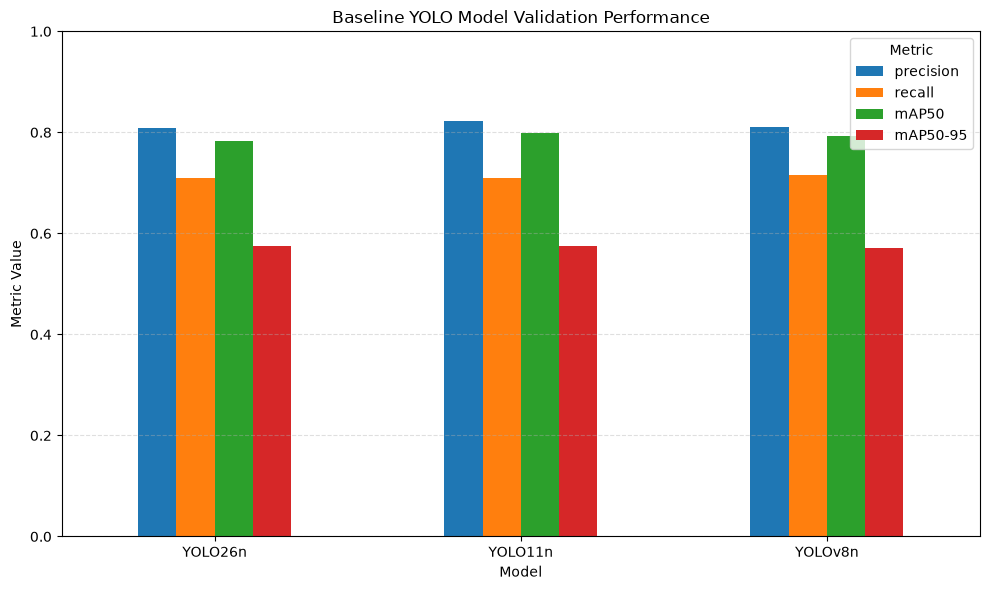

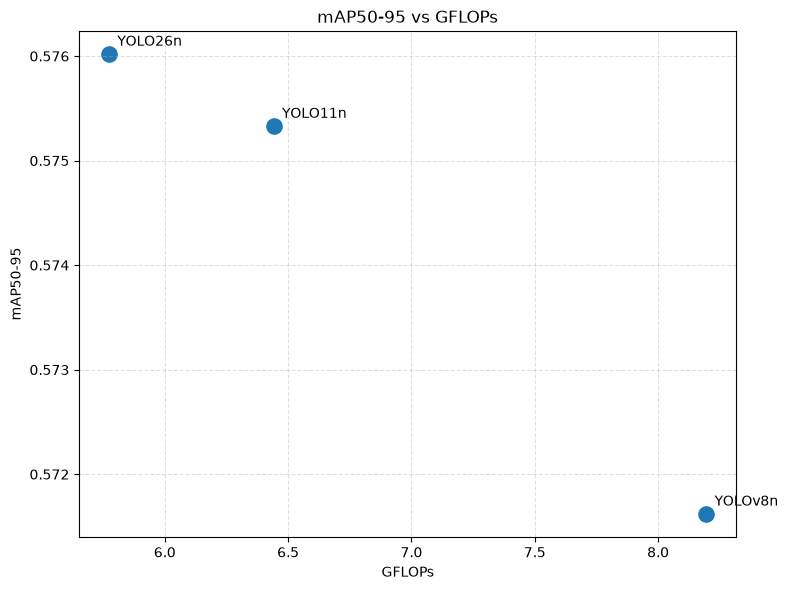

In [47]:
import matplotlib.pyplot as plt

# Graph 1: Validation performance comparison


performance_metrics = ["precision", "recall", "mAP50", "mAP50-95"]

performance_plot_df = baseline_comparison_df.set_index("model")[performance_metrics]

ax = performance_plot_df.plot(
    kind="bar",
    figsize=(10, 6)
)

plt.title("Baseline YOLO Model Validation Performance")
plt.ylabel("Metric Value")
plt.xlabel("Model")
plt.ylim(0, 1)
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.legend(title="Metric")
plt.tight_layout()
plt.show()


# Graph 2: Performance vs computational cost

efficiency_df = baseline_comparison_df.dropna(subset=["GFLOPs", "mAP50-95"])

if len(efficiency_df) == 0:
    print("GFLOPs values are not available, so the efficiency graph cannot be created.")
else:
    plt.figure(figsize=(8, 6))

    plt.scatter(
        efficiency_df["GFLOPs"],
        efficiency_df["mAP50-95"],
        s=120
    )

    for _, row in efficiency_df.iterrows():
        plt.annotate(
            row["model"],
            (row["GFLOPs"], row["mAP50-95"]),
            textcoords="offset points",
            xytext=(6, 6)
        )

    plt.title("mAP50-95 vs GFLOPs")
    plt.xlabel("GFLOPs")
    plt.ylabel("mAP50-95")
    plt.grid(True, linestyle="--", alpha=0.4)
    plt.tight_layout()
    plt.show()

### Selected Baseline Model

The baseline comparison shows that all three nano YOLO models achieved similar validation performance.

YOLO11n achieved the highest precision and mAP50, while YOLOv8n achieved the highest recall.

However, YOLO26n achieved the best mAP50-95 score and also had the lowest computational cost, with the fewest parameters, lowest GFLOPs, and smallest model size.

Therefore, YOLO26n was selected as the main model for the next experiments, because it provided the best balance between detection performance and lightweight inference.

### 2.6 Training the Selected Model Without Augmentations

After selecting YOLO26n as the main model, I trained it without online training augmentations.

This was done in two settings:

1. **Original Dataset Without Augmentations**  
   YOLO26n was trained on the original YOLO dataset while all online training augmentations were disabled.

2. **Vehicle-Balanced Dataset Without Augmentations**  
   YOLO26n was trained on the vehicle-balanced dataset while all online training augmentations were disabled.

In both runs, augmentation parameters such as color changes, geometric transformations, horizontal flipping, mosaic, mixup, and copy-paste were set to zero.

The goal of these experiments is to create clean reference runs for the later comparisons:

- The original dataset without augmentations is compared against the original dataset with augmentations.
- The vehicle-balanced dataset without augmentations is compared against the vehicle-balanced dataset with augmentations.

This allows me to check the effect of training augmentations in both dataset settings.

In [48]:
from pathlib import Path
import torch
import yaml
from ultralytics import YOLO

# YOLO26n - Original Dataset - No Training Augmentations


DATASET_DIR = Path("yolo_dataset")
DATA_YAML_PATH = DATASET_DIR / "data.yaml"

YOLO26N_WEIGHTS = "yolo26n.pt"


YOLO26N_NO_AUG_PROJECT = "runs/detect/training_runs/augmentation_tests/yolo26n"
YOLO26N_NO_AUG_RUN_NAME = "no_augmentation_training"
YOLO26N_NO_AUG_RUN_PATH = Path(YOLO26N_NO_AUG_PROJECT) / YOLO26N_NO_AUG_RUN_NAME

YOLO26N_NO_AUG_EPOCHS = 100
YOLO26N_NO_AUG_PATIENCE = 15
YOLO26N_NO_AUG_IMG_SIZE = 640
YOLO26N_NO_AUG_BATCH_SIZE = 16

TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"



print("YOLO26n - Original Dataset - No Training Augmentations")


if is_training_run_complete(YOLO26N_NO_AUG_RUN_PATH):
    print("\nCompleted run already exists. Skipping training.")
    print_saved_training_args(YOLO26N_NO_AUG_RUN_PATH)

else:
    print("\nNo completed run found. Starting training...")

    model = YOLO(YOLO26N_WEIGHTS)

    results = model.train(
        data=str(DATA_YAML_PATH),
        epochs=YOLO26N_NO_AUG_EPOCHS,
        patience=YOLO26N_NO_AUG_PATIENCE,
        imgsz=YOLO26N_NO_AUG_IMG_SIZE,
        batch=YOLO26N_NO_AUG_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        verbose=True,

        seed=0,
        deterministic=True,

        project=YOLO26N_NO_AUG_PROJECT,
        name=YOLO26N_NO_AUG_RUN_NAME,
        exist_ok=True,

      
        # Disable YOLO training augmentations
       
        hsv_h=0.0,
        hsv_s=0.0,
        hsv_v=0.0,

        degrees=0.0,
        translate=0.0,
        scale=0.0,
        shear=0.0,
        perspective=0.0,

        flipud=0.0,
        fliplr=0.0,

        mosaic=0.0,
        mixup=0.0,
        copy_paste=0.0,
        close_mosaic=0
    )

    print("\nYOLO26n no-augmentation training finished.")
    print_saved_training_args(YOLO26N_NO_AUG_RUN_PATH)


print("\nFinal check:")
print("-" * 60)
print("best.pt:", (YOLO26N_NO_AUG_RUN_PATH / "weights" / "best.pt").exists())
print("results.csv:", (YOLO26N_NO_AUG_RUN_PATH / "results.csv").exists())
print("args.yaml:", (YOLO26N_NO_AUG_RUN_PATH / "args.yaml").exists())

YOLO26n - Original Dataset - No Training Augmentations

Completed run already exists. Skipping training.

Saved training args check
------------------------------------------------------------
data: yolo_dataset\data.yaml
model: yolo26n.pt
project: training_runs/augmentation_tests/yolo26n
name: no_augmentation_training

Augmentation values:
hsv_h: 0.0
hsv_s: 0.0
hsv_v: 0.0
degrees: 0.0
translate: 0.0
scale: 0.0
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.0
mosaic: 0.0
mixup: 0.0
copy_paste: 0.0

Final check:
------------------------------------------------------------
best.pt: True
results.csv: True
args.yaml: True


results.csv exists: True
results.csv path: runs\detect\training_runs\augmentation_tests\yolo26n\no_augmentation_training\results.csv


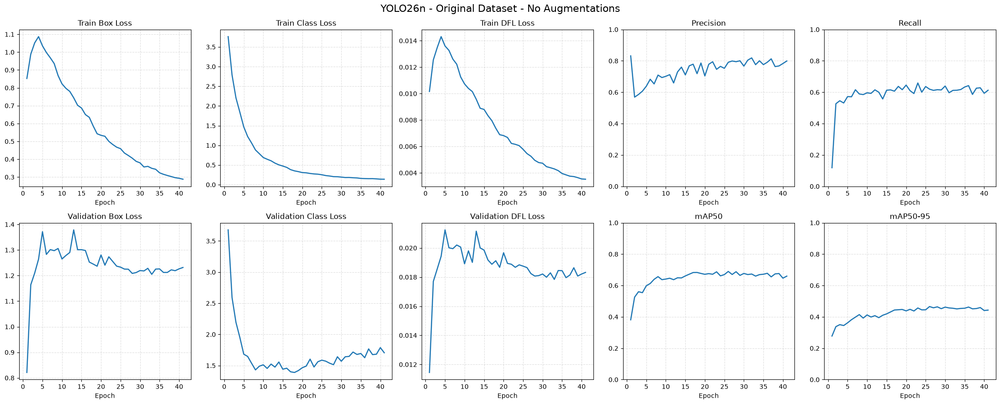

In [49]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# YOLO26n - Original Dataset - No Augmentations Training Curves


NO_AUG_RESULTS_CSV = (
    YOLO26N_NO_AUG_RUN_PATH / "results.csv"
)

print("results.csv exists:", NO_AUG_RESULTS_CSV.exists())
print("results.csv path:", NO_AUG_RESULTS_CSV)

if not NO_AUG_RESULTS_CSV.exists():
    raise FileNotFoundError(f"results.csv was not found: {NO_AUG_RESULTS_CSV}")

results_df = pd.read_csv(NO_AUG_RESULTS_CSV)
results_df.columns = results_df.columns.str.strip()

curves_to_plot = [
    ("train/box_loss", "Train Box Loss"),
    ("train/cls_loss", "Train Class Loss"),
    ("train/dfl_loss", "Train DFL Loss"),
    ("metrics/precision(B)", "Precision"),
    ("metrics/recall(B)", "Recall"),
    ("val/box_loss", "Validation Box Loss"),
    ("val/cls_loss", "Validation Class Loss"),
    ("val/dfl_loss", "Validation DFL Loss"),
    ("metrics/mAP50(B)", "mAP50"),
    ("metrics/mAP50-95(B)", "mAP50-95")
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, (column, title) in zip(axes, curves_to_plot):
    if column not in results_df.columns:
        ax.set_title(f"Missing: {title}")
        ax.axis("off")
        continue

    ax.plot(
        results_df["epoch"],
        results_df[column],
        linewidth=1.8
    )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

plt.suptitle(
    "YOLO26n - Original Dataset - No Augmentations",
    fontsize=16
)
plt.tight_layout()
plt.show()

In [50]:
from pathlib import Path
import torch
import yaml
from ultralytics import YOLO

# YOLO26n - Vehicle-Balanced Dataset - Without Augmentations


BALANCED_DATASET_DIR = Path("yolo_dataset_balanced")
BALANCED_DATA_YAML_PATH = BALANCED_DATASET_DIR / "data.yaml"

YOLO26N_WEIGHTS = "yolo26n.pt"

YOLO26N_BALANCED_PROJECT = "runs/detect/training_runs/augmentation_tests/yolo26n"
YOLO26N_BALANCED_NO_AUG_RUN_NAME = "v4_vehicle_balanced_no_training_augmentations"
YOLO26N_BALANCED_NO_AUG_RUN_PATH = Path(YOLO26N_BALANCED_PROJECT) / YOLO26N_BALANCED_NO_AUG_RUN_NAME

BALANCED_EPOCHS = 100
BALANCED_PATIENCE = 15
BALANCED_IMG_SIZE = 640
BALANCED_BATCH_SIZE = 16

TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"


print("YOLO26n - Vehicle-Balanced Dataset Without Augmentations")
print("-" * 60)
print("Balanced data.yaml exists:", BALANCED_DATA_YAML_PATH.exists())
print("Run path:", YOLO26N_BALANCED_NO_AUG_RUN_PATH)
print("Device:", TRAIN_DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


if is_training_run_complete(YOLO26N_BALANCED_NO_AUG_RUN_PATH):
    print("\nCompleted run already exists. Skipping training.")
    print_saved_training_args(YOLO26N_BALANCED_NO_AUG_RUN_PATH)

else:
    print("\nNo completed run found. Starting training...")

    model = YOLO(YOLO26N_WEIGHTS)

    results = model.train(
        data=str(BALANCED_DATA_YAML_PATH),
        epochs=BALANCED_EPOCHS,
        patience=BALANCED_PATIENCE,
        imgsz=BALANCED_IMG_SIZE,
        batch=BALANCED_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        verbose=True,

        seed=0,
        deterministic=True,

        project=YOLO26N_BALANCED_PROJECT,
        name=YOLO26N_BALANCED_NO_AUG_RUN_NAME,
        exist_ok=True,

        # Disable all online training augmentations
        # The dataset itself is already vehicle-balanced.
 
        hsv_h=0.0,
        hsv_s=0.0,
        hsv_v=0.0,

        degrees=0.0,
        translate=0.0,
        scale=0.0,
        shear=0.0,
        perspective=0.0,

        flipud=0.0,
        fliplr=0.0,

        mosaic=0.0,
        mixup=0.0,
        copy_paste=0.0,
        close_mosaic=0
    )

    print("\nTraining finished.")
    print_saved_training_args(YOLO26N_BALANCED_NO_AUG_RUN_PATH)


print("\nFinal check:")
print("best.pt:", (YOLO26N_BALANCED_NO_AUG_RUN_PATH / "weights" / "best.pt").exists())
print("results.csv:", (YOLO26N_BALANCED_NO_AUG_RUN_PATH / "results.csv").exists())
print("args.yaml:", (YOLO26N_BALANCED_NO_AUG_RUN_PATH / "args.yaml").exists())

YOLO26n - Vehicle-Balanced Dataset Without Augmentations
------------------------------------------------------------
Balanced data.yaml exists: True
Run path: runs\detect\training_runs\augmentation_tests\yolo26n\v4_vehicle_balanced_no_training_augmentations
Device: 0
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU

Completed run already exists. Skipping training.

Saved training args check
------------------------------------------------------------
data: yolo_dataset_balanced\data.yaml
model: yolo26n.pt
project: runs/detect/training_runs/augmentation_tests/yolo26n
name: v4_vehicle_balanced_no_training_augmentations

Augmentation values:
hsv_h: 0.0
hsv_s: 0.0
hsv_v: 0.0
degrees: 0.0
translate: 0.0
scale: 0.0
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.0
mosaic: 0.0
mixup: 0.0
copy_paste: 0.0

Final check:
best.pt: True
results.csv: True
args.yaml: True


results.csv exists: True
results.csv path: runs\detect\training_runs\augmentation_tests\yolo26n\v4_vehicle_balanced_no_training_augmentations\results.csv


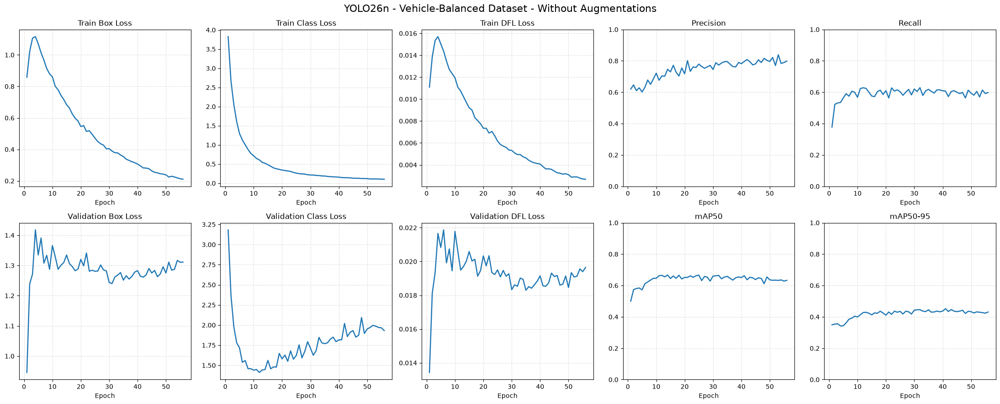

In [51]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# YOLO26n - Vehicle-Balanced Dataset - Without Augmentations Training Curves


BALANCED_NO_AUG_RESULTS_CSV = (
    YOLO26N_BALANCED_NO_AUG_RUN_PATH / "results.csv"
)

print("results.csv exists:", BALANCED_NO_AUG_RESULTS_CSV.exists())
print("results.csv path:", BALANCED_NO_AUG_RESULTS_CSV)

if not BALANCED_NO_AUG_RESULTS_CSV.exists():
    raise FileNotFoundError(f"results.csv was not found: {BALANCED_NO_AUG_RESULTS_CSV}")

results_df = pd.read_csv(BALANCED_NO_AUG_RESULTS_CSV)
results_df.columns = results_df.columns.str.strip()

curves_to_plot = [
    ("train/box_loss", "Train Box Loss"),
    ("train/cls_loss", "Train Class Loss"),
    ("train/dfl_loss", "Train DFL Loss"),
    ("metrics/precision(B)", "Precision"),
    ("metrics/recall(B)", "Recall"),
    ("val/box_loss", "Validation Box Loss"),
    ("val/cls_loss", "Validation Class Loss"),
    ("val/dfl_loss", "Validation DFL Loss"),
    ("metrics/mAP50(B)", "mAP50"),
    ("metrics/mAP50-95(B)", "mAP50-95")
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, (column, title) in zip(axes, curves_to_plot):
    if column not in results_df.columns:
        ax.set_title(f"Missing: {title}")
        ax.axis("off")
        continue

    ax.plot(
        results_df["epoch"],
        results_df[column],
        linewidth=1.8
    )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

plt.suptitle(
    "YOLO26n - Vehicle-Balanced Dataset - Without Augmentations",
    fontsize=16
)
plt.tight_layout()
plt.show()

### 2.7 Training the Selected Model With Augmentations

After the model selection stage, YOLO26n was selected as the main model for the final experiments.

In this stage, YOLO26n was trained with online training augmentations in two dataset settings:

1. **Original Dataset With Augmentations**  
   YOLO26n was trained on the original YOLO dataset with training augmentations enabled.  
   This experiment is referred to as **YOLO26n - With Augmentations**.

2. **Vehicle-Balanced Dataset With Augmentations**  
   YOLO26n was trained on the vehicle-focused balanced dataset with training augmentations enabled.  
   This experiment checks whether augmentations still help after improving the representation of vehicles in the training data.

The augmentation setup includes color changes, geometric transformations, horizontal flipping, mosaic, mixup, and copy-paste.

The goal of these experiments is to check whether training augmentations improve generalization, recall, and mAP in both dataset settings.

These runs will later be compared against the matching no-augmentation runs:

- Original dataset without augmentations vs original dataset with augmentations.
- Vehicle-balanced dataset without augmentations vs vehicle-balanced dataset with augmentations.

This structure allows the effect of augmentations to be analyzed more clearly in both the original dataset and the vehicle-balanced dataset.

In [52]:
from pathlib import Path
import torch
import yaml
from ultralytics import YOLO


# YOLO26n - Original Dataset - With Training Augmentations


ORIGINAL_DATASET_DIR = Path("yolo_dataset")
ORIGINAL_DATA_YAML_PATH = ORIGINAL_DATASET_DIR / "data.yaml"

YOLO26N_WEIGHTS = "yolo26n.pt"

YOLO26N_AUG_PROJECT_DIR = Path("runs/detect/training_runs/augmentation_tests/yolo26n")
YOLO26N_AUG_RUN_NAME = "v2_yolo_with_augmentations"
YOLO26N_AUG_RUN_PATH = YOLO26N_AUG_PROJECT_DIR / YOLO26N_AUG_RUN_NAME

AUG_EPOCHS = 100
AUG_PATIENCE = 15
AUG_IMG_SIZE = 640
AUG_BATCH_SIZE = 16

TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"


print("YOLO26n - Original Dataset With Augmentations")
print("-" * 60)
print("Original data.yaml exists:", ORIGINAL_DATA_YAML_PATH.exists())
print("Run path:", YOLO26N_AUG_RUN_PATH)
print("Device:", TRAIN_DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


if is_training_run_complete(YOLO26N_AUG_RUN_PATH):
    print("\nCompleted run already exists. Skipping training.")
    print_saved_training_args(YOLO26N_AUG_RUN_PATH)

else:
    print("\nNo completed run found. Starting training...")

    model = YOLO(YOLO26N_WEIGHTS)

    results = model.train(
        data=str(ORIGINAL_DATA_YAML_PATH),
        epochs=AUG_EPOCHS,
        patience=AUG_PATIENCE,
        imgsz=AUG_IMG_SIZE,
        batch=AUG_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        verbose=True,

        seed=0,
        deterministic=True,

        project=str(YOLO26N_AUG_PROJECT_DIR),
        name=YOLO26N_AUG_RUN_NAME,
        exist_ok=True,

        
        # Training augmentations

        hsv_h=0.020,
        hsv_s=0.70,
        hsv_v=0.50,

        degrees=7.0,
        translate=0.12,
        scale=0.60,
        shear=0.0,
        perspective=0.0,

        flipud=0.0,
        fliplr=0.5,

        mosaic=1.00,
        mixup=0.10,
        copy_paste=0.10,
        close_mosaic=10
    )

    print("\nTraining finished.")
    print_saved_training_args(YOLO26N_AUG_RUN_PATH)


print("\nFinal check:")
print("-" * 60)
print("best.pt:", (YOLO26N_AUG_RUN_PATH / "weights" / "best.pt").exists())
print("results.csv:", (YOLO26N_AUG_RUN_PATH / "results.csv").exists())
print("args.yaml:", (YOLO26N_AUG_RUN_PATH / "args.yaml").exists())

YOLO26n - Original Dataset With Augmentations
------------------------------------------------------------
Original data.yaml exists: True
Run path: runs\detect\training_runs\augmentation_tests\yolo26n\v2_yolo_with_augmentations
Device: 0
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU

Completed run already exists. Skipping training.

Saved training args check
------------------------------------------------------------
data: yolo_dataset\data.yaml
model: yolo26n.pt
project: runs\detect\training_runs\augmentation_tests\yolo26n
name: v2_yolo_with_augmentations

Augmentation values:
hsv_h: 0.02
hsv_s: 0.7
hsv_v: 0.5
degrees: 7.0
translate: 0.12
scale: 0.6
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.5
mosaic: 1.0
mixup: 0.1
copy_paste: 0.1

Final check:
------------------------------------------------------------
best.pt: True
results.csv: True
args.yaml: True


results.csv exists: True
results.csv path: runs\detect\training_runs\augmentation_tests\yolo26n\v2_yolo_with_augmentations\results.csv


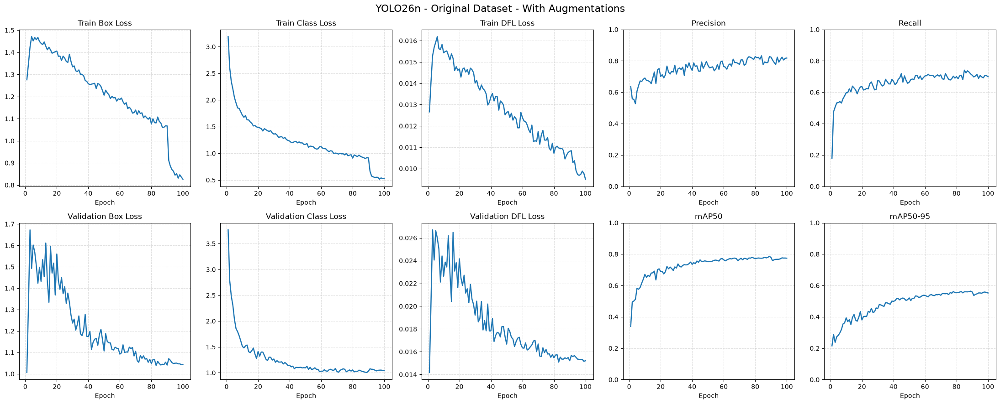

In [53]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# YOLO26n - Original Dataset - With Augmentations Training Curves


ORIGINAL_WITH_AUG_RESULTS_CSV = (
    YOLO26N_AUG_RUN_PATH / "results.csv"
)

print("results.csv exists:", ORIGINAL_WITH_AUG_RESULTS_CSV.exists())
print("results.csv path:", ORIGINAL_WITH_AUG_RESULTS_CSV)

if not ORIGINAL_WITH_AUG_RESULTS_CSV.exists():
    raise FileNotFoundError(f"results.csv was not found: {ORIGINAL_WITH_AUG_RESULTS_CSV}")

results_df = pd.read_csv(ORIGINAL_WITH_AUG_RESULTS_CSV)
results_df.columns = results_df.columns.str.strip()

curves_to_plot = [
    ("train/box_loss", "Train Box Loss"),
    ("train/cls_loss", "Train Class Loss"),
    ("train/dfl_loss", "Train DFL Loss"),
    ("metrics/precision(B)", "Precision"),
    ("metrics/recall(B)", "Recall"),
    ("val/box_loss", "Validation Box Loss"),
    ("val/cls_loss", "Validation Class Loss"),
    ("val/dfl_loss", "Validation DFL Loss"),
    ("metrics/mAP50(B)", "mAP50"),
    ("metrics/mAP50-95(B)", "mAP50-95")
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, (column, title) in zip(axes, curves_to_plot):
    if column not in results_df.columns:
        ax.set_title(f"Missing: {title}")
        ax.axis("off")
        continue

    ax.plot(
        results_df["epoch"],
        results_df[column],
        linewidth=1.8
    )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

plt.suptitle(
    "YOLO26n - Original Dataset - With Augmentations",
    fontsize=16
)
plt.tight_layout()
plt.show()

In [54]:
from pathlib import Path
import torch
import yaml
from ultralytics import YOLO


# YOLO26n - Vehicle-Balanced Dataset - With Augmentations


BALANCED_DATASET_DIR = Path("yolo_dataset_balanced")
BALANCED_DATA_YAML_PATH = BALANCED_DATASET_DIR / "data.yaml"

YOLO26N_WEIGHTS = "yolo26n.pt"

YOLO26N_BALANCED_PROJECT = "runs/detect/training_runs/augmentation_tests/yolo26n"
YOLO26N_BALANCED_AUG_RUN_NAME = "v3_yolo_with_augmentations_vehicle_balanced_dataset"
YOLO26N_BALANCED_AUG_RUN_PATH = Path(YOLO26N_BALANCED_PROJECT) / YOLO26N_BALANCED_AUG_RUN_NAME

BALANCED_EPOCHS = 100
BALANCED_PATIENCE = 15
BALANCED_IMG_SIZE = 640
BALANCED_BATCH_SIZE = 16

TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"



print("YOLO26n - Vehicle-Balanced Dataset With Augmentations")
print("-" * 60)
print("Balanced data.yaml exists:", BALANCED_DATA_YAML_PATH.exists())
print("Run path:", YOLO26N_BALANCED_AUG_RUN_PATH)
print("Device:", TRAIN_DEVICE)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))


if is_training_run_complete(YOLO26N_BALANCED_AUG_RUN_PATH):
    print("\nCompleted run already exists. Skipping training.")
    print_saved_training_args(YOLO26N_BALANCED_AUG_RUN_PATH)

else:
    print("\nNo completed run found. Starting training...")

    model = YOLO(YOLO26N_WEIGHTS)

    results = model.train(
        data=str(BALANCED_DATA_YAML_PATH),
        epochs=BALANCED_EPOCHS,
        patience=BALANCED_PATIENCE,
        imgsz=BALANCED_IMG_SIZE,
        batch=BALANCED_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        verbose=True,

        seed=0,
        deterministic=True,

        project=YOLO26N_BALANCED_PROJECT,
        name=YOLO26N_BALANCED_AUG_RUN_NAME,
        exist_ok=True,


        # Training augmentations

        hsv_h=0.015,
        hsv_s=0.60,
        hsv_v=0.40,

        degrees=5.0,
        translate=0.10,
        scale=0.50,
        shear=0.0,
        perspective=0.0,

        flipud=0.0,
        fliplr=0.5,

        mosaic=0.50,
        mixup=0.05,
        copy_paste=0.05,
        close_mosaic=10
    )

    print("\nTraining finished.")
    print_saved_training_args(YOLO26N_BALANCED_AUG_RUN_PATH)


print("\nFinal check:")
print("best.pt:", (YOLO26N_BALANCED_AUG_RUN_PATH / "weights" / "best.pt").exists())
print("results.csv:", (YOLO26N_BALANCED_AUG_RUN_PATH / "results.csv").exists())
print("args.yaml:", (YOLO26N_BALANCED_AUG_RUN_PATH / "args.yaml").exists())

YOLO26n - Vehicle-Balanced Dataset With Augmentations
------------------------------------------------------------
Balanced data.yaml exists: True
Run path: runs\detect\training_runs\augmentation_tests\yolo26n\v3_yolo_with_augmentations_vehicle_balanced_dataset
Device: 0
GPU: NVIDIA GeForce RTX 3050 Ti Laptop GPU

Completed run already exists. Skipping training.

Saved training args check
------------------------------------------------------------
data: yolo_dataset_balanced\data.yaml
model: yolo26n.pt
project: runs\detect\training_runs\augmentation_tests\yolo26n
name: v3_yolo_with_augmentations_vehicle_balanced_dataset

Augmentation values:
hsv_h: 0.015
hsv_s: 0.6
hsv_v: 0.4
degrees: 5.0
translate: 0.1
scale: 0.5
shear: 0.0
perspective: 0.0
flipud: 0.0
fliplr: 0.5
mosaic: 0.5
mixup: 0.05
copy_paste: 0.05

Final check:
best.pt: True
results.csv: True
args.yaml: True


results.csv exists: True
results.csv path: runs\detect\training_runs\augmentation_tests\yolo26n\v3_yolo_with_augmentations_vehicle_balanced_dataset\results.csv


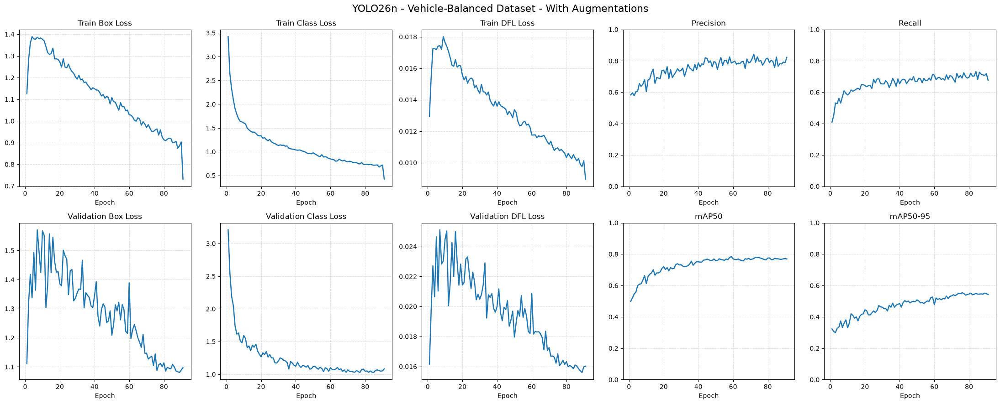

In [55]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# YOLO26n - Vehicle-Balanced Dataset - With Augmentations Training Curves


BALANCED_WITH_AUG_RESULTS_CSV = (
    YOLO26N_BALANCED_AUG_RUN_PATH / "results.csv"
)

print("results.csv exists:", BALANCED_WITH_AUG_RESULTS_CSV.exists())
print("results.csv path:", BALANCED_WITH_AUG_RESULTS_CSV)

if not BALANCED_WITH_AUG_RESULTS_CSV.exists():
    raise FileNotFoundError(f"results.csv was not found: {BALANCED_WITH_AUG_RESULTS_CSV}")

results_df = pd.read_csv(BALANCED_WITH_AUG_RESULTS_CSV)
results_df.columns = results_df.columns.str.strip()

curves_to_plot = [
    ("train/box_loss", "Train Box Loss"),
    ("train/cls_loss", "Train Class Loss"),
    ("train/dfl_loss", "Train DFL Loss"),
    ("metrics/precision(B)", "Precision"),
    ("metrics/recall(B)", "Recall"),
    ("val/box_loss", "Validation Box Loss"),
    ("val/cls_loss", "Validation Class Loss"),
    ("val/dfl_loss", "Validation DFL Loss"),
    ("metrics/mAP50(B)", "mAP50"),
    ("metrics/mAP50-95(B)", "mAP50-95")
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, (column, title) in zip(axes, curves_to_plot):
    if column not in results_df.columns:
        ax.set_title(f"Missing: {title}")
        ax.axis("off")
        continue

    ax.plot(
        results_df["epoch"],
        results_df[column],
        linewidth=1.8
    )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

plt.suptitle(
    "YOLO26n - Vehicle-Balanced Dataset - With Augmentations",
    fontsize=16
)
plt.tight_layout()
plt.show()

### 2.8 Training Results Comparison

In this section, I compare the YOLO26n training experiments in two stages.

First, I compare the YOLO26n model trained on the original dataset without augmentations against the same model trained on the original dataset with augmentations:

- Original Dataset Without Augmentations
- Original Dataset With Augmentations

This comparison evaluates the effect of training augmentations while keeping the dataset unchanged.

Then, I compare the YOLO26n experiments trained on the vehicle-balanced dataset:

- Vehicle-Balanced Dataset Without Augmentations
- Vehicle-Balanced Dataset With Augmentations

This comparison checks whether training augmentations still improve the model after increasing the representation of vehicles in the training data.

Overall, this comparison is used to answer two main questions:

1. Do training augmentations improve YOLO26n performance on the original dataset?
2. Do training augmentations improve YOLO26n performance on the vehicle-balanced dataset?

Together, these comparisons help analyze the effect of augmentations in both the original dataset and the vehicle-balanced dataset.

#### Original Dataset: No Augmentations vs With Augmentations

In this comparison, I evaluate YOLO26n on the original YOLO dataset using two training setups:

- Original Dataset Without Augmentations
- Original Dataset With Augmentations

The no-augmentation run is used as a clean reference point, where all online training augmentations were disabled.

The augmentation run uses color changes, geometric transformations, horizontal flipping, mosaic, mixup, and copy-paste.

The goal of this comparison is to check whether training augmentations improve the validation performance of YOLO26n when the dataset itself remains unchanged.

In [56]:
from pathlib import Path
import pandas as pd

# Original Dataset Comparison + Improvement Table


ORIGINAL_DATASET_COMPARISON_RUNS = {
    "Original Dataset Without Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/no_augmentation_training"
    ),
    "Original Dataset With Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v2_yolo_with_augmentations"
    )
}


def is_training_run_complete(run_path):
    run_path = Path(run_path)

    return (
        (run_path / "weights" / "best.pt").exists()
        and (run_path / "results.csv").exists()
        and (run_path / "args.yaml").exists()
    )


def get_best_metrics(run_name, run_path):
    run_path = Path(run_path)
    results_csv_path = run_path / "results.csv"

    results_df = pd.read_csv(results_csv_path)
    results_df.columns = results_df.columns.str.strip()

    best_row_index = results_df["metrics/mAP50-95(B)"].idxmax()
    best_row = results_df.loc[best_row_index]

    return {
        "run": run_name,
        "precision": best_row["metrics/precision(B)"],
        "recall": best_row["metrics/recall(B)"],
        "mAP50": best_row["metrics/mAP50(B)"],
        "mAP50-95": best_row["metrics/mAP50-95(B)"],
        "best_epoch": int(best_row["epoch"]),
        "last_epoch": int(results_df["epoch"].iloc[-1])
    }



# Build comparison table

comparison_rows = []

for run_name, run_path in ORIGINAL_DATASET_COMPARISON_RUNS.items():
    if is_training_run_complete(run_path):
        comparison_rows.append(get_best_metrics(run_name, run_path))
    else:
        print(f"Run is missing or incomplete: {run_name}")
        print("Path:", run_path)

original_aug_comparison_df = pd.DataFrame(comparison_rows)

run_order = [
    "Original Dataset Without Augmentations",
    "Original Dataset With Augmentations"
]

original_aug_comparison_df["run"] = pd.Categorical(
    original_aug_comparison_df["run"],
    categories=run_order,
    ordered=True
)

original_aug_comparison_df = original_aug_comparison_df.sort_values("run").reset_index(drop=True)

original_aug_comparison_df = original_aug_comparison_df.round({
    "precision": 5,
    "recall": 5,
    "mAP50": 5,
    "mAP50-95": 5
})

print("Original Dataset Comparison")
display(original_aug_comparison_df)



# Build improvement table

metrics_to_compare = ["precision", "recall", "mAP50", "mAP50-95"]

baseline_name = "Original Dataset Without Augmentations"
augmented_name = "Original Dataset With Augmentations"

baseline_row = original_aug_comparison_df[
    original_aug_comparison_df["run"].astype(str) == baseline_name
].iloc[0]

augmented_row = original_aug_comparison_df[
    original_aug_comparison_df["run"].astype(str) == augmented_name
].iloc[0]

improvement_rows = []

for metric in metrics_to_compare:
    baseline_value = baseline_row[metric]
    augmented_value = augmented_row[metric]

    absolute_improvement = augmented_value - baseline_value
    relative_improvement = (absolute_improvement / baseline_value) * 100

    improvement_rows.append({
        "metric": metric,
        "without_augmentations": baseline_value,
        "with_augmentations": augmented_value,
        "absolute_improvement": absolute_improvement,
        "relative_improvement_%": relative_improvement
    })

original_aug_improvement_df = pd.DataFrame(improvement_rows)

original_aug_improvement_df = original_aug_improvement_df.round({
    "without_augmentations": 5,
    "with_augmentations": 5,
    "absolute_improvement": 5,
    "relative_improvement_%": 2
})

print("Original Dataset Improvement Table")
display(original_aug_improvement_df)

Original Dataset Comparison


,run,precision,recall,mAP50,mAP50-95,best_epoch,last_epoch
0,Original Dataset Without Augmentations,0.79094,0.61950,0.68957,0.46574,26,41
1,Original Dataset With Augmentations,0.82749,0.71639,0.78622,0.56382,89,100


Original Dataset Improvement Table


,metric,without_augmentations,with_augmentations,absolute_improvement,relative_improvement_%
0,precision,0.79094,0.82749,0.03655,4.62
1,recall,0.61950,0.71639,0.09689,15.64
2,mAP50,0.68957,0.78622,0.09665,14.02
3,mAP50-95,0.46574,0.56382,0.09808,21.06


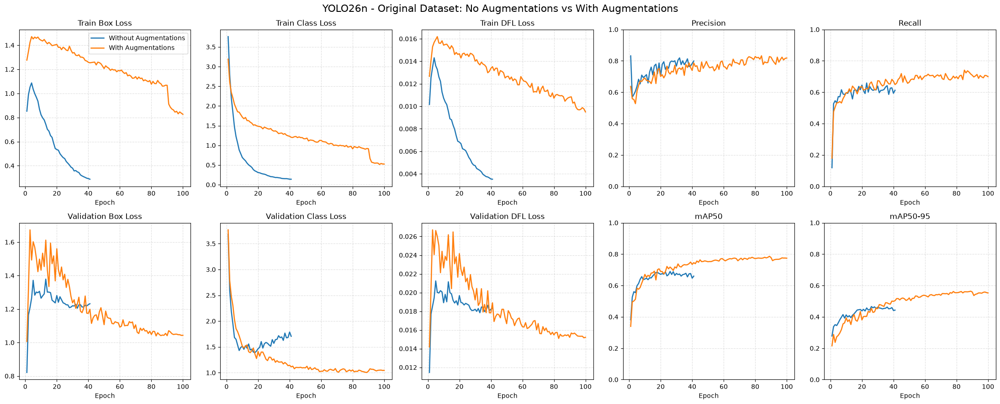

In [57]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# YOLO26n - Original Dataset: Training Curves Comparison
# No Augmentations vs With Augmentations


ORIGINAL_CURVE_RUNS = {
    "Without Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/no_augmentation_training"
    ),
    "With Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v2_yolo_with_augmentations"
    )
}

curve_columns = [
    "train/box_loss",
    "train/cls_loss",
    "train/dfl_loss",
    "metrics/precision(B)",
    "metrics/recall(B)",
    "val/box_loss",
    "val/cls_loss",
    "val/dfl_loss",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)"
]

curve_titles = [
    "Train Box Loss",
    "Train Class Loss",
    "Train DFL Loss",
    "Precision",
    "Recall",
    "Validation Box Loss",
    "Validation Class Loss",
    "Validation DFL Loss",
    "mAP50",
    "mAP50-95"
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, column, title in zip(axes, curve_columns, curve_titles):
    for run_name, run_path in ORIGINAL_CURVE_RUNS.items():
        results_path = run_path / "results.csv"

        if not results_path.exists():
            print("Missing results.csv:", results_path)
            continue

        results_df = pd.read_csv(results_path)
        results_df.columns = results_df.columns.str.strip()

        if column not in results_df.columns:
            print(f"Missing column {column} in {results_path}")
            continue

        ax.plot(
            results_df["epoch"],
            results_df[column],
            label=run_name,
            linewidth=1.8
        )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

axes[0].legend()
plt.suptitle(
    "YOLO26n - Original Dataset: No Augmentations vs With Augmentations",
    fontsize=16
)
plt.tight_layout()
plt.show()

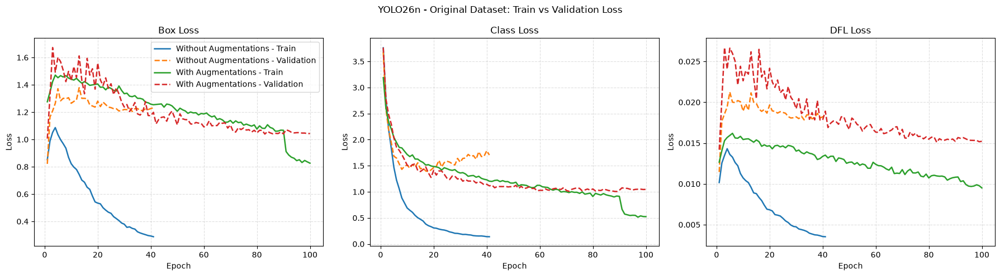

In [58]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# YOLO26n - Original Dataset: Train vs Validation Loss Curves


ORIGINAL_CURVE_RUNS = {
    "Without Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/no_augmentation_training"
    ),
    "With Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v2_yolo_with_augmentations"
    )
}

loss_pairs = [
    ("Box Loss", "train/box_loss", "val/box_loss"),
    ("Class Loss", "train/cls_loss", "val/cls_loss"),
    ("DFL Loss", "train/dfl_loss", "val/dfl_loss")
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (title, train_col, val_col) in zip(axes, loss_pairs):
    for run_name, run_path in ORIGINAL_CURVE_RUNS.items():
        results_path = run_path / "results.csv"

        if not results_path.exists():
            print("Missing results.csv:", results_path)
            continue

        results_df = pd.read_csv(results_path)
        results_df.columns = results_df.columns.str.strip()

        ax.plot(
            results_df["epoch"],
            results_df[train_col],
            label=f"{run_name} - Train",
            linewidth=1.8
        )

        ax.plot(
            results_df["epoch"],
            results_df[val_col],
            label=f"{run_name} - Validation",
            linewidth=1.8,
            linestyle="--"
        )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.grid(True, linestyle="--", alpha=0.4)

axes[0].legend()
plt.suptitle("YOLO26n - Original Dataset: Train vs Validation Loss")
plt.tight_layout()
plt.show()

The train vs validation loss curves show that the no-augmentation model fits the training data more easily, as its training losses decrease quickly.

However, the validation losses do not improve in the same way, which suggests weaker generalization and possible overfitting.

In contrast, the augmented model has higher training losses because the training images are more difficult due to the augmentation pipeline.

Despite this, the augmented model achieves better validation behavior and better validation metrics, including higher recall, mAP50, and mAP50-95.

This supports the conclusion that the augmentation setup improved the model's ability to generalize on the original dataset.

In [59]:
from pathlib import Path
import torch
from ultralytics import YOLO


# Create Confusion Matrices - Original Dataset Comparison
# Correct save path without duplicated runs/detect


PROJECT_ROOT = Path.cwd()

# Safety check in case notebook is accidentally running from runs/detect
if PROJECT_ROOT.name == "detect" and PROJECT_ROOT.parent.name == "runs":
    PROJECT_ROOT = PROJECT_ROOT.parent.parent

ORIGINAL_DATA_YAML_PATH = PROJECT_ROOT / "yolo_dataset" / "data.yaml"

EVAL_PROJECT_DIR = PROJECT_ROOT / "runs" / "detect" / "evaluation_plots" / "yolo26n_no_aug_vs_aug"

EVAL_IMG_SIZE = 640
EVAL_BATCH_SIZE = 16
TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"

EVALUATION_RUNS = {
    "Original Dataset Without Augmentations": {
        "weights": PROJECT_ROOT / "runs" / "detect" / "training_runs" / "augmentation_tests" / "yolo26n" / "no_augmentation_training" / "weights" / "best.pt",
        "eval_name": "no_augmentation_training"
    },
    "Original Dataset With Augmentations": {
        "weights": PROJECT_ROOT / "runs" / "detect" / "training_runs" / "augmentation_tests" / "yolo26n" / "v2_yolo_with_augmentations" / "weights" / "best.pt",
        "eval_name": "with_augmentations"
    }
}

print("Evaluation project directory:")
print(EVAL_PROJECT_DIR)

for display_name, info in EVALUATION_RUNS.items():
    weights_path = info["weights"]
    eval_name = info["eval_name"]

    print("\n" + "=" * 80)
    print(display_name)
    print("=" * 80)
    print("Weights exist:", weights_path.exists())
    print("Weights path:", weights_path)

    if not weights_path.exists():
        print("Skipping because best.pt was not found.")
        continue

    model = YOLO(str(weights_path))

    metrics = model.val(
        data=str(ORIGINAL_DATA_YAML_PATH),
        imgsz=EVAL_IMG_SIZE,
        batch=EVAL_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        plots=True,
        project=str(EVAL_PROJECT_DIR),
        name=eval_name,
        exist_ok=True
    )

print("\nFinished creating confusion matrices.")

Evaluation project directory:
C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\evaluation_plots\yolo26n_no_aug_vs_aug

Original Dataset Without Augmentations
Weights exist: True
Weights path: C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\training_runs\augmentation_tests\yolo26n\no_augmentation_training\weights\best.pt
Ultralytics 8.4.80  Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
YOLO26n summary (fused): 122 layers, 2,375,226 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 159.566.7 MB/s, size: 165.5 KB)
val: Scanning C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\yolo_dataset\labels\val.cache... 240 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 240/240  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 2.5it/s 5.9s0.4s
                   all        240  

Original Dataset Without Augmentations
Path: C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\evaluation_plots\yolo26n_no_aug_vs_aug\no_augmentation_training\confusion_matrix.png
Exists: True


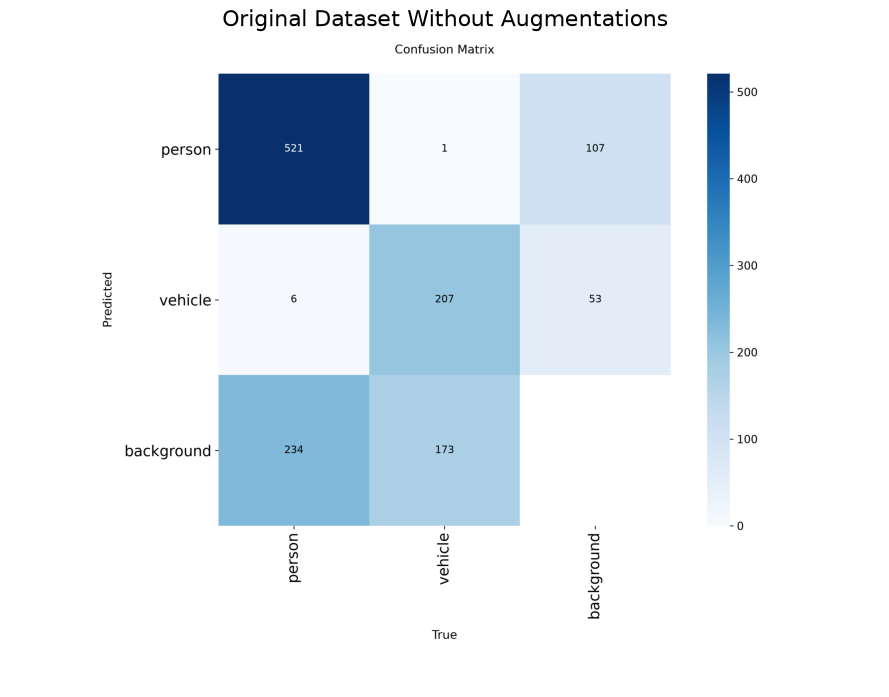

Original Dataset With Augmentations
Path: C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\evaluation_plots\yolo26n_no_aug_vs_aug\with_augmentations\confusion_matrix.png
Exists: True


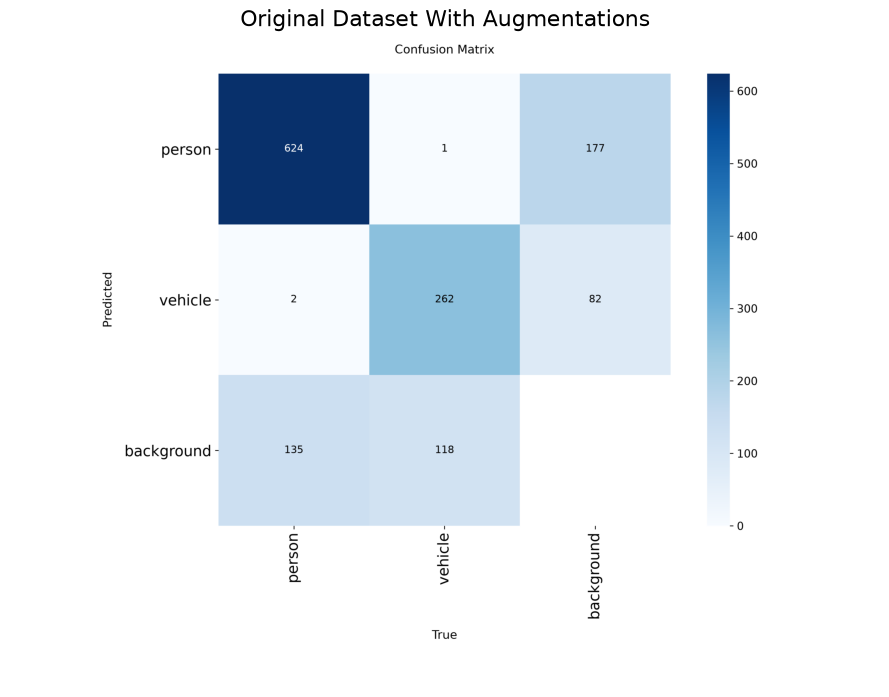

In [60]:
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# Display Confusion Matrices - Original Dataset Comparison


PROJECT_ROOT = Path.cwd()

if PROJECT_ROOT.name == "detect" and PROJECT_ROOT.parent.name == "runs":
    PROJECT_ROOT = PROJECT_ROOT.parent.parent

CONFUSION_MATRIX_PATHS = {
    "Original Dataset Without Augmentations": PROJECT_ROOT / "runs" / "detect" / "evaluation_plots" / "yolo26n_no_aug_vs_aug" / "no_augmentation_training" / "confusion_matrix.png",
    "Original Dataset With Augmentations": PROJECT_ROOT / "runs" / "detect" / "evaluation_plots" / "yolo26n_no_aug_vs_aug" / "with_augmentations" / "confusion_matrix.png"
}

for title, image_path in CONFUSION_MATRIX_PATHS.items():
    print("=" * 80)
    print(title)
    print("=" * 80)
    print("Path:", image_path)
    print("Exists:", image_path.exists())

    if not image_path.exists():
        print("Confusion matrix not found.")
        continue

    img = mpimg.imread(image_path)

    plt.figure(figsize=(9, 7))
    plt.imshow(img)
    plt.axis("off")
    plt.title(title, fontsize=16)
    plt.tight_layout()
    plt.show()

### Original Dataset Comparison Summary

In this comparison, YOLO26n was trained on the original YOLO dataset using two setups:

- Without training augmentations
- With training augmentations

The results show that the model trained with augmentations improved across all main validation metrics.

Precision increased from 0.79094 to 0.82749.  
Recall increased from 0.61950 to 0.71639.  
mAP50 increased from 0.68957 to 0.78622.  
mAP50-95 increased from 0.46574 to 0.56382.

The largest improvements were in recall and mAP scores.  
This means that the augmented model detected more relevant objects and generalized better to the validation set.

The confusion matrices also support this conclusion.  
The augmented model reduced missed detections for both classes:

- Missed `person` detections decreased from 234 to 135.
- Missed `vehicle` detections decreased from 173 to 118.

The training curves show that the augmented model had higher training losses, which is expected because the model was trained on harder augmented images.  
However, its validation metrics were better and continued improving for more epochs.

Overall, the results show that training augmentations improved YOLO26n performance on the original dataset, especially by improving recall and reducing missed detections.

#### Vehicle-Balanced Dataset: Without Augmentations vs With Augmentations

In this comparison, I evaluate YOLO26n on the vehicle-balanced dataset using two training setups:

- Vehicle-Balanced Dataset Without Augmentations
- Vehicle-Balanced Dataset With Augmentations

The no-augmentation run is used as a clean reference point for the vehicle-balanced dataset.

The augmentation run uses color changes, geometric transformations, horizontal flipping, mosaic, mixup, and copy-paste.

The goal of this comparison is to check whether training augmentations still improve validation performance after increasing the representation of vehicles in the training data.

This comparison helps analyze whether the vehicle-balanced dataset benefits from additional online training augmentations.

In [61]:
from pathlib import Path
import pandas as pd


# YOLO26n - Vehicle-Balanced Dataset: Without vs With Augmentations

BALANCED_DATASET_COMPARISON_RUNS = {
    "Vehicle-Balanced Dataset Without Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v4_vehicle_balanced_no_training_augmentations"
    ),
    "Vehicle-Balanced Dataset With Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v3_yolo_with_augmentations_vehicle_balanced_dataset"
    )
}


def is_training_run_complete(run_path):
    run_path = Path(run_path)

    return (
        (run_path / "weights" / "best.pt").exists()
        and (run_path / "results.csv").exists()
        and (run_path / "args.yaml").exists()
    )


def get_best_metrics(run_name, run_path):
    run_path = Path(run_path)
    results_csv_path = run_path / "results.csv"

    results_df = pd.read_csv(results_csv_path)
    results_df.columns = results_df.columns.str.strip()

    best_row_index = results_df["metrics/mAP50-95(B)"].idxmax()
    best_row = results_df.loc[best_row_index]

    return {
        "run": run_name,
        "precision": best_row["metrics/precision(B)"],
        "recall": best_row["metrics/recall(B)"],
        "mAP50": best_row["metrics/mAP50(B)"],
        "mAP50-95": best_row["metrics/mAP50-95(B)"],
        "best_epoch": int(best_row["epoch"]),
        "last_epoch": int(results_df["epoch"].iloc[-1])
    }


comparison_rows = []

for run_name, run_path in BALANCED_DATASET_COMPARISON_RUNS.items():
    if is_training_run_complete(run_path):
        comparison_rows.append(get_best_metrics(run_name, run_path))
    else:
        print(f"Run is missing or incomplete: {run_name}")
        print("Path:", run_path)


balanced_aug_comparison_df = pd.DataFrame(comparison_rows)

run_order = [
    "Vehicle-Balanced Dataset Without Augmentations",
    "Vehicle-Balanced Dataset With Augmentations"
]

balanced_aug_comparison_df["run"] = pd.Categorical(
    balanced_aug_comparison_df["run"],
    categories=run_order,
    ordered=True
)

balanced_aug_comparison_df = balanced_aug_comparison_df.sort_values("run").reset_index(drop=True)

balanced_aug_comparison_df = balanced_aug_comparison_df.round({
    "precision": 5,
    "recall": 5,
    "mAP50": 5,
    "mAP50-95": 5
})

display(balanced_aug_comparison_df)

,run,precision,recall,mAP50,mAP50-95,best_epoch,last_epoch
0,Vehicle-Balanced Dataset Without Augmentations,0.79616,0.60734,0.66274,0.45208,41,56
1,Vehicle-Balanced Dataset With Augmentations,0.80209,0.69027,0.77397,0.55341,76,91


In [62]:
# Vehicle-Balanced Dataset Comparison - Improvement Table


metrics_to_compare = ["precision", "recall", "mAP50", "mAP50-95"]

baseline_name = "Vehicle-Balanced Dataset Without Augmentations"
augmented_name = "Vehicle-Balanced Dataset With Augmentations"

baseline_row = balanced_aug_comparison_df[
    balanced_aug_comparison_df["run"].astype(str) == baseline_name
].iloc[0]

augmented_row = balanced_aug_comparison_df[
    balanced_aug_comparison_df["run"].astype(str) == augmented_name
].iloc[0]

improvement_rows = []

for metric in metrics_to_compare:
    baseline_value = baseline_row[metric]
    augmented_value = augmented_row[metric]

    absolute_improvement = augmented_value - baseline_value
    relative_improvement = (absolute_improvement / baseline_value) * 100

    improvement_rows.append({
        "metric": metric,
        "without_augmentations": baseline_value,
        "with_augmentations": augmented_value,
        "absolute_improvement": absolute_improvement,
        "relative_improvement_%": relative_improvement
    })

balanced_aug_improvement_df = pd.DataFrame(improvement_rows)

balanced_aug_improvement_df = balanced_aug_improvement_df.round({
    "without_augmentations": 5,
    "with_augmentations": 5,
    "absolute_improvement": 5,
    "relative_improvement_%": 2
})

display(balanced_aug_improvement_df)

,metric,without_augmentations,with_augmentations,absolute_improvement,relative_improvement_%
0,precision,0.79616,0.80209,0.00593,0.74
1,recall,0.60734,0.69027,0.08293,13.65
2,mAP50,0.66274,0.77397,0.11123,16.78
3,mAP50-95,0.45208,0.55341,0.10133,22.41


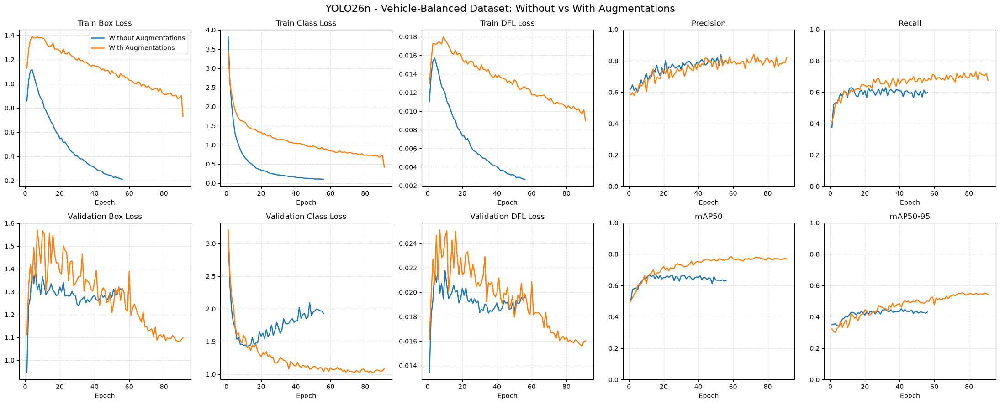

In [63]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt

# YOLO26n - Vehicle-Balanced Dataset: Training Curves Comparison
# Without Augmentations vs With Augmentations


BALANCED_CURVE_RUNS = {
    "Without Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v4_vehicle_balanced_no_training_augmentations"
    ),
    "With Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v3_yolo_with_augmentations_vehicle_balanced_dataset"
    )
}

curve_columns = [
    "train/box_loss",
    "train/cls_loss",
    "train/dfl_loss",
    "metrics/precision(B)",
    "metrics/recall(B)",
    "val/box_loss",
    "val/cls_loss",
    "val/dfl_loss",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)"
]

curve_titles = [
    "Train Box Loss",
    "Train Class Loss",
    "Train DFL Loss",
    "Precision",
    "Recall",
    "Validation Box Loss",
    "Validation Class Loss",
    "Validation DFL Loss",
    "mAP50",
    "mAP50-95"
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, column, title in zip(axes, curve_columns, curve_titles):
    for run_name, run_path in BALANCED_CURVE_RUNS.items():
        results_path = run_path / "results.csv"

        if not results_path.exists():
            print("Missing results.csv:", results_path)
            continue

        results_df = pd.read_csv(results_path)
        results_df.columns = results_df.columns.str.strip()

        if column not in results_df.columns:
            print(f"Missing column {column} in {results_path}")
            continue

        ax.plot(
            results_df["epoch"],
            results_df[column],
            label=run_name,
            linewidth=1.8
        )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

axes[0].legend()
plt.suptitle(
    "YOLO26n - Vehicle-Balanced Dataset: Without vs With Augmentations",
    fontsize=16
)
plt.tight_layout()
plt.show()

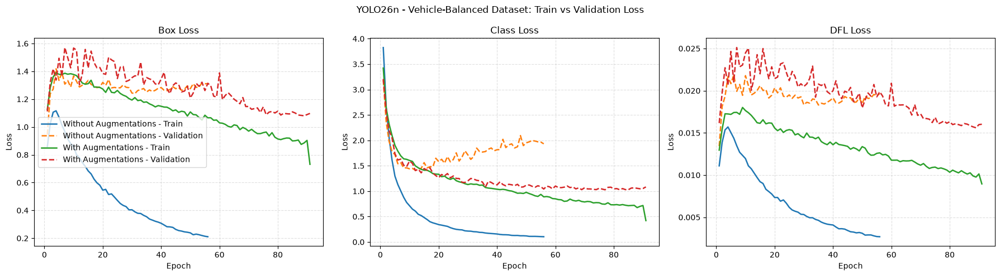

In [64]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# YOLO26n - Vehicle-Balanced Dataset: Train vs Validation Loss Curves


BALANCED_CURVE_RUNS = {
    "Without Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v4_vehicle_balanced_no_training_augmentations"
    ),
    "With Augmentations": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v3_yolo_with_augmentations_vehicle_balanced_dataset"
    )
}

loss_pairs = [
    ("Box Loss", "train/box_loss", "val/box_loss"),
    ("Class Loss", "train/cls_loss", "val/cls_loss"),
    ("DFL Loss", "train/dfl_loss", "val/dfl_loss")
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (title, train_col, val_col) in zip(axes, loss_pairs):
    for run_name, run_path in BALANCED_CURVE_RUNS.items():
        results_path = run_path / "results.csv"

        if not results_path.exists():
            print("Missing results.csv:", results_path)
            continue

        results_df = pd.read_csv(results_path)
        results_df.columns = results_df.columns.str.strip()

        ax.plot(
            results_df["epoch"],
            results_df[train_col],
            label=f"{run_name} - Train",
            linewidth=1.8
        )

        ax.plot(
            results_df["epoch"],
            results_df[val_col],
            label=f"{run_name} - Validation",
            linewidth=1.8,
            linestyle="--"
        )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.grid(True, linestyle="--", alpha=0.4)

axes[0].legend()
plt.suptitle("YOLO26n - Vehicle-Balanced Dataset: Train vs Validation Loss")
plt.tight_layout()
plt.show()

In [65]:
from pathlib import Path
import torch
from ultralytics import YOLO


# Create Confusion Matrices - Vehicle-Balanced Dataset Comparison


PROJECT_ROOT = Path.cwd().resolve()

if PROJECT_ROOT.name == "detect" and PROJECT_ROOT.parent.name == "runs":
    PROJECT_ROOT = PROJECT_ROOT.parent.parent

BALANCED_DATA_YAML_PATH = PROJECT_ROOT / "yolo_dataset_balanced" / "data.yaml"

EVAL_PROJECT_DIR = PROJECT_ROOT / "runs" / "detect" / "evaluation_plots" / "yolo26n_balanced_no_aug_vs_aug"

EVAL_IMG_SIZE = 640
EVAL_BATCH_SIZE = 16
TRAIN_DEVICE = 0 if torch.cuda.is_available() else "cpu"

EVALUATION_RUNS = {
    "Vehicle-Balanced Dataset Without Augmentations": {
        "weights": PROJECT_ROOT / "runs" / "detect" / "training_runs" / "augmentation_tests" / "yolo26n" / "v4_vehicle_balanced_no_training_augmentations" / "weights" / "best.pt",
        "eval_name": "balanced_without_augmentations"
    },
    "Vehicle-Balanced Dataset With Augmentations": {
        "weights": PROJECT_ROOT / "runs" / "detect" / "training_runs" / "augmentation_tests" / "yolo26n" / "v3_yolo_with_augmentations_vehicle_balanced_dataset" / "weights" / "best.pt",
        "eval_name": "balanced_with_augmentations"
    }
}

print("Evaluation project directory:")
print(EVAL_PROJECT_DIR)

for display_name, info in EVALUATION_RUNS.items():
    weights_path = info["weights"]
    eval_name = info["eval_name"]

    print("\n" + "=" * 80)
    print(display_name)
    print("=" * 80)
    print("Weights exist:", weights_path.exists())
    print("Weights path:", weights_path)

    if not weights_path.exists():
        print("Skipping because best.pt was not found.")
        continue

    model = YOLO(str(weights_path))

    metrics = model.val(
        data=str(BALANCED_DATA_YAML_PATH),
        imgsz=EVAL_IMG_SIZE,
        batch=EVAL_BATCH_SIZE,
        device=TRAIN_DEVICE,
        workers=0,
        plots=True,
        project=str(EVAL_PROJECT_DIR),
        name=eval_name,
        exist_ok=True
    )

print("\nFinished creating confusion matrices.")

Evaluation project directory:
C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\evaluation_plots\yolo26n_balanced_no_aug_vs_aug

Vehicle-Balanced Dataset Without Augmentations
Weights exist: True
Weights path: C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\training_runs\augmentation_tests\yolo26n\v4_vehicle_balanced_no_training_augmentations\weights\best.pt
Ultralytics 8.4.80  Python-3.12.13 torch-2.11.0+cu128 CUDA:0 (NVIDIA GeForce RTX 3050 Ti Laptop GPU, 4096MiB)
YOLO26n summary (fused): 122 layers, 2,375,226 parameters, 0 gradients, 5.2 GFLOPs
val: Fast image access  (ping: 0.10.0 ms, read: 155.058.6 MB/s, size: 136.3 KB)
val: Scanning C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\yolo_dataset_balanced\labels\val.cache... 240 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 240/240  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 15/15 3.1it

Vehicle-Balanced Dataset Without Augmentations
Path: C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\evaluation_plots\yolo26n_balanced_no_aug_vs_aug\balanced_without_augmentations\confusion_matrix.png
Exists: True


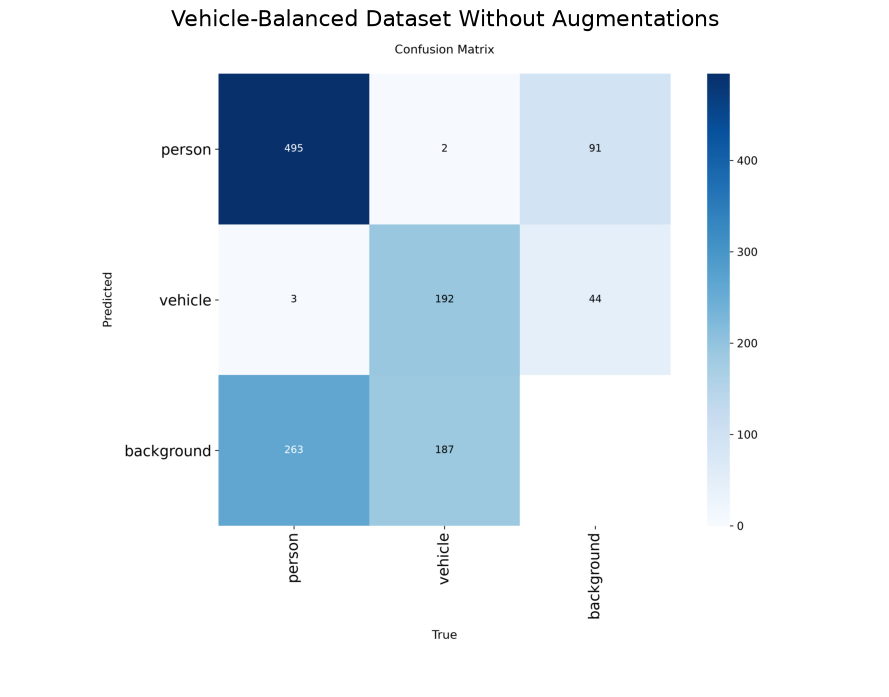

Vehicle-Balanced Dataset With Augmentations
Path: C:\Users\shaha\jupyter_notebooks\Computer_Vision\Final_project_1\runs\detect\evaluation_plots\yolo26n_balanced_no_aug_vs_aug\balanced_with_augmentations\confusion_matrix.png
Exists: True


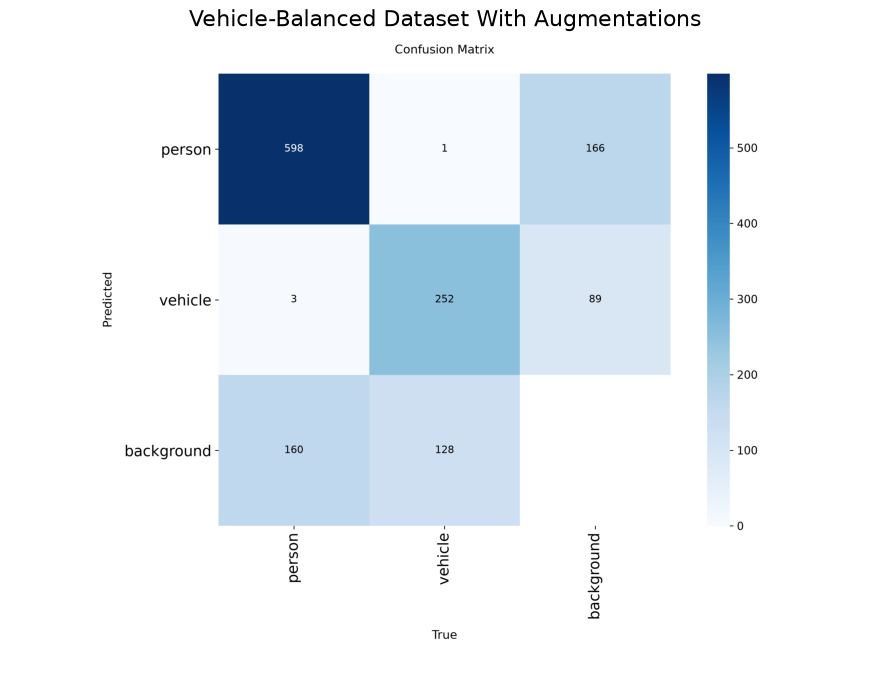

In [66]:
from pathlib import Path
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


# Display Confusion Matrices - Vehicle-Balanced Dataset Comparison


PROJECT_ROOT = Path.cwd().resolve()

if PROJECT_ROOT.name == "detect" and PROJECT_ROOT.parent.name == "runs":
    PROJECT_ROOT = PROJECT_ROOT.parent.parent

CONFUSION_MATRIX_PATHS = {
    "Vehicle-Balanced Dataset Without Augmentations": PROJECT_ROOT / "runs" / "detect" / "evaluation_plots" / "yolo26n_balanced_no_aug_vs_aug" / "balanced_without_augmentations" / "confusion_matrix.png",
    "Vehicle-Balanced Dataset With Augmentations": PROJECT_ROOT / "runs" / "detect" / "evaluation_plots" / "yolo26n_balanced_no_aug_vs_aug" / "balanced_with_augmentations" / "confusion_matrix.png"
}

for title, image_path in CONFUSION_MATRIX_PATHS.items():
    print("=" * 80)
    print(title)
    print("=" * 80)
    print("Path:", image_path)
    print("Exists:", image_path.exists())

    if not image_path.exists():
        print("Confusion matrix not found.")
        continue

    img = mpimg.imread(image_path)

    plt.figure(figsize=(9, 7))
    plt.imshow(img)
    plt.axis("off")
    plt.title(title, fontsize=16)
    plt.tight_layout()
    plt.show()

### Vehicle-Balanced Dataset Comparison Summary

In this comparison, YOLO26n was trained on the vehicle-balanced dataset using two setups:

- Without training augmentations
- With training augmentations

The results show that adding augmentations on top of the vehicle-balanced dataset improved most of the main validation metrics.

Precision increased slightly from 0.79616 to 0.80209.  
Recall increased from 0.60734 to 0.69027.  
mAP50 increased from 0.66274 to 0.77397.  
mAP50-95 increased from 0.45208 to 0.55341.

The strongest improvements were in recall and mAP scores.  
This means that the augmented model detected more relevant objects and generalized better to the validation set.

The confusion matrices also support this conclusion.  
The augmented model reduced missed detections for both classes:

- Missed `person` detections decreased from 263 to 160.
- Missed `vehicle` detections decreased from 187 to 128.

Correct detections also increased:

- Correct `person` detections increased from 495 to 598.
- Correct `vehicle` detections increased from 192 to 252.

However, the augmented model also produced more background-related false positives.  
This explains why the precision improvement was small compared to the larger improvement in recall and mAP.

Overall, the vehicle-balanced dataset benefited from additional training augmentations.  
The augmented model achieved better recall, higher mAP50, higher mAP50-95, and fewer missed detections.

### Final Comparison: Best Original Dataset Model vs Best Vehicle-Balanced Dataset Model

After comparing the models inside each dataset setting, I compare the best model from the original dataset experiments with the best model from the vehicle-balanced dataset experiments.

The best model in each group is selected automatically according to the highest `mAP50-95`.

This final comparison helps check which training strategy achieved the best overall validation performance.

,run,precision,recall,mAP50,mAP50-95,best_epoch,last_epoch
0,Original Dataset With Augmentations,0.82749,0.71639,0.78622,0.56382,89,100
1,Vehicle-Balanced Dataset With Augmentations,0.80209,0.69027,0.77397,0.55341,76,91


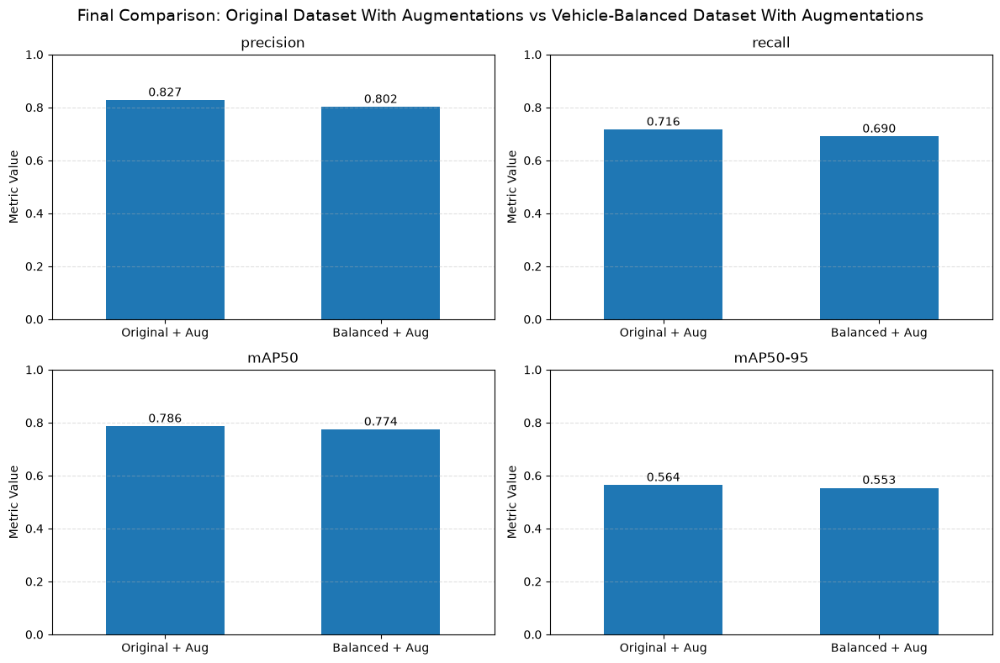

In [67]:
import pandas as pd
import matplotlib.pyplot as plt


# Final Comparison - Best Original Dataset Model vs Best Vehicle-Balanced Model


# Select the winner from the original dataset comparison
best_original_model = original_aug_comparison_df[
    original_aug_comparison_df["run"].astype(str) == "Original Dataset With Augmentations"
].iloc[0]

# Select the winner from the vehicle-balanced dataset comparison
best_balanced_model = balanced_aug_comparison_df[
    balanced_aug_comparison_df["run"].astype(str) == "Vehicle-Balanced Dataset With Augmentations"
].iloc[0]

# Create final comparison table
final_best_models_df = pd.DataFrame([
    best_original_model,
    best_balanced_model
]).reset_index(drop=True)

# Keep only relevant columns if they exist
columns_to_show = ["run", "precision", "recall", "mAP50", "mAP50-95"]

if "best_epoch" in final_best_models_df.columns:
    columns_to_show.append("best_epoch")

if "last_epoch" in final_best_models_df.columns:
    columns_to_show.append("last_epoch")

final_best_models_df = final_best_models_df[columns_to_show].round(5)

display(final_best_models_df)



# Small comparison graphs


metrics_to_plot = ["precision", "recall", "mAP50", "mAP50-95"]

plot_df = final_best_models_df.copy()

plot_df["plot_label"] = [
    "Original + Aug",
    "Balanced + Aug"
]

fig, axes = plt.subplots(2, 2, figsize=(12, 8))
axes = axes.flatten()

for ax, metric in zip(axes, metrics_to_plot):
    metric_values = plot_df.set_index("plot_label")[metric]

    metric_values.plot(
        kind="bar",
        ax=ax,
        width=0.55
    )

    ax.set_title(metric)
    ax.set_ylabel("Metric Value")
    ax.set_xlabel("")
    ax.set_ylim(0, 1)
    ax.grid(axis="y", linestyle="--", alpha=0.4)
    ax.tick_params(axis="x", rotation=0)

    for index, value in enumerate(metric_values.values):
        ax.text(
            index,
            value + 0.015,
            f"{value:.3f}",
            ha="center",
            fontsize=10
        )

plt.suptitle(
    "Final Comparison: Original Dataset With Augmentations vs Vehicle-Balanced Dataset With Augmentations",
    fontsize=14
)
plt.tight_layout()
plt.show()

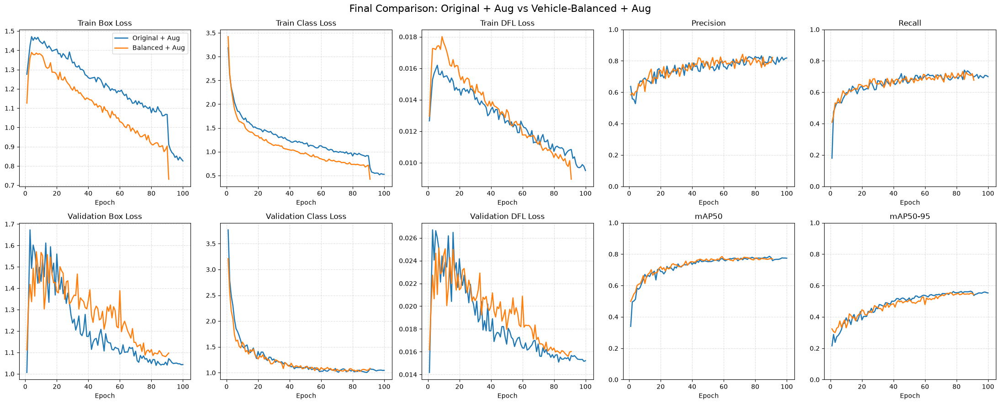

In [68]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# Final Comparison - Training Curves
# Original Dataset With Augmentations vs Vehicle-Balanced Dataset With Augmentations


BEST_MODEL_CURVE_RUNS = {
    "Original + Aug": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v2_yolo_with_augmentations"
    ),
    "Balanced + Aug": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v3_yolo_with_augmentations_vehicle_balanced_dataset"
    )
}

curve_columns = [
    "train/box_loss",
    "train/cls_loss",
    "train/dfl_loss",
    "metrics/precision(B)",
    "metrics/recall(B)",
    "val/box_loss",
    "val/cls_loss",
    "val/dfl_loss",
    "metrics/mAP50(B)",
    "metrics/mAP50-95(B)"
]

curve_titles = [
    "Train Box Loss",
    "Train Class Loss",
    "Train DFL Loss",
    "Precision",
    "Recall",
    "Validation Box Loss",
    "Validation Class Loss",
    "Validation DFL Loss",
    "mAP50",
    "mAP50-95"
]

fig, axes = plt.subplots(2, 5, figsize=(22, 9))
axes = axes.flatten()

for ax, column, title in zip(axes, curve_columns, curve_titles):
    for run_name, run_path in BEST_MODEL_CURVE_RUNS.items():
        results_path = run_path / "results.csv"

        if not results_path.exists():
            print("Missing results.csv:", results_path)
            continue

        results_df = pd.read_csv(results_path)
        results_df.columns = results_df.columns.str.strip()

        if column not in results_df.columns:
            print(f"Missing column {column} in {results_path}")
            continue

        ax.plot(
            results_df["epoch"],
            results_df[column],
            label=run_name,
            linewidth=1.8
        )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.grid(True, linestyle="--", alpha=0.4)

    if "metrics" in column:
        ax.set_ylim(0, 1)

axes[0].legend()
plt.suptitle(
    "Final Comparison: Original + Aug vs Vehicle-Balanced + Aug",
    fontsize=16
)
plt.tight_layout()
plt.show()

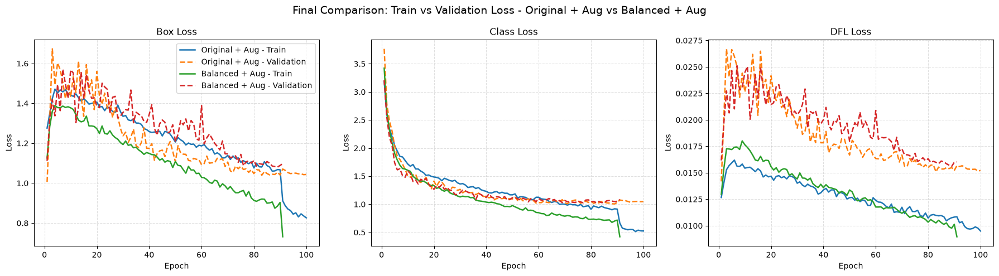

In [69]:
from pathlib import Path
import pandas as pd
import matplotlib.pyplot as plt


# Final Comparison - Train vs Validation Loss
# Original Dataset With Augmentations vs Vehicle-Balanced Dataset With Augmentations


BEST_MODEL_CURVE_RUNS = {
    "Original + Aug": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v2_yolo_with_augmentations"
    ),
    "Balanced + Aug": Path(
        "runs/detect/training_runs/augmentation_tests/yolo26n/v3_yolo_with_augmentations_vehicle_balanced_dataset"
    )
}

loss_pairs = [
    ("Box Loss", "train/box_loss", "val/box_loss"),
    ("Class Loss", "train/cls_loss", "val/cls_loss"),
    ("DFL Loss", "train/dfl_loss", "val/dfl_loss")
]

fig, axes = plt.subplots(1, 3, figsize=(18, 5))

for ax, (title, train_col, val_col) in zip(axes, loss_pairs):
    for run_name, run_path in BEST_MODEL_CURVE_RUNS.items():
        results_path = run_path / "results.csv"

        if not results_path.exists():
            print("Missing results.csv:", results_path)
            continue

        results_df = pd.read_csv(results_path)
        results_df.columns = results_df.columns.str.strip()

        ax.plot(
            results_df["epoch"],
            results_df[train_col],
            label=f"{run_name} - Train",
            linewidth=1.8
        )

        ax.plot(
            results_df["epoch"],
            results_df[val_col],
            label=f"{run_name} - Validation",
            linewidth=1.8,
            linestyle="--"
        )

    ax.set_title(title)
    ax.set_xlabel("Epoch")
    ax.set_ylabel("Loss")
    ax.grid(True, linestyle="--", alpha=0.4)

axes[0].legend()
plt.suptitle(
    "Final Comparison: Train vs Validation Loss - Original + Aug vs Balanced + Aug",
    fontsize=14
)
plt.tight_layout()
plt.show()

### Final Comparison Summary

After comparing the best model from the original dataset experiments with the best model from the vehicle-balanced dataset experiments, the results show that the best overall model was **YOLO26n trained on the original dataset with augmentations**.

This model achieved higher precision, recall, mAP50, and mAP50-95 compared to the best vehicle-balanced model.

The vehicle-balanced dataset did improve when augmentations were added, but it still did not outperform the original dataset with augmentations.

### 2.9 Final Training Insights

In this part of the project, I trained and compared several lightweight YOLO models on the custom dataset created in Part 1.

First, I compared YOLOv8n, YOLO11n, and YOLO26n under the same baseline training setup.  
YOLO26n achieved the best balance between validation performance and efficiency, with strong mAP results and lower computational cost.  
Because the project focuses on efficient inference and possible edge-oriented deployment, YOLO26n was selected as the main model for the next experiments.

After selecting YOLO26n, I trained it in two dataset settings:

- Original YOLO dataset
- Vehicle-balanced YOLO dataset

For each dataset setting, I compared training without augmentations against training with augmentations.

On the original dataset, augmentations improved all main validation metrics.  
Recall, mAP50, and mAP50-95 increased, and the confusion matrices showed fewer missed detections for both `person` and `vehicle`.

On the vehicle-balanced dataset, augmentations also improved performance compared to training without augmentations.  
The model detected more true objects and reduced missed detections.

Finally, I compared the best model from the original dataset experiments with the best model from the vehicle-balanced dataset experiments.  
The best overall model was **YOLO26n trained on the original dataset with augmentations**.

Although the vehicle-balanced dataset improved with augmentations, it did not outperform the original dataset with augmentations.  
One possible explanation is that the vehicle-balanced dataset already included vehicle-focused augmentation during dataset preparation, so adding more online augmentations may have over-augmented some vehicle examples.

Therefore, the final selected training configuration is:

**YOLO26n - Original Dataset With Augmentations**

This model was selected because it achieved the best overall validation performance while keeping the model lightweight and efficient.

#### Future Work

In future work, the dataset can be improved by manually reviewing and correcting part of the automatic Florence-2 annotations.  
This can reduce label noise and improve the quality of the bounding boxes.

Another possible improvement is to increase the dataset size and add more diverse images, especially images with small, partially hidden, or crowded `person` and `vehicle` objects.

The model can also be tested on external images that were not taken from the original dataset, in order to better evaluate real-world generalization.

In addition, more augmentation tuning can be tested.  
This includes different values for mosaic, mixup, copy-paste, scale, and close_mosaic.

Since the vehicle-balanced dataset already included vehicle-focused augmentation during dataset preparation, future experiments should also test weaker online augmentations on the balanced dataset.  
This may help avoid over-augmenting vehicle examples while still improving recall.

Finally, the selected YOLO26n model can be exported and tested on an edge device such as Jetson or Raspberry Pi to measure real inference speed, memory usage, and deployment performance.

#### Appendix - Creating the Vehicle-Balanced Dataset

To improve the representation of the `vehicle` class, I created an additional vehicle-balanced dataset.

This dataset was created from the original YOLO dataset, but the original dataset was not changed.

The original training and validation folders were copied into a new dataset folder called `yolo_dataset_balanced`.

The validation set was kept unchanged in order to keep the evaluation fair and comparable to the original dataset experiments.

Only the training set was expanded.

To create additional vehicle examples, I used vehicle-centered crops from the original training images.  
Each crop was created around an existing `vehicle` bounding box, while keeping some surrounding context from the image.

For each new cropped image, I recalculated the YOLO labels so that the bounding boxes matched the new crop coordinates.

Only crops that contained at least one `vehicle` object were kept.  
Crops with too many `person` objects were ignored, because the goal was to increase the representation of vehicles without adding too many additional person examples.

After creating the vehicle-centered crops, I applied simple visual augmentations to increase vehicle diversity:

- Brightness increase
- Contrast increase
- Darker image version
- Horizontal flip

The goal of this process was to increase the number of vehicle examples in the training data and create a more balanced dataset for comparison.

The balanced dataset was later used in two experiments:

- YOLO26n trained on the vehicle-balanced dataset without online training augmentations
- YOLO26n trained on the vehicle-balanced dataset with online training augmentations

This allowed me to compare whether improving the representation of vehicles in the training data helped the model, and whether additional YOLO training augmentations still improved performance on the balanced dataset.

In [70]:
# from pathlib import Path
# from PIL import Image, ImageEnhance
# import shutil
# import random
# import yaml


# # Helper functions for creating a vehicle-balanced YOLO dataset


# def reset_folder(path):
#     if path.exists():
#         shutil.rmtree(path)
#     path.mkdir(parents=True, exist_ok=True)


# def copy_files(src_dir, dst_dir, pattern):
#     for file_path in src_dir.glob(pattern):
#         if file_path.is_file():
#             shutil.copy2(file_path, dst_dir / file_path.name)


# def read_yolo_labels(label_path):
#     if not label_path.exists():
#         return []

#     text = label_path.read_text(encoding="utf-8").strip()

#     if text == "":
#         return []

#     labels = []

#     for line in text.splitlines():
#         parts = line.strip().split()

#         if len(parts) != 5:
#             continue

#         try:
#             labels.append([
#                 int(parts[0]),
#                 float(parts[1]),
#                 float(parts[2]),
#                 float(parts[3]),
#                 float(parts[4])
#             ])
#         except ValueError:
#             continue

#     return labels


# def write_yolo_labels(label_path, labels):
#     lines = []

#     for class_id, x_center, y_center, width, height in labels:
#         lines.append(
#             f"{int(class_id)} {x_center:.6f} {y_center:.6f} {width:.6f} {height:.6f}"
#         )

#     label_path.write_text("\n".join(lines), encoding="utf-8")


# def count_objects(labels):
#     person_count = sum(1 for label in labels if label[0] == 0)
#     vehicle_count = sum(1 for label in labels if label[0] == 1)

#     return person_count, vehicle_count


# def count_dataset_objects(label_dir):
#     person_total = 0
#     vehicle_total = 0

#     for label_path in label_dir.glob("*.txt"):
#         labels = read_yolo_labels(label_path)
#         person_count, vehicle_count = count_objects(labels)

#         person_total += person_count
#         vehicle_total += vehicle_count

#     return person_total, vehicle_total


# def find_matching_image(image_dir, label_path):
#     for ext in [".jpg", ".jpeg", ".png"]:
#         image_path = image_dir / f"{label_path.stem}{ext}"

#         if image_path.exists():
#             return image_path

#     return None


# def yolo_to_pixel(label, image_width, image_height):
#     class_id, x_center, y_center, width, height = label

#     box_width = width * image_width
#     box_height = height * image_height

#     box_center_x = x_center * image_width
#     box_center_y = y_center * image_height

#     x1 = box_center_x - box_width / 2
#     y1 = box_center_y - box_height / 2
#     x2 = box_center_x + box_width / 2
#     y2 = box_center_y + box_height / 2

#     return class_id, x1, y1, x2, y2


# def make_crop_around_vehicle(vehicle_label, image_width, image_height):
#     _, x1, y1, x2, y2 = yolo_to_pixel(
#         vehicle_label,
#         image_width,
#         image_height
#     )

#     box_width = x2 - x1
#     box_height = y2 - y1

#     center_x = (x1 + x2) / 2
#     center_y = (y1 + y2) / 2

#     crop_width = max(box_width * 2.2, image_width * 0.35)
#     crop_height = max(box_height * 2.2, image_height * 0.35)

#     crop_width = min(crop_width, image_width)
#     crop_height = min(crop_height, image_height)

#     left = center_x - crop_width / 2
#     top = center_y - crop_height / 2

#     left = max(0, min(left, image_width - crop_width))
#     top = max(0, min(top, image_height - crop_height))

#     right = left + crop_width
#     bottom = top + crop_height

#     return int(left), int(top), int(right), int(bottom)


# def crop_image_and_update_labels(image, labels, crop_box, min_visible_ratio):
#     image_width, image_height = image.size

#     left, top, right, bottom = crop_box

#     crop_width = right - left
#     crop_height = bottom - top

#     cropped_image = image.crop((left, top, right, bottom))
#     new_labels = []

#     for label in labels:
#         class_id, x1, y1, x2, y2 = yolo_to_pixel(
#             label,
#             image_width,
#             image_height
#         )

#         original_area = max(0, x2 - x1) * max(0, y2 - y1)

#         if original_area <= 0:
#             continue

#         clipped_x1 = max(x1, left)
#         clipped_y1 = max(y1, top)
#         clipped_x2 = min(x2, right)
#         clipped_y2 = min(y2, bottom)

#         clipped_width = clipped_x2 - clipped_x1
#         clipped_height = clipped_y2 - clipped_y1

#         if clipped_width <= 2 or clipped_height <= 2:
#             continue

#         visible_ratio = (clipped_width * clipped_height) / original_area

#         if visible_ratio < min_visible_ratio:
#             continue

#         new_x1 = clipped_x1 - left
#         new_y1 = clipped_y1 - top
#         new_x2 = clipped_x2 - left
#         new_y2 = clipped_y2 - top

#         new_x_center = ((new_x1 + new_x2) / 2) / crop_width
#         new_y_center = ((new_y1 + new_y2) / 2) / crop_height
#         new_width = (new_x2 - new_x1) / crop_width
#         new_height = (new_y2 - new_y1) / crop_height

#         if 0 <= new_x_center <= 1 and 0 <= new_y_center <= 1:
#             if 0 < new_width <= 1 and 0 < new_height <= 1:
#                 new_labels.append([
#                     class_id,
#                     new_x_center,
#                     new_y_center,
#                     new_width,
#                     new_height
#                 ])

#     return cropped_image, new_labels


# def apply_crop_augmentation(image, labels, augmentation_name):
#     if augmentation_name == "crop_only":
#         return image, labels

#     if augmentation_name == "brighter":
#         return ImageEnhance.Brightness(image).enhance(1.25), labels

#     if augmentation_name == "higher_contrast":
#         return ImageEnhance.Contrast(image).enhance(1.30), labels

#     if augmentation_name == "darker":
#         return ImageEnhance.Brightness(image).enhance(0.85), labels

#     if augmentation_name == "flipped":
#         flipped_image = image.transpose(Image.Transpose.FLIP_LEFT_RIGHT)

#         flipped_labels = []

#         for class_id, x_center, y_center, width, height in labels:
#             flipped_labels.append([
#                 class_id,
#                 1.0 - x_center,
#                 y_center,
#                 width,
#                 height
#             ])

#         return flipped_image, flipped_labels

#     raise ValueError(f"Unknown augmentation: {augmentation_name}")

In [71]:

# # Create vehicle-focused balanced YOLO dataset


# SOURCE_DATASET_DIR = Path("yolo_dataset")
# OUTPUT_DATASET_DIR = Path("yolo_dataset_balanced")

# FORCE_RECREATE = False

# TARGET_VEHICLE_TO_PERSON_RATIO = 0.90
# MAX_NEW_CROP_IMAGES = 1800
# MAX_PERSON_OBJECTS_IN_CROP = 1
# MIN_VISIBLE_RATIO = 0.40

# random.seed(42)

# SRC_TRAIN_IMAGES_DIR = SOURCE_DATASET_DIR / "images" / "train"
# SRC_TRAIN_LABELS_DIR = SOURCE_DATASET_DIR / "labels" / "train"

# SRC_VAL_IMAGES_DIR = SOURCE_DATASET_DIR / "images" / "val"
# SRC_VAL_LABELS_DIR = SOURCE_DATASET_DIR / "labels" / "val"

# OUT_TRAIN_IMAGES_DIR = OUTPUT_DATASET_DIR / "images" / "train"
# OUT_TRAIN_LABELS_DIR = OUTPUT_DATASET_DIR / "labels" / "train"

# OUT_VAL_IMAGES_DIR = OUTPUT_DATASET_DIR / "images" / "val"
# OUT_VAL_LABELS_DIR = OUTPUT_DATASET_DIR / "labels" / "val"

# OUT_DATA_YAML_PATH = OUTPUT_DATASET_DIR / "data.yaml"


# def balanced_dataset_ready():
#     return (
#         OUTPUT_DATASET_DIR.exists()
#         and OUT_DATA_YAML_PATH.exists()
#         and OUT_TRAIN_IMAGES_DIR.exists()
#         and OUT_TRAIN_LABELS_DIR.exists()
#         and OUT_VAL_IMAGES_DIR.exists()
#         and OUT_VAL_LABELS_DIR.exists()
#         and len(list(OUT_TRAIN_IMAGES_DIR.glob("*"))) > 0
#         and len(list(OUT_TRAIN_LABELS_DIR.glob("*.txt"))) > 0
#         and len(list(OUT_VAL_IMAGES_DIR.glob("*"))) > 0
#         and len(list(OUT_VAL_LABELS_DIR.glob("*.txt"))) > 0
#     )


# if balanced_dataset_ready() and not FORCE_RECREATE:
#     print("Vehicle-balanced dataset already exists. Skipping creation.")
#     print("Dataset:", OUTPUT_DATASET_DIR)
#     print("Train images:", len(list(OUT_TRAIN_IMAGES_DIR.glob("*"))))
#     print("Train labels:", len(list(OUT_TRAIN_LABELS_DIR.glob("*.txt"))))
#     print("Validation images:", len(list(OUT_VAL_IMAGES_DIR.glob("*"))))
#     print("Validation labels:", len(list(OUT_VAL_LABELS_DIR.glob("*.txt"))))
#     print("data.yaml:", OUT_DATA_YAML_PATH)

# else:
#     print("Creating vehicle-balanced dataset...")
#     print("-" * 60)

#     for folder in [
#         OUT_TRAIN_IMAGES_DIR,
#         OUT_TRAIN_LABELS_DIR,
#         OUT_VAL_IMAGES_DIR,
#         OUT_VAL_LABELS_DIR
#     ]:
#         reset_folder(folder)

#     copy_files(SRC_TRAIN_IMAGES_DIR, OUT_TRAIN_IMAGES_DIR, "*")
#     copy_files(SRC_TRAIN_LABELS_DIR, OUT_TRAIN_LABELS_DIR, "*.txt")

#     copy_files(SRC_VAL_IMAGES_DIR, OUT_VAL_IMAGES_DIR, "*")
#     copy_files(SRC_VAL_LABELS_DIR, OUT_VAL_LABELS_DIR, "*.txt")

#     person_objects, vehicle_objects = count_dataset_objects(OUT_TRAIN_LABELS_DIR)

#     print("Before vehicle-focused crops:")
#     print("Train images:", len(list(OUT_TRAIN_IMAGES_DIR.glob("*"))))
#     print("Train label files:", len(list(OUT_TRAIN_LABELS_DIR.glob("*.txt"))))
#     print("Person objects:", person_objects)
#     print("Vehicle objects:", vehicle_objects)
#     print("Vehicle/person ratio:", round(vehicle_objects / person_objects, 3))
#     print()

#     crop_candidates = []

#     for label_path in SRC_TRAIN_LABELS_DIR.glob("*.txt"):
#         labels = read_yolo_labels(label_path)
#         person_count, vehicle_count = count_objects(labels)

#         if vehicle_count == 0:
#             continue

#         image_path = find_matching_image(SRC_TRAIN_IMAGES_DIR, label_path)

#         if image_path is None:
#             continue

#         vehicle_labels = [label for label in labels if label[0] == 1]
#         base_score = vehicle_count / (person_count + 1)

#         for vehicle_label in vehicle_labels:
#             crop_candidates.append({
#                 "image_path": image_path,
#                 "labels": labels,
#                 "vehicle_label": vehicle_label,
#                 "base_score": base_score,
#                 "person_count": person_count,
#                 "vehicle_count": vehicle_count
#             })

#     crop_candidates = sorted(
#         crop_candidates,
#         key=lambda x: (x["base_score"], x["vehicle_count"], -x["person_count"]),
#         reverse=True
#     )

#     print("Vehicle crop candidates:", len(crop_candidates))

#     if len(crop_candidates) == 0:
#         raise ValueError("No vehicle crop candidates were found.")

#     augmentation_names = [
#         "crop_only",
#         "brighter",
#         "higher_contrast",
#         "flipped",
#         "darker"
#     ]

#     added_images = 0
#     candidate_index = 0
#     attempts = 0
#     max_attempts = MAX_NEW_CROP_IMAGES * 20

#     while vehicle_objects / person_objects < TARGET_VEHICLE_TO_PERSON_RATIO:
#         if added_images >= MAX_NEW_CROP_IMAGES:
#             print("Reached MAX_NEW_CROP_IMAGES limit.")
#             break

#         if attempts >= max_attempts:
#             print("Reached max attempts limit.")
#             break

#         candidate = crop_candidates[candidate_index % len(crop_candidates)]
#         augmentation_name = augmentation_names[added_images % len(augmentation_names)]

#         candidate_index += 1
#         attempts += 1

#         try:
#             image = Image.open(candidate["image_path"]).convert("RGB")
#         except Exception:
#             continue

#         crop_box = make_crop_around_vehicle(
#             candidate["vehicle_label"],
#             image.width,
#             image.height
#         )

#         cropped_image, cropped_labels = crop_image_and_update_labels(
#             image=image,
#             labels=candidate["labels"],
#             crop_box=crop_box,
#             min_visible_ratio=MIN_VISIBLE_RATIO
#         )

#         crop_person_count, crop_vehicle_count = count_objects(cropped_labels)

#         if crop_vehicle_count == 0:
#             continue

#         if crop_person_count > MAX_PERSON_OBJECTS_IN_CROP:
#             continue

#         augmented_image, augmented_labels = apply_crop_augmentation(
#             cropped_image,
#             cropped_labels,
#             augmentation_name
#         )

#         aug_person_count, aug_vehicle_count = count_objects(augmented_labels)

#         if aug_vehicle_count == 0:
#             continue

#         if aug_person_count > MAX_PERSON_OBJECTS_IN_CROP:
#             continue

#         new_stem = f"vehicle_crop_{added_images + 1:06d}_{augmentation_name}"

#         new_image_path = OUT_TRAIN_IMAGES_DIR / f"{new_stem}.jpg"
#         new_label_path = OUT_TRAIN_LABELS_DIR / f"{new_stem}.txt"

#         augmented_image.save(new_image_path, quality=95)
#         write_yolo_labels(new_label_path, augmented_labels)

#         added_images += 1
#         person_objects += aug_person_count
#         vehicle_objects += aug_vehicle_count

#         if added_images % 100 == 0:
#             print(
#                 "Added crop images:", added_images,
#                 "| Person objects:", person_objects,
#                 "| Vehicle objects:", vehicle_objects,
#                 "| Ratio:", round(vehicle_objects / person_objects, 3)
#             )

#     data_yaml = {
#         "path": str(OUTPUT_DATASET_DIR.resolve()).replace("\\", "/"),
#         "train": "images/train",
#         "val": "images/val",
#         "names": {
#             0: "person",
#             1: "vehicle"
#         }
#     }

#     with open(OUT_DATA_YAML_PATH, "w", encoding="utf-8") as f:
#         yaml.safe_dump(
#             data_yaml,
#             f,
#             sort_keys=False,
#             allow_unicode=True
#         )

#     print()
#     print("After vehicle-focused crops:")
#     print("-" * 60)
#     print("Added crop images:", added_images)
#     print("Train images:", len(list(OUT_TRAIN_IMAGES_DIR.glob("*"))))
#     print("Train label files:", len(list(OUT_TRAIN_LABELS_DIR.glob("*.txt"))))
#     print("Person objects:", person_objects)
#     print("Vehicle objects:", vehicle_objects)
#     print("Vehicle/person ratio:", round(vehicle_objects / person_objects, 3))

#     print()
#     print("Validation unchanged:")
#     print("-" * 60)
#     print("Validation images:", len(list(OUT_VAL_IMAGES_DIR.glob("*"))))
#     print("Validation label files:", len(list(OUT_VAL_LABELS_DIR.glob("*.txt"))))

#     print()
#     print("Saved to:")
#     print(OUTPUT_DATASET_DIR)
#     print("data.yaml:", OUT_DATA_YAML_PATH)